In [ ]:
# Agregar para que el notebook vea los cambios realizados en los modulos que
# utiliza.
%reload_ext autoreload
%autoreload 2

In [ ]:
#!/usr/bin/env python3
from utils.blast_utils import retrieve_nhits_alignments, blastn_subject, makeblast_db, blastn, default_blast_columns
from utils.block_utils import align_seed_neighbours, find_block_boundaries, plot_consensus_frequency, plot_windowed_metrics, extend_seeds_to_blocks

import matplotlib.pyplot as plt
from pathlib import Path
from Bio import SeqIO
import pandas as pd
import numpy as np
import argparse
import re

input_reads_fasta =  Path('/home/jpereira/OEs/Results/OE1/ToxoPasteur1/Data/mcl_clustering/sequneces_clusters/cluster_1.fasta')

input_fragments_fasta =  Path('/home/jpereira/OEs/Results/OE1/ToxoPasteur1/Data/Blocks/block_iterations/1/retrieve/regions.fasta')
input_fragments_fasta =  Path('/home/jpereira/OEs/Results/OE1/NamSeqs/Data/Blocks/block_iterations/1/regions.fasta')
input_fragments_fasta =  Path('/home/jpereira/OEs/Results/OE1/NamSeqs/Data/make_seeds/single_95_95/block_iterations/1/retrieve/regions.fasta')
input_fragments_fasta =  Path('/home/jpereira/OEs/Results/OE1/NamSeqs/Data/make_seeds/all_95_95/block_iterations/1/retrieve/regions.fasta')
input_fragments_fasta =  Path('/home/jpereira/OEs/Results/OE1/NamSeqs/Data/make_seeds/all_93_93/block_iterations/1/retrieve/regions.fasta')
input_fragments_fasta =  Path('/home/jpereira/OEs/Results/OE1/NamSeqs/Data/make_seeds/all_97_97/block_iterations/1/retrieve/regions.fasta')

output_dir = Path('/home/jpereira/OEs/Results/OE1/ToxoPasteur1/Data/Block_extension')
output_dir = Path('/home/jpereira/OEs/Results/OE1/NamSeqs/Data/Block_extension')

work_name = 'all_95_95'
work_name = 'all_93_93'
work_name = 'all_97_97'
work_name = 'all_97_97_slice_Mp_B'
work_name = 'all_97_97_s70'
work_name = 'kmer30'
work_name = 'kmer30_k:5028_c:49'
work_name = 'test'

test = True
if test:
    input_reads_fasta =  Path('/home/jpereira/OEs/Results/OE1/NamSeqs/Data/mcl_clustering/sequneces_clusters/cluster_1.fasta')
    input_seeds_tsv = Path('/home/jpereira/OEs/Results/OE1/NamSeqs/Data/make_seeds/kmer30/cluster_1_kmers.tsv')
    params_min_hits                    = 30
    params_max_aln_extension           = 3000
    params_seed_map_coverage_threshold = 0.8
    params_window_radius               = 15
    params_signal_threshold            = 0.10
    params_aln_w_step_size             = 100
    params_try_mean_signal             = True
    params_mean_signal_threshold       = 0.06
    params_plot                        = True

    output_dir = Path('/home/jpereira/OEs/Results/OE1/NamSeqs/Data/seed_extension')

else:
    parser = argparse.ArgumentParser(description="Determine full recombinant-tract boundaries")
    parser.add_argument("--input-fragment-fasta", required=True,help="FASTA file with the known recombinant fragment")
    parser.add_argument("--input-reads-fasta", required=True,help="FASTA or FASTQ file of sequencing reads to search")
    parser.add_argument("--params-seed-coverage-threshold", type=float, default=0.5,help="Fraction of reads that must cover an MSA column to be valid")
    parser.add_argument("--work-name", type=str)
    parser.add_argument("--output-dir", type=str)
    args = parser.parse_args()
    
    input_fragments_fasta = args.input_fragment_fasta
    input_reads_fasta = args.input_reads_fasta
    params_coverage_threshold = args.params_coverage_threshold
    output_dir = args.output_dir

output_dir = output_dir / work_name
output_dir.mkdir(exist_ok=True, parents=True)


In [8]:
seeds_df = pd.read_csv(input_seeds_tsv, sep='\t', header=None)
seeds_df.columns = ['seq', 'count']
seeds_df = seeds_df.sort_values('count', ascending=False)
seeds_df = seeds_df.reset_index(drop=True).reset_index()
seeds_df = seeds_df.rename(columns={'index' : 'qseqid' })

kmers_fasta = output_dir / "temp.kmers.fasta"
with open(kmers_fasta, 'w') as fasta:
    for i, row in seeds_df.iterrows():
        fasta.write(f">k:{row['qseqid']}_c:{row['count']}\n")
        fasta.write(f"{row['seq']}\n")

blast_db_dir = output_dir / 'input_reads_db'
blast_mapped_seeds_tsv = output_dir / 'blastn.mapped_seeds.tsv'

# Map seeds to raw reads
blast_db_out = makeblast_db(input_reads_fasta, db_out=blast_db_dir, remove_old_db=True,show_command=False)
blastn(blast_input_seqs=kmers_fasta,
    blast_db_file=blast_db_out,
    blast_output_table_tsv=blast_mapped_seeds_tsv,
    word_size=10, show_command=False)

blast_df = pd.read_csv(blast_mapped_seeds_tsv, sep='\t', header=None)
blast_df.columns = default_blast_columns

# Filter alignments with low identity and with low coverage
blast_df = blast_df[(blast_df['pident'] > 90) & (blast_df['length']/blast_df['qlen'] > 0.95) ]

hhits_df, lhits_df = retrieve_nhits_alignments(blast_df, n=params_min_hits)

# Get the unique query IDs and their hit counts
seed_set = set(hhits_df['qseqid'].astype(str))
seeds_hits_df = hhits_df.groupby('qseqid')['sseqid'].count().sort_values(ascending=False).to_frame().reset_index()

# Extract sequences from the FASTA file that match the seed IDs
seeds_id = []
seeds_seq = []

for record in SeqIO.parse(kmers_fasta, "fasta"):
    if record.id in seed_set:
        seeds_id.append(record.id)
        seeds_seq.append(str(record.seq))  # Ensure sequences are strings

# Create a DataFrame from the extracted records
seeds_df = pd.DataFrame({
    'qseqid': seeds_id,
    'seq': seeds_seq
})
            



Building a new DB, current time: 08/26/2025 18:01:28
New DB name:   /home/jpereira/OEs/Results/OE1/NamSeqs/Data/seed_extension/test/input_reads_db/cluster_1.fasta
New DB title:  /home/jpereira/OEs/Results/OE1/NamSeqs/Data/mcl_clustering/sequneces_clusters/cluster_1.fasta
Sequence type: Nucleotide
Keep MBits: T
Maximum file size: 3000000000B
Adding sequences from FASTA; added 209 sequences in 0.0263052 seconds.


makeblastdb ran successfully.
blastn ran successfully.


Working on Targe seed k:0_c:363
Mapping seed: k:0_c:363

Processing Block Number: 1

Seed initial size: 30
Warning! Differences between alignment extension (226) and expected alignment extension (230)
Attempting to find original seed position

Start signal Pos: 66
Mean Start signal Pos: 71
End signal Pos: 132
Mean End signal Pos: 132

Running: blastn -query /home/jpereira/OEs/Results/OE1/NamSeqs/Data/seed_extension/kmer30_k:5028_c:49/temp.seeds.fasta -subject /home/jpereira/OEs/Results/OE1/NamSeqs/Data/seed_extension/kmer30_k:5028_c:49/block-temp.fasta -out /home/jpereira/OEs/Results/OE1/NamSeqs/Data/seed_extension/kmer30_k:5028_c:49/temp.blast.seeds_fragment.tsv -reward 1 -gapextend 2 -gapopen 5 -penalty -2 -word_size 10 -outfmt '6 qseqid sseqid pident length mismatch gapopen qstart qend sstart send evalue bitscore qlen slen'
blastn_subject ran successfully.


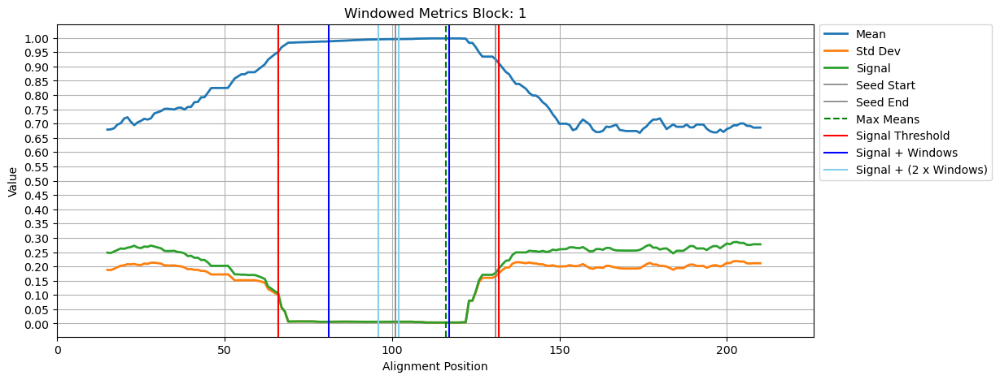

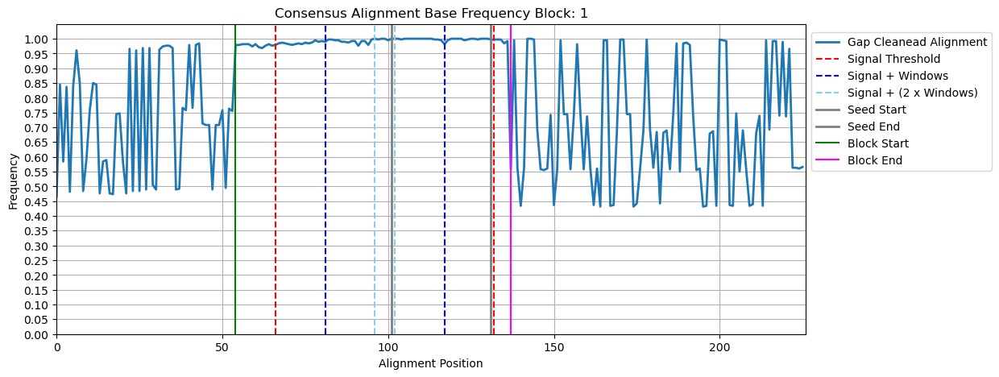

Working on Targe seed k:5_c:361
Working on Targe seed k:14_c:353
Working on Targe seed k:8_c:361
Working on Targe seed k:6_c:361
Working on Targe seed k:2_c:362
Working on Targe seed k:1_c:362
Working on Targe seed k:11_c:357
Working on Targe seed k:10_c:360
Working on Targe seed k:3_c:361
Working on Targe seed k:31_c:346
Working on Targe seed k:9_c:361
Working on Targe seed k:4_c:361
Working on Targe seed k:7_c:361
Working on Targe seed k:48_c:339
Working on Targe seed k:42_c:341
Working on Targe seed k:35_c:345
Working on Targe seed k:17_c:350
Working on Targe seed k:50_c:338
Working on Targe seed k:49_c:338
Working on Targe seed k:12_c:355
Working on Targe seed k:19_c:350
Working on Targe seed k:37_c:343
Working on Targe seed k:188_c:201
Working on Targe seed k:868_c:153
Working on Targe seed k:38_c:343
Working on Targe seed k:21_c:349
Working on Targe seed k:29_c:347
Working on Targe seed k:24_c:349
Working on Targe seed k:26_c:348
Working on Targe seed k:54_c:337
Working on Targe 

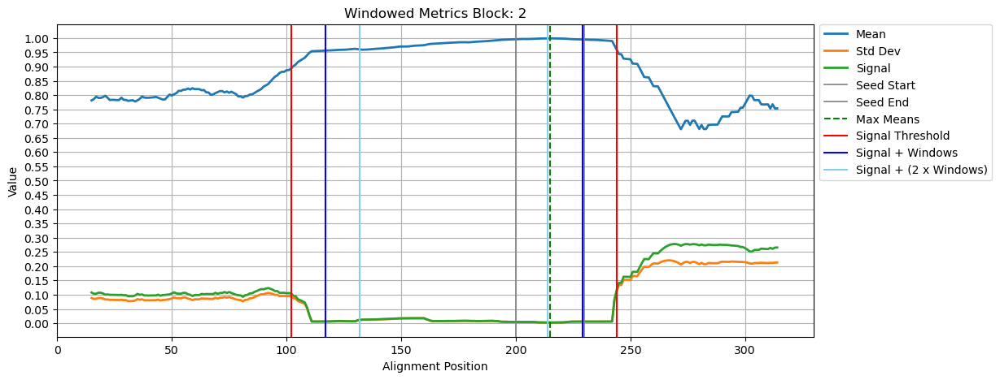

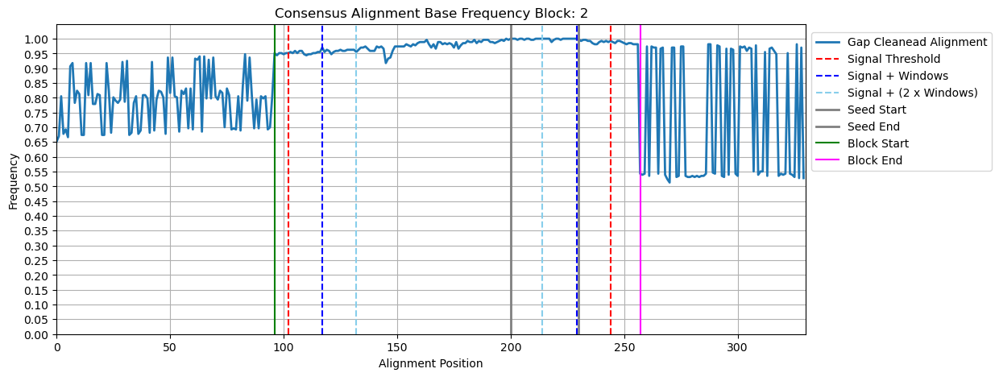

Working on Targe seed k:57_c:257
Working on Targe seed k:59_c:257
Working on Targe seed k:58_c:257
Working on Targe seed k:66_c:255
Working on Targe seed k:65_c:255
Working on Targe seed k:64_c:255
Working on Targe seed k:72_c:254
Working on Targe seed k:61_c:255
Working on Targe seed k:67_c:255
Working on Targe seed k:104_c:245
Working on Targe seed k:60_c:256
Working on Targe seed k:78_c:254
Working on Targe seed k:74_c:254
Working on Targe seed k:91_c:249
Working on Targe seed k:90_c:250
Working on Targe seed k:85_c:252
Working on Targe seed k:93_c:249
Working on Targe seed k:79_c:254
Working on Targe seed k:69_c:255
Working on Targe seed k:80_c:253
Working on Targe seed k:77_c:254
Working on Targe seed k:63_c:255
Working on Targe seed k:89_c:251
Working on Targe seed k:73_c:254
Working on Targe seed k:102_c:245
Working on Targe seed k:101_c:245
Working on Targe seed k:99_c:246
Working on Targe seed k:82_c:253
Working on Targe seed k:76_c:254
Working on Targe seed k:75_c:254
Working

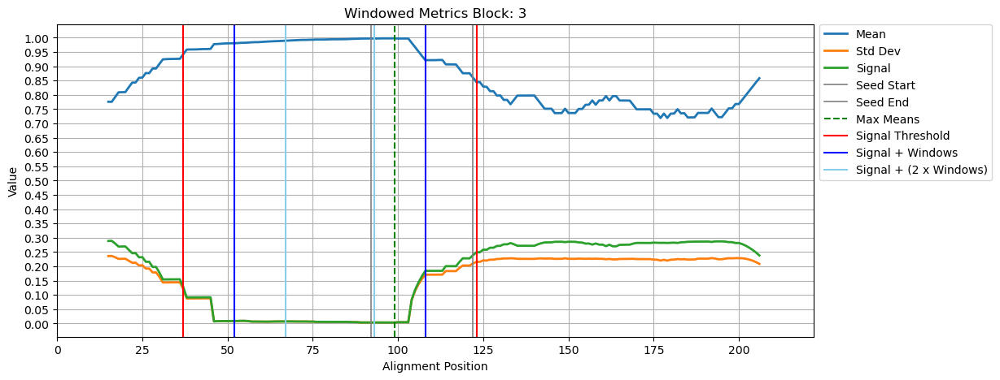

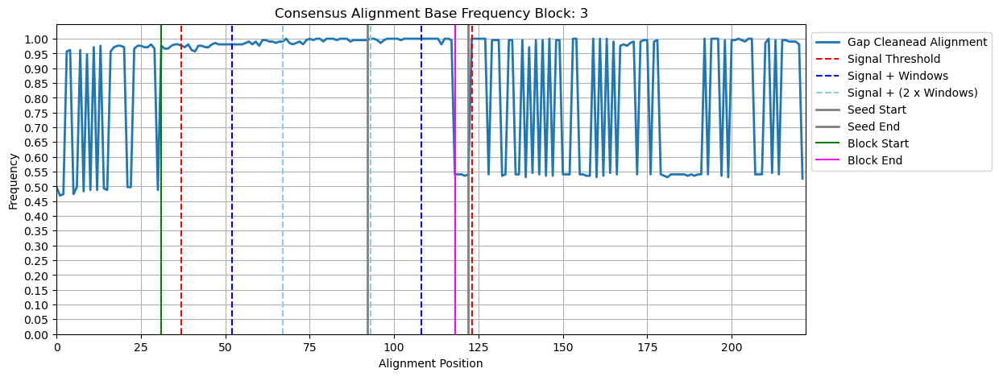

Working on Targe seed k:1549_c:106
Working on Targe seed k:2242_c:91
Working on Targe seed k:212_c:190
Mapping seed: k:212_c:190

Processing Block Number: 4

Seed initial size: 30
Warning! Differences between alignment extension (328) and expected alignment extension (330)
Attempting to find original seed position

Start signal Pos: 99
Mean Start signal Pos: 99
End signal Pos: 281
Mean End signal Pos: 275

Running: blastn -query /home/jpereira/OEs/Results/OE1/NamSeqs/Data/seed_extension/kmer30_k:5028_c:49/temp.seeds.fasta -subject /home/jpereira/OEs/Results/OE1/NamSeqs/Data/seed_extension/kmer30_k:5028_c:49/block-temp.fasta -out /home/jpereira/OEs/Results/OE1/NamSeqs/Data/seed_extension/kmer30_k:5028_c:49/temp.blast.seeds_fragment.tsv -reward 1 -gapextend 2 -gapopen 5 -penalty -2 -word_size 10 -outfmt '6 qseqid sseqid pident length mismatch gapopen qstart qend sstart send evalue bitscore qlen slen'
blastn_subject ran successfully.


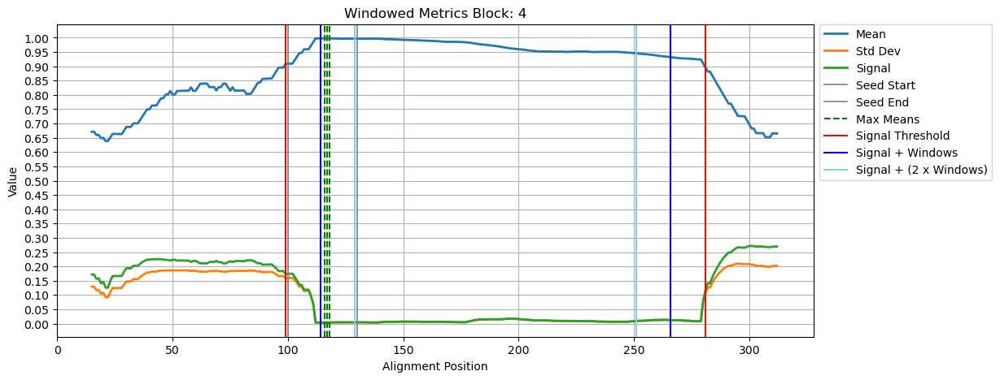

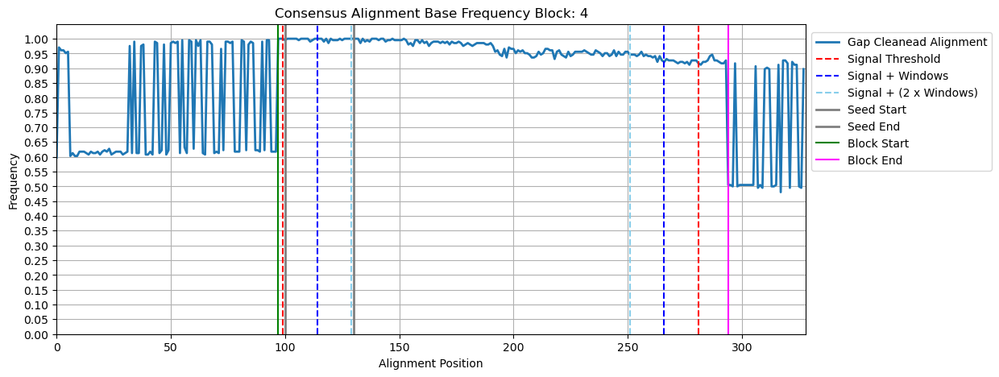

Working on Targe seed k:198_c:191
Working on Targe seed k:215_c:190
Working on Targe seed k:1256_c:117
Working on Targe seed k:195_c:192
Working on Targe seed k:206_c:191
Working on Targe seed k:203_c:191
Working on Targe seed k:204_c:191
Working on Targe seed k:194_c:192
Mapping seed: k:194_c:192

Processing Block Number: 5

Seed initial size: 30
Warning! Differences between alignment extension (320) and expected alignment extension (330)
Attempting to find original seed position

Start signal Pos: 99
Mean Start signal Pos: 99
End signal Pos: 287
Mean End signal Pos: 281

Running: blastn -query /home/jpereira/OEs/Results/OE1/NamSeqs/Data/seed_extension/kmer30_k:5028_c:49/temp.seeds.fasta -subject /home/jpereira/OEs/Results/OE1/NamSeqs/Data/seed_extension/kmer30_k:5028_c:49/block-temp.fasta -out /home/jpereira/OEs/Results/OE1/NamSeqs/Data/seed_extension/kmer30_k:5028_c:49/temp.blast.seeds_fragment.tsv -reward 1 -gapextend 2 -gapopen 5 -penalty -2 -word_size 10 -outfmt '6 qseqid sseqid 

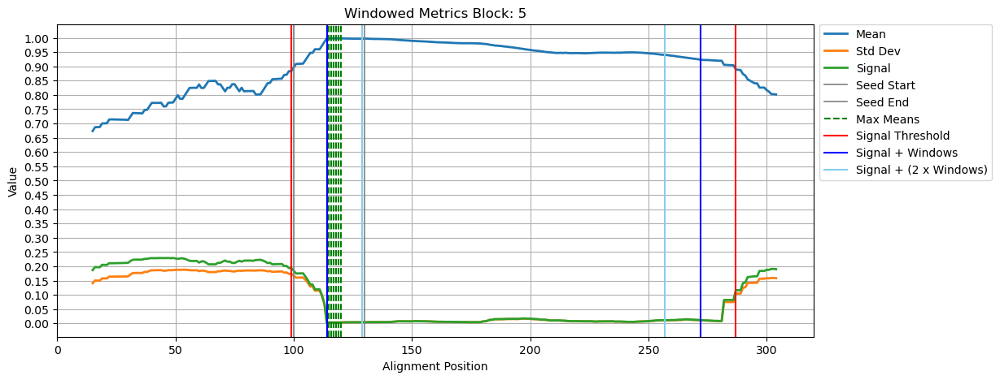

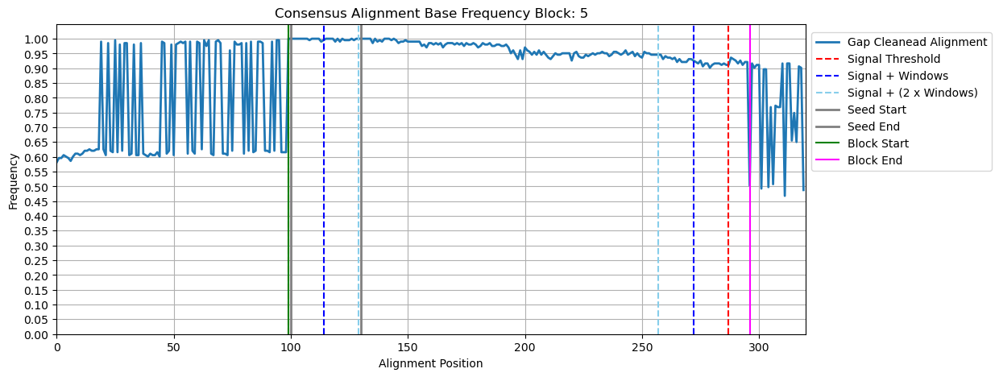

Working on Targe seed k:205_c:191
Working on Targe seed k:243_c:188
Working on Targe seed k:220_c:189
Working on Targe seed k:231_c:189
Working on Targe seed k:278_c:187
Working on Targe seed k:230_c:189
Working on Targe seed k:276_c:187
Working on Targe seed k:225_c:189
Working on Targe seed k:224_c:189
Working on Targe seed k:219_c:189
Working on Targe seed k:260_c:187
Working on Targe seed k:238_c:189
Working on Targe seed k:239_c:189
Working on Targe seed k:199_c:191
Working on Targe seed k:240_c:189
Working on Targe seed k:233_c:189
Working on Targe seed k:234_c:189
Working on Targe seed k:252_c:188
Working on Targe seed k:3125_c:75
Working on Targe seed k:197_c:192
Working on Targe seed k:279_c:187
Working on Targe seed k:196_c:192
Working on Targe seed k:209_c:190
Working on Targe seed k:201_c:191
Working on Targe seed k:208_c:190
Working on Targe seed k:294_c:186
Working on Targe seed k:200_c:191
Working on Targe seed k:223_c:189
Working on Targe seed k:271_c:187
Working on Tar

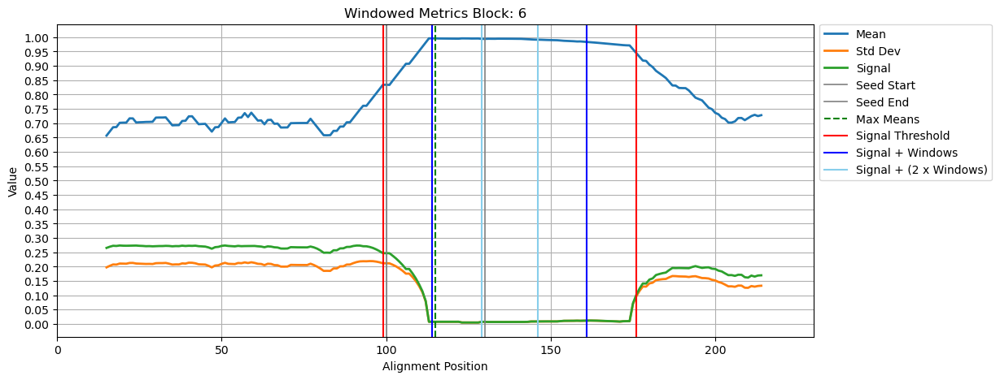

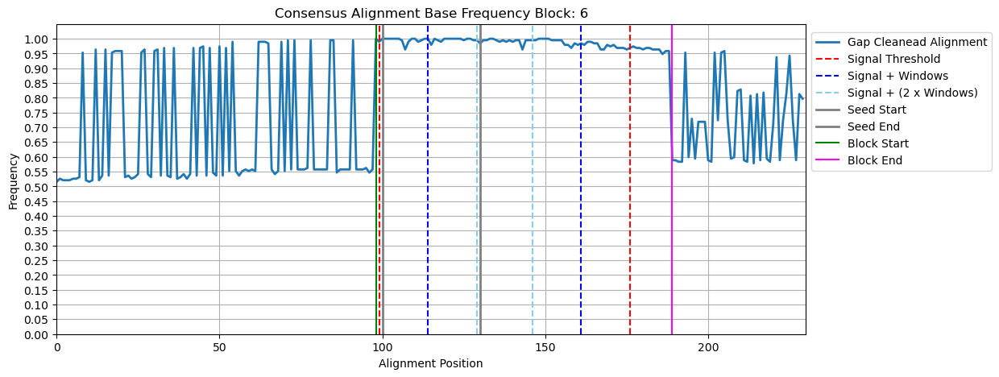

Working on Targe seed k:304_c:184
Working on Targe seed k:536_c:170
Working on Targe seed k:585_c:168
Working on Targe seed k:322_c:180
Working on Targe seed k:528_c:170
Working on Targe seed k:642_c:165
Working on Targe seed k:655_c:165
Working on Targe seed k:636_c:166
Working on Targe seed k:335_c:177
Working on Targe seed k:365_c:176
Working on Targe seed k:348_c:176
Working on Targe seed k:330_c:178
Working on Targe seed k:324_c:178
Mapping seed: k:324_c:178

Processing Block Number: 7

Seed initial size: 30

Start signal Pos: 92
Mean Start signal Pos: 99
End signal Pos: 158
Mean End signal Pos: 153

Running: blastn -query /home/jpereira/OEs/Results/OE1/NamSeqs/Data/seed_extension/kmer30_k:5028_c:49/temp.seeds.fasta -subject /home/jpereira/OEs/Results/OE1/NamSeqs/Data/seed_extension/kmer30_k:5028_c:49/block-temp.fasta -out /home/jpereira/OEs/Results/OE1/NamSeqs/Data/seed_extension/kmer30_k:5028_c:49/temp.blast.seeds_fragment.tsv -reward 1 -gapextend 2 -gapopen 5 -penalty -2 -word_

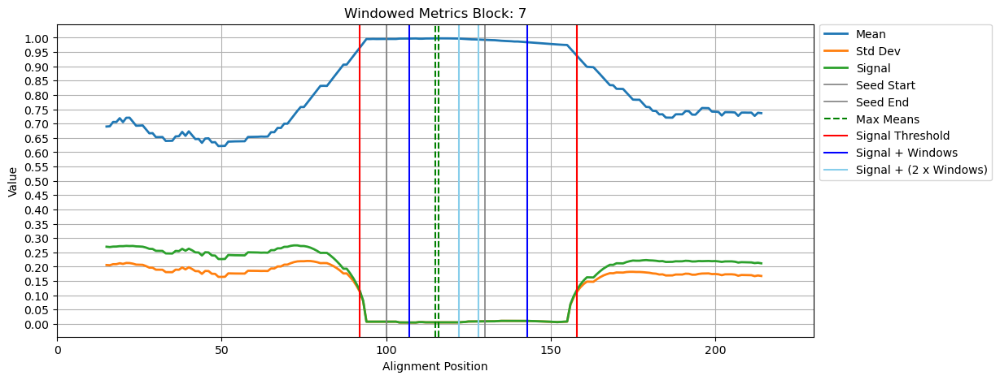

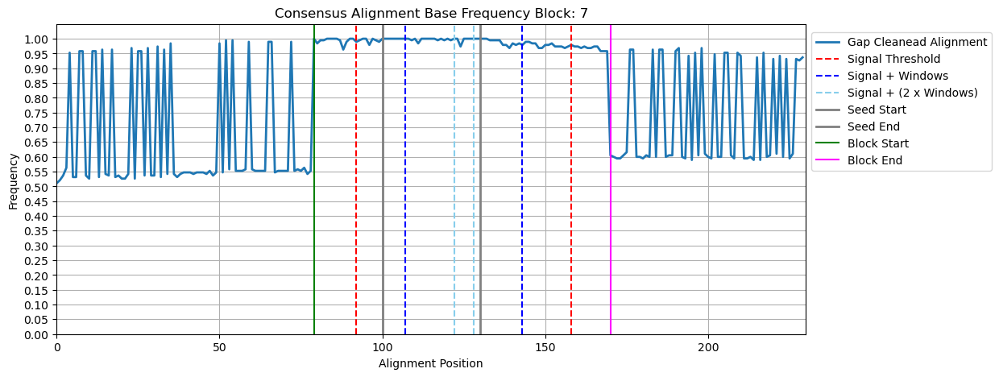

Working on Targe seed k:343_c:177
Working on Targe seed k:326_c:178
Working on Targe seed k:325_c:178
Working on Targe seed k:351_c:176
Working on Targe seed k:332_c:177
Working on Targe seed k:671_c:164
Working on Targe seed k:3482_c:72
Working on Targe seed k:596_c:168
Working on Targe seed k:349_c:176
Working on Targe seed k:1694_c:98
Working on Targe seed k:375_c:176
Working on Targe seed k:428_c:173
Working on Targe seed k:352_c:176
Working on Targe seed k:367_c:176
Working on Targe seed k:360_c:176
Working on Targe seed k:522_c:170
Working on Targe seed k:572_c:169
Working on Targe seed k:461_c:172
Working on Targe seed k:342_c:177
Working on Targe seed k:385_c:175
Mapping seed: k:385_c:175

Processing Block Number: 8

Seed initial size: 30

Start signal Pos: 47
Mean Start signal Pos: 53
End signal Pos: 193
Mean End signal Pos: 189

Running: blastn -query /home/jpereira/OEs/Results/OE1/NamSeqs/Data/seed_extension/kmer30_k:5028_c:49/temp.seeds.fasta -subject /home/jpereira/OEs/Res

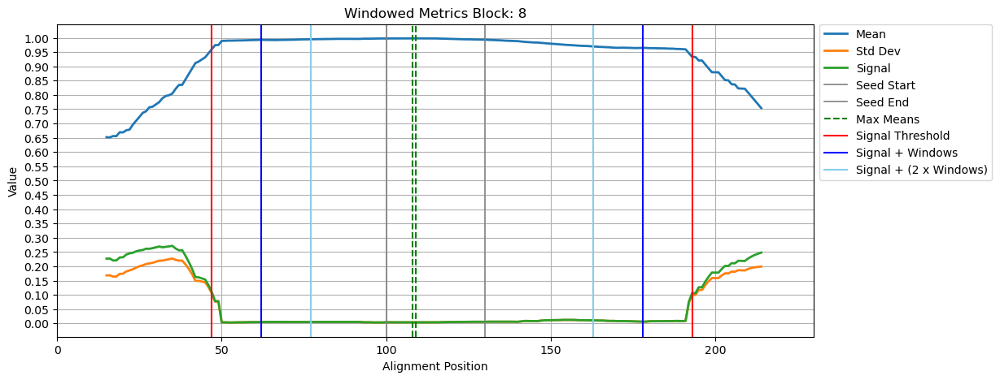

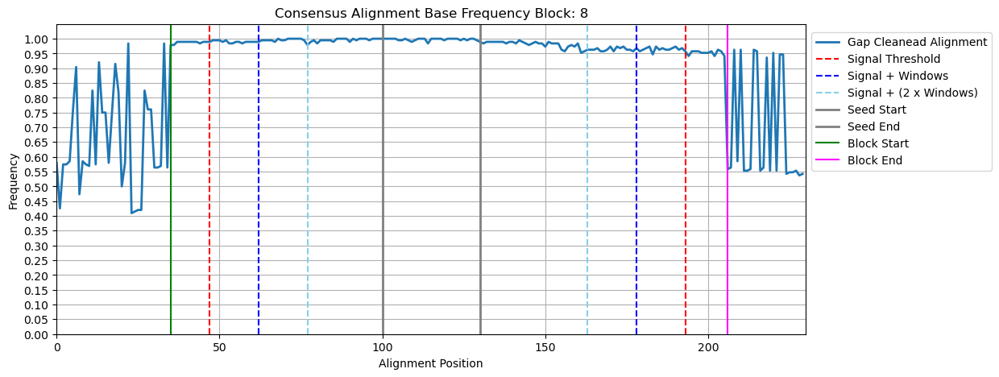

Working on Targe seed k:340_c:177
Working on Targe seed k:394_c:175
Working on Targe seed k:427_c:173
Working on Targe seed k:524_c:170
Working on Targe seed k:664_c:164
Working on Targe seed k:415_c:174
Mapping seed: k:415_c:174

Processing Block Number: 9

Seed initial size: 30
Warning! Differences between alignment extension (523) and expected alignment extension (530)
Attempting to find original seed position

Start signal Pos: 82
Mean Start signal Pos: 88
End signal Pos: 463
Mean End signal Pos: 458

Running: blastn -query /home/jpereira/OEs/Results/OE1/NamSeqs/Data/seed_extension/kmer30_k:5028_c:49/temp.seeds.fasta -subject /home/jpereira/OEs/Results/OE1/NamSeqs/Data/seed_extension/kmer30_k:5028_c:49/block-temp.fasta -out /home/jpereira/OEs/Results/OE1/NamSeqs/Data/seed_extension/kmer30_k:5028_c:49/temp.blast.seeds_fragment.tsv -reward 1 -gapextend 2 -gapopen 5 -penalty -2 -word_size 10 -outfmt '6 qseqid sseqid pident length mismatch gapopen qstart qend sstart send evalue bitscor

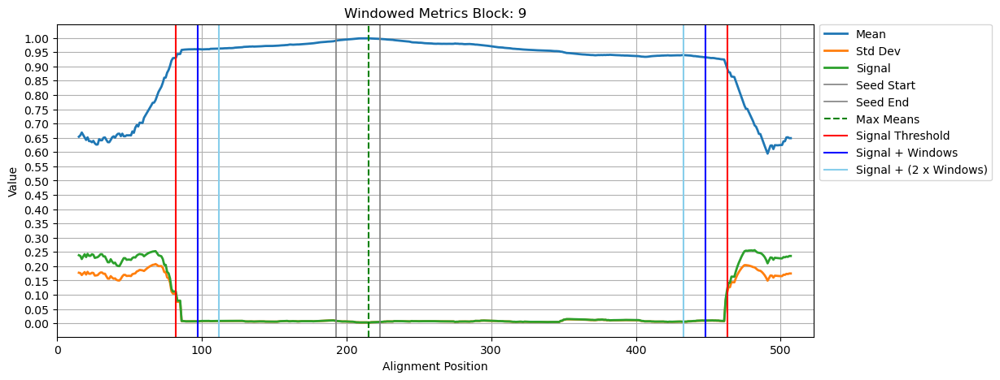

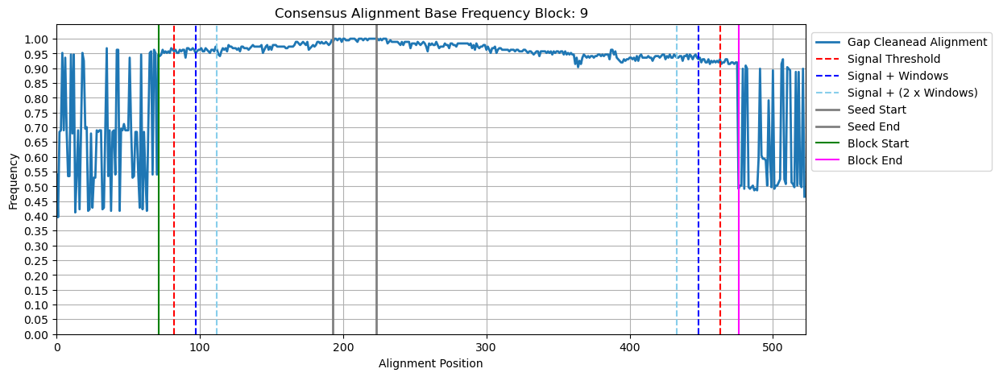

Working on Targe seed k:423_c:173
Working on Targe seed k:441_c:172
Working on Targe seed k:443_c:172
Working on Targe seed k:447_c:172
Working on Targe seed k:694_c:162
Working on Targe seed k:329_c:178
Working on Targe seed k:409_c:174
Working on Targe seed k:563_c:169
Working on Targe seed k:347_c:176
Working on Targe seed k:669_c:164
Working on Targe seed k:371_c:176
Working on Targe seed k:391_c:175
Working on Targe seed k:368_c:176
Working on Targe seed k:690_c:162
Working on Targe seed k:611_c:167
Working on Targe seed k:366_c:176
Working on Targe seed k:565_c:169
Working on Targe seed k:408_c:174
Working on Targe seed k:437_c:173
Working on Targe seed k:465_c:172
Working on Targe seed k:412_c:174
Working on Targe seed k:457_c:172
Working on Targe seed k:695_c:161
Working on Targe seed k:551_c:169
Working on Targe seed k:355_c:176
Working on Targe seed k:484_c:171
Working on Targe seed k:610_c:167
Working on Targe seed k:581_c:168
Working on Targe seed k:383_c:175
Working on Tar

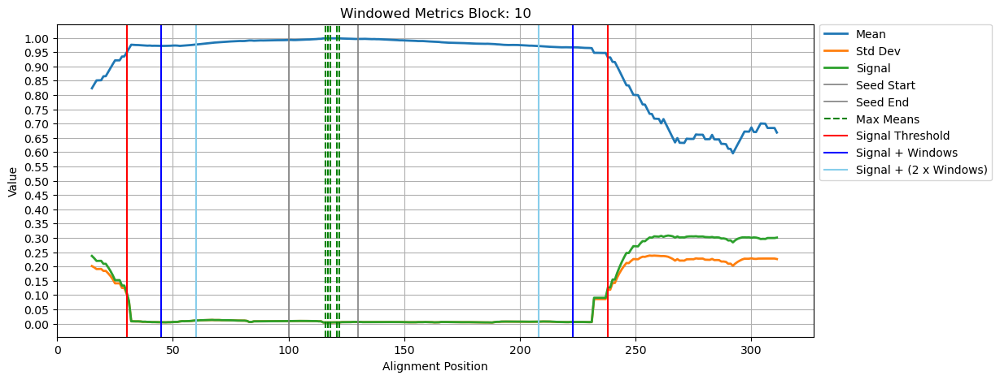

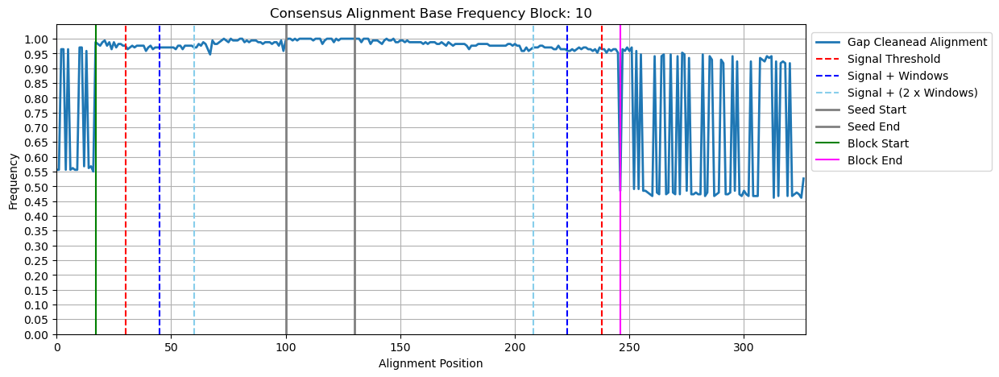

Working on Targe seed k:763_c:158
Working on Targe seed k:711_c:159
Working on Targe seed k:750_c:158
Working on Targe seed k:744_c:158
Working on Targe seed k:791_c:157
Working on Targe seed k:820_c:155
Working on Targe seed k:751_c:158
Working on Targe seed k:888_c:151
Working on Targe seed k:760_c:158
Working on Targe seed k:758_c:158
Working on Targe seed k:823_c:155
Working on Targe seed k:702_c:159
Working on Targe seed k:722_c:159
Working on Targe seed k:706_c:159
Working on Targe seed k:709_c:159
Working on Targe seed k:726_c:159
Working on Targe seed k:728_c:158
Working on Targe seed k:720_c:159
Mapping seed: k:720_c:159

Processing Block Number: 11

Seed initial size: 30

Start signal Pos: 72
Mean Start signal Pos: 79
End signal Pos: 160
Mean End signal Pos: 157

Running: blastn -query /home/jpereira/OEs/Results/OE1/NamSeqs/Data/seed_extension/kmer30_k:5028_c:49/temp.seeds.fasta -subject /home/jpereira/OEs/Results/OE1/NamSeqs/Data/seed_extension/kmer30_k:5028_c:49/block-temp.

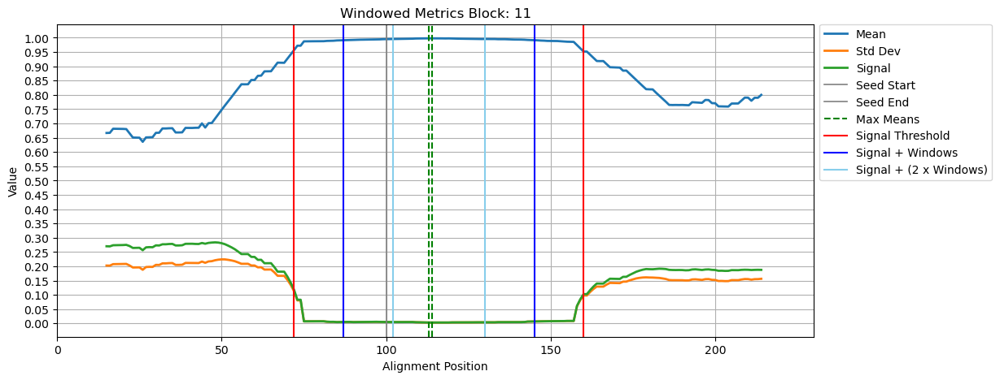

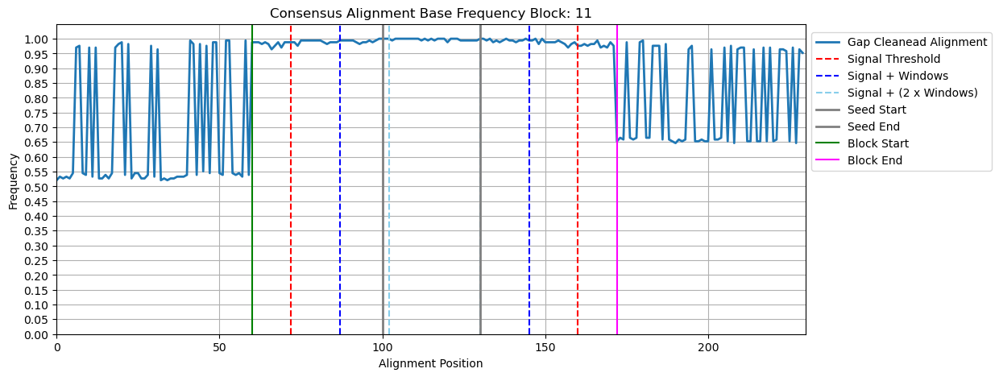

Working on Targe seed k:731_c:158
Working on Targe seed k:822_c:155
Working on Targe seed k:845_c:154
Working on Targe seed k:710_c:159
Mapping seed: k:710_c:159

Processing Block Number: 12

Seed initial size: 30

Start signal Pos: 73
Mean Start signal Pos: 80
End signal Pos: 161
Mean End signal Pos: 158

Running: blastn -query /home/jpereira/OEs/Results/OE1/NamSeqs/Data/seed_extension/kmer30_k:5028_c:49/temp.seeds.fasta -subject /home/jpereira/OEs/Results/OE1/NamSeqs/Data/seed_extension/kmer30_k:5028_c:49/block-temp.fasta -out /home/jpereira/OEs/Results/OE1/NamSeqs/Data/seed_extension/kmer30_k:5028_c:49/temp.blast.seeds_fragment.tsv -reward 1 -gapextend 2 -gapopen 5 -penalty -2 -word_size 10 -outfmt '6 qseqid sseqid pident length mismatch gapopen qstart qend sstart send evalue bitscore qlen slen'
blastn_subject ran successfully.


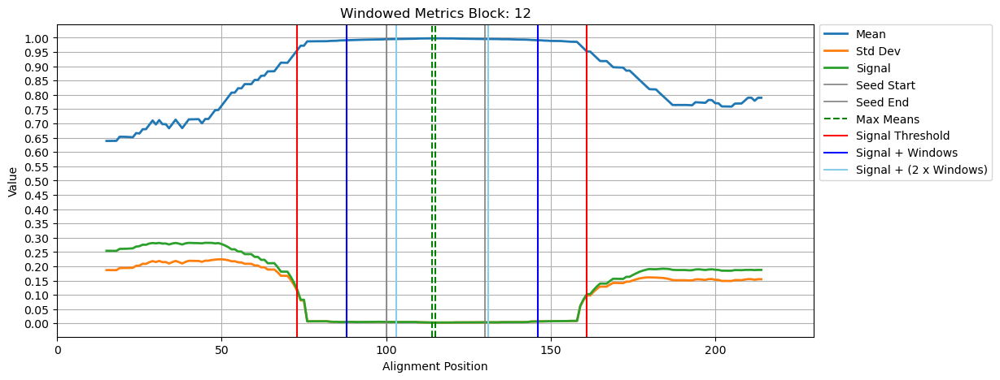

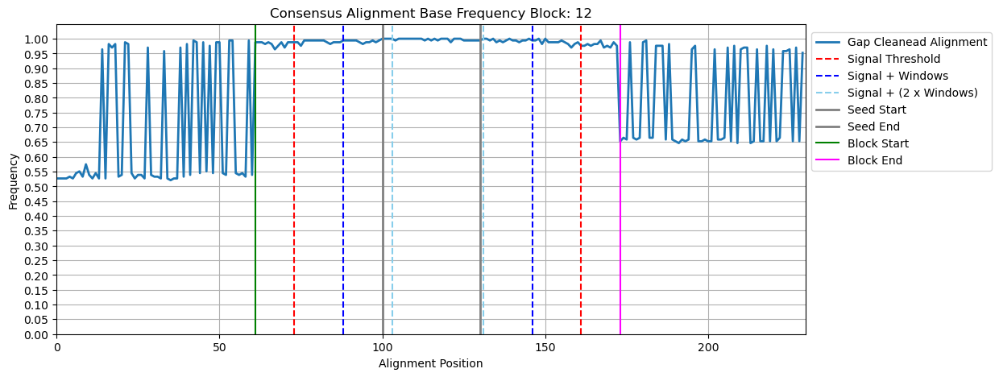

Working on Targe seed k:707_c:159
Working on Targe seed k:768_c:157
Working on Targe seed k:719_c:159
Working on Targe seed k:876_c:152
Working on Targe seed k:743_c:158
Working on Targe seed k:739_c:158
Working on Targe seed k:761_c:158
Working on Targe seed k:752_c:158
Working on Targe seed k:737_c:158
Working on Targe seed k:715_c:159
Working on Targe seed k:700_c:160
Working on Targe seed k:775_c:157
Working on Targe seed k:861_c:153
Working on Targe seed k:835_c:155
Working on Targe seed k:708_c:159
Working on Targe seed k:740_c:158
Working on Targe seed k:902_c:150
Working on Targe seed k:699_c:160
Working on Targe seed k:886_c:151
Working on Targe seed k:756_c:158
Working on Targe seed k:759_c:158
Working on Targe seed k:741_c:158
Working on Targe seed k:865_c:153
Working on Targe seed k:778_c:157
Working on Targe seed k:718_c:159
Working on Targe seed k:713_c:159
Working on Targe seed k:725_c:159
Working on Targe seed k:782_c:157
Working on Targe seed k:757_c:158
Working on Tar

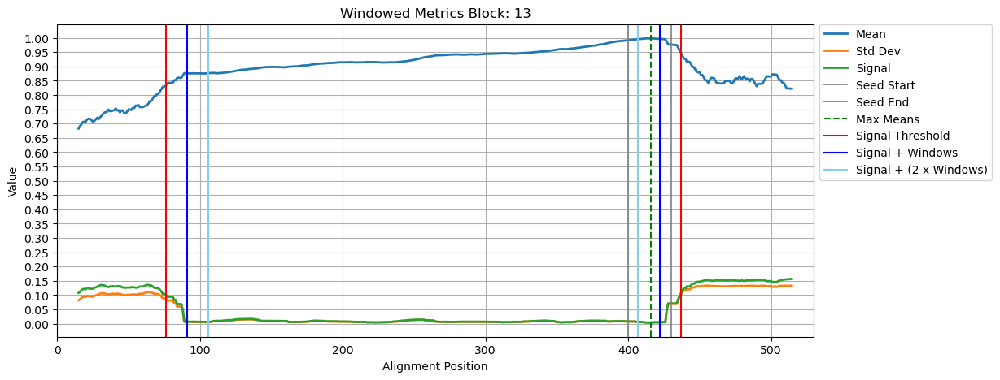

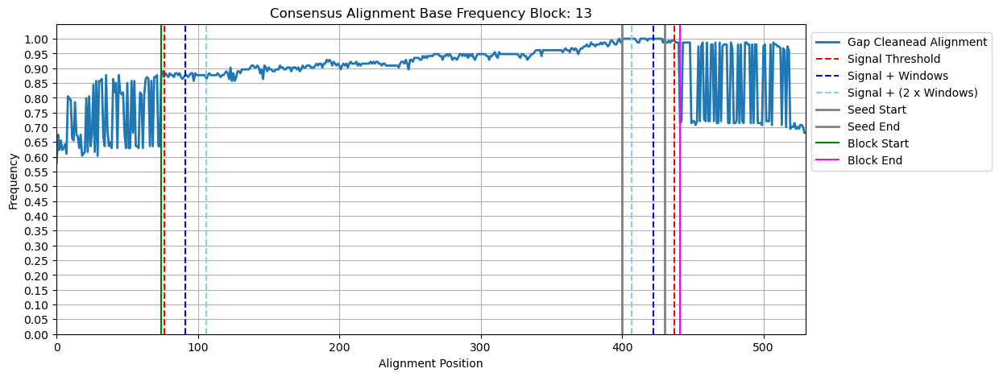

Working on Targe seed k:925_c:146
Working on Targe seed k:923_c:146
Working on Targe seed k:932_c:145
Working on Targe seed k:920_c:146
Working on Targe seed k:924_c:146
Working on Targe seed k:942_c:144
Working on Targe seed k:928_c:145
Working on Targe seed k:919_c:146
Working on Targe seed k:951_c:144
Working on Targe seed k:952_c:143
Working on Targe seed k:922_c:146
Working on Targe seed k:941_c:144
Working on Targe seed k:936_c:145
Working on Targe seed k:929_c:145
Working on Targe seed k:931_c:145
Working on Targe seed k:946_c:144
Working on Targe seed k:948_c:144
Working on Targe seed k:949_c:144
Working on Targe seed k:938_c:144
Working on Targe seed k:983_c:141
Working on Targe seed k:980_c:141
Working on Targe seed k:1639_c:102
Working on Targe seed k:961_c:143
Working on Targe seed k:973_c:141
Working on Targe seed k:955_c:143
Working on Targe seed k:994_c:140
Working on Targe seed k:943_c:144
Working on Targe seed k:945_c:144
Working on Targe seed k:984_c:141
Working on Ta

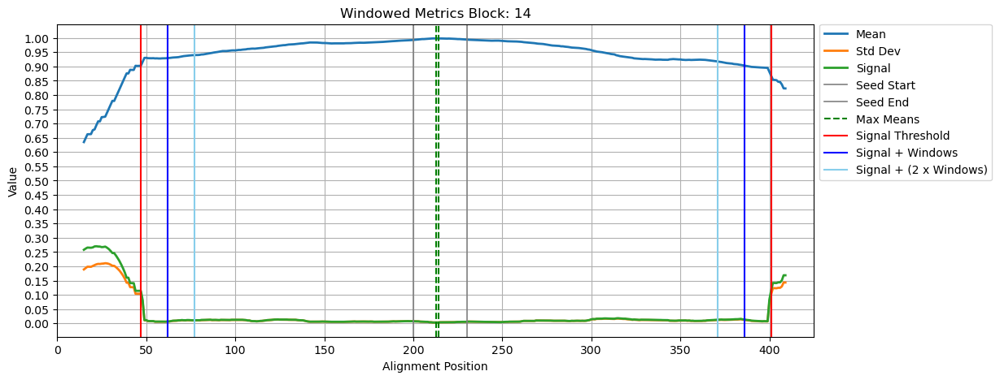

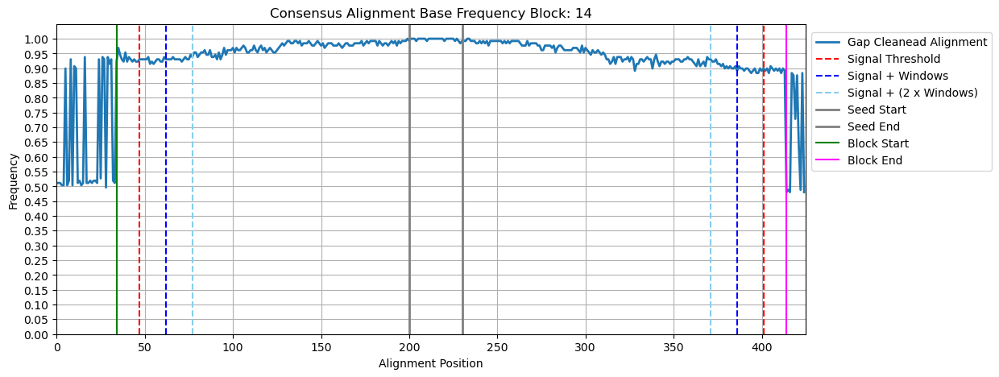

Working on Targe seed k:1150_c:123
Working on Targe seed k:1130_c:125
Working on Targe seed k:1132_c:125
Working on Targe seed k:1161_c:122
Working on Targe seed k:1192_c:120
Working on Targe seed k:1154_c:123
Working on Targe seed k:1144_c:124
Working on Targe seed k:1170_c:122
Working on Targe seed k:1165_c:122
Working on Targe seed k:1343_c:112
Working on Targe seed k:1157_c:122
Working on Targe seed k:1268_c:117
Working on Targe seed k:1264_c:117
Working on Targe seed k:1149_c:123
Working on Targe seed k:1159_c:122
Working on Targe seed k:1167_c:122
Working on Targe seed k:1162_c:122
Working on Targe seed k:1163_c:122
Working on Targe seed k:1344_c:112
Working on Targe seed k:1135_c:124
Working on Targe seed k:1131_c:125
Working on Targe seed k:1258_c:117
Working on Targe seed k:1134_c:124
Working on Targe seed k:1143_c:124
Working on Targe seed k:1145_c:124
Working on Targe seed k:1138_c:124
Working on Targe seed k:1146_c:123
Working on Targe seed k:1229_c:118
Working on Targe see

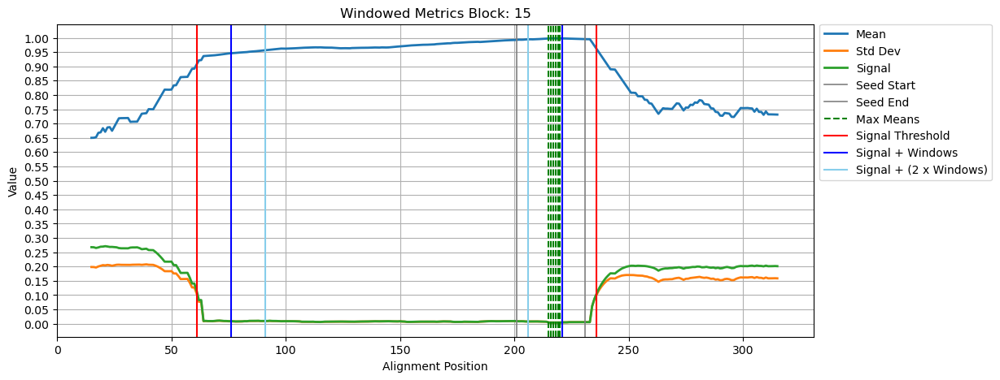

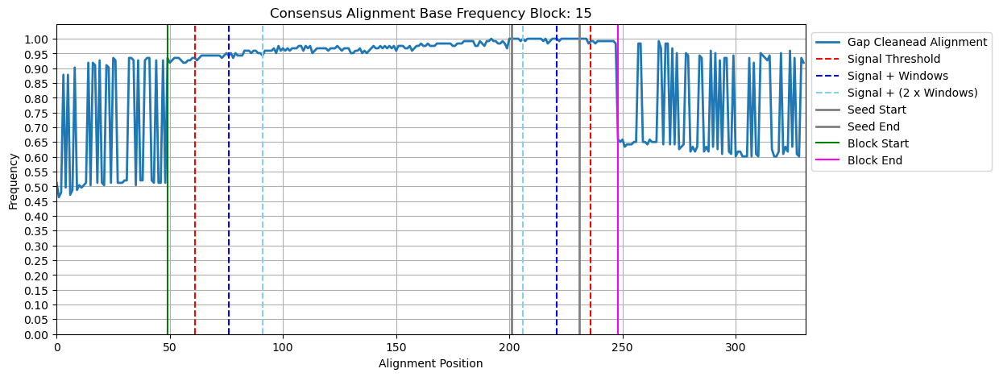

Working on Targe seed k:1206_c:119
Working on Targe seed k:1307_c:114
Working on Targe seed k:1311_c:113
Working on Targe seed k:1275_c:116
Working on Targe seed k:1273_c:116
Working on Targe seed k:1293_c:114
Working on Targe seed k:1296_c:114
Working on Targe seed k:1259_c:117
Working on Targe seed k:1194_c:120
Working on Targe seed k:1179_c:121
Working on Targe seed k:1278_c:115
Working on Targe seed k:1302_c:114
Working on Targe seed k:1301_c:114
Working on Targe seed k:1249_c:117
Working on Targe seed k:1410_c:110
Working on Targe seed k:1245_c:118
Working on Targe seed k:1243_c:118
Working on Targe seed k:1242_c:118
Working on Targe seed k:1254_c:117
Working on Targe seed k:1230_c:118
Working on Targe seed k:1222_c:118
Working on Targe seed k:1223_c:118
Working on Targe seed k:1215_c:118
Working on Targe seed k:1287_c:114
Working on Targe seed k:1305_c:114
Working on Targe seed k:1331_c:113
Working on Targe seed k:1286_c:114
Working on Targe seed k:1316_c:113
Working on Targe see

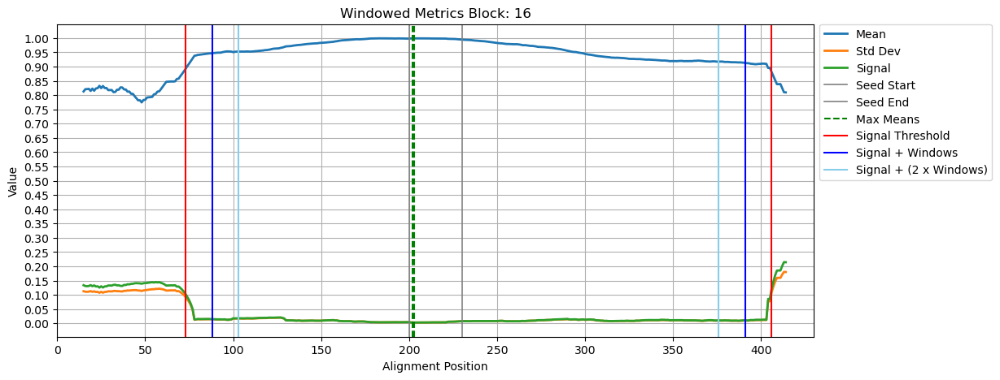

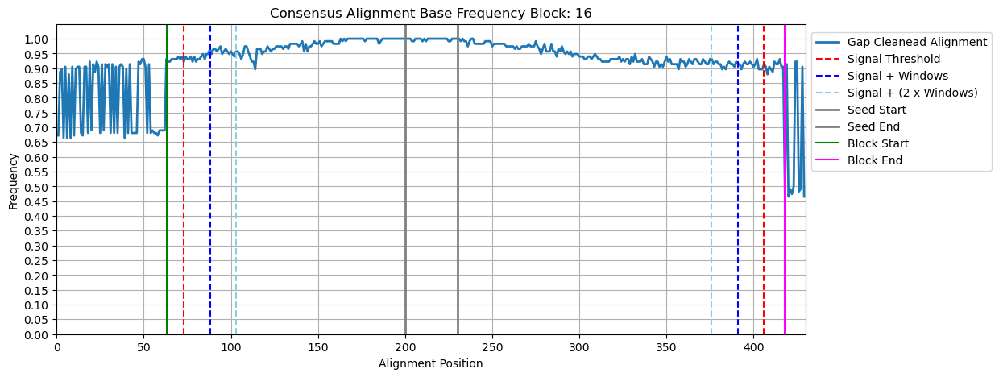

Working on Targe seed k:1402_c:110
Working on Targe seed k:1543_c:107
Working on Targe seed k:1408_c:110
Working on Targe seed k:1415_c:109
Working on Targe seed k:1521_c:107
Working on Targe seed k:1510_c:108
Working on Targe seed k:1513_c:107
Working on Targe seed k:1514_c:107
Working on Targe seed k:1536_c:107
Working on Targe seed k:1442_c:109
Working on Targe seed k:1494_c:108
Working on Targe seed k:1489_c:108
Working on Targe seed k:1538_c:107
Working on Targe seed k:1532_c:107
Working on Targe seed k:1386_c:110
Working on Targe seed k:1399_c:110
Working on Targe seed k:1523_c:107
Working on Targe seed k:1457_c:109
Working on Targe seed k:1324_c:113
Mapping seed: k:1324_c:113

Processing Block Number: 17

Seed initial size: 30
Warning! Differences between alignment extension (429) and expected alignment extension (430)
Attempting to find original seed position
Warning! Differences between alignment extension (529) and expected alignment extension (530)
Attempting to find origina

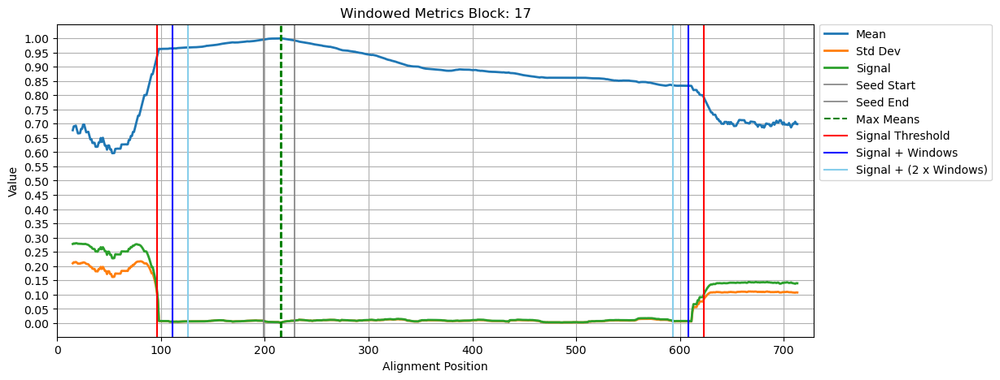

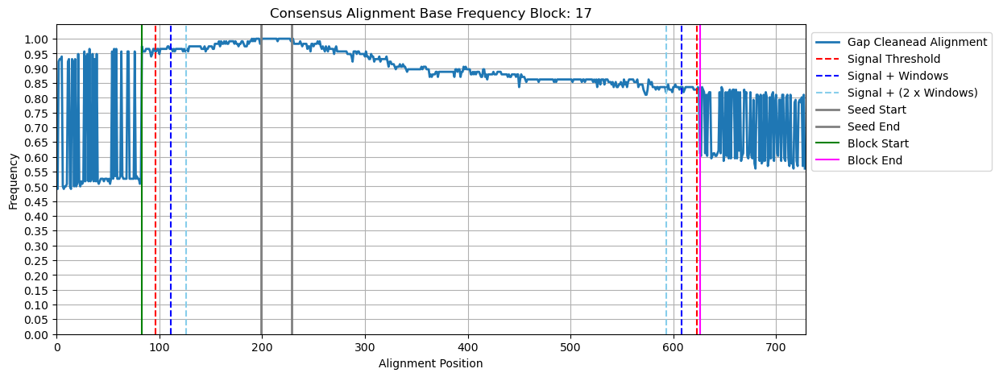

Working on Targe seed k:1336_c:112
Working on Targe seed k:1541_c:107
Working on Targe seed k:1546_c:107
Working on Targe seed k:1526_c:107
Working on Targe seed k:1376_c:110
Working on Targe seed k:1437_c:109
Working on Targe seed k:1439_c:109
Working on Targe seed k:1465_c:109
Working on Targe seed k:1518_c:107
Working on Targe seed k:1455_c:109
Working on Targe seed k:1447_c:109
Working on Targe seed k:1419_c:109
Working on Targe seed k:1480_c:108
Working on Targe seed k:1300_c:114
Working on Targe seed k:1529_c:107
Working on Targe seed k:1477_c:109
Working on Targe seed k:1520_c:107
Working on Targe seed k:1576_c:106
Working on Targe seed k:1445_c:109
Working on Targe seed k:1467_c:109
Working on Targe seed k:1430_c:109
Working on Targe seed k:1440_c:109
Working on Targe seed k:1434_c:109
Working on Targe seed k:1431_c:109
Working on Targe seed k:1441_c:109
Working on Targe seed k:1446_c:109
Working on Targe seed k:1470_c:109
Working on Targe seed k:1499_c:108
Working on Targe see

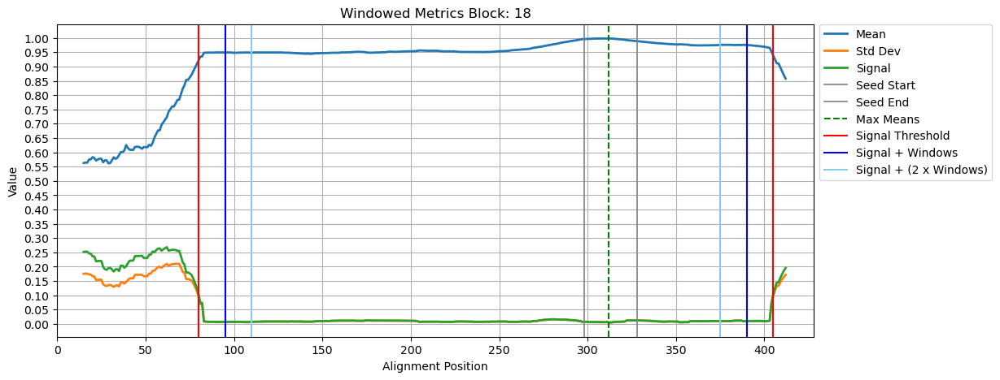

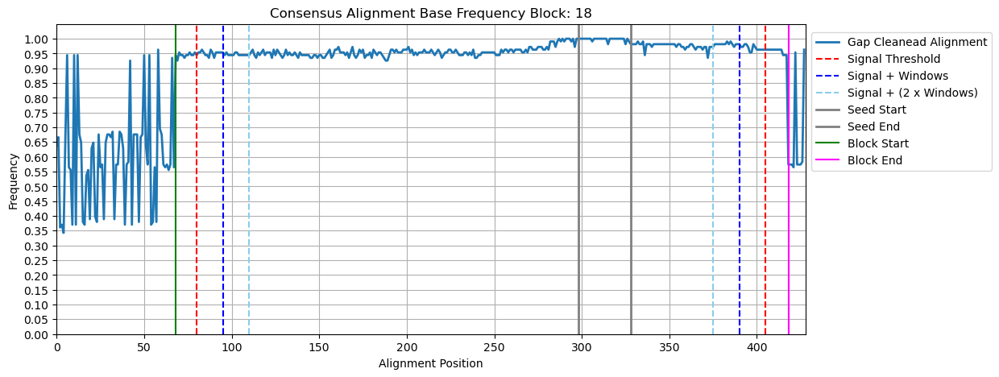

Working on Targe seed k:1647_c:102
Working on Targe seed k:1664_c:101
Working on Targe seed k:1670_c:100
Working on Targe seed k:1623_c:103
Working on Targe seed k:1560_c:106
Working on Targe seed k:1589_c:105
Working on Targe seed k:1584_c:105
Working on Targe seed k:1681_c:99
Working on Targe seed k:1570_c:106
Working on Targe seed k:1643_c:102
Working on Targe seed k:1658_c:101
Working on Targe seed k:1678_c:100
Working on Targe seed k:1662_c:101
Working on Targe seed k:1771_c:97
Working on Targe seed k:1622_c:103
Working on Targe seed k:1579_c:106
Working on Targe seed k:1625_c:103
Working on Targe seed k:1631_c:103
Working on Targe seed k:1854_c:96
Working on Targe seed k:1590_c:105
Working on Targe seed k:1617_c:104
Working on Targe seed k:1842_c:96
Working on Targe seed k:1888_c:95
Mapping seed: k:1888_c:95

Processing Block Number: 19

Seed initial size: 30
Warning! Differences between alignment extension (1021) and expected alignment extension (1030)
Attempting to find origina

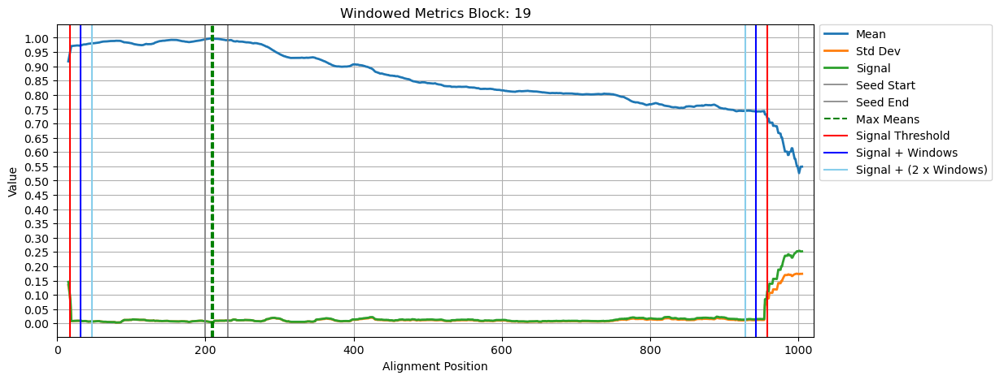

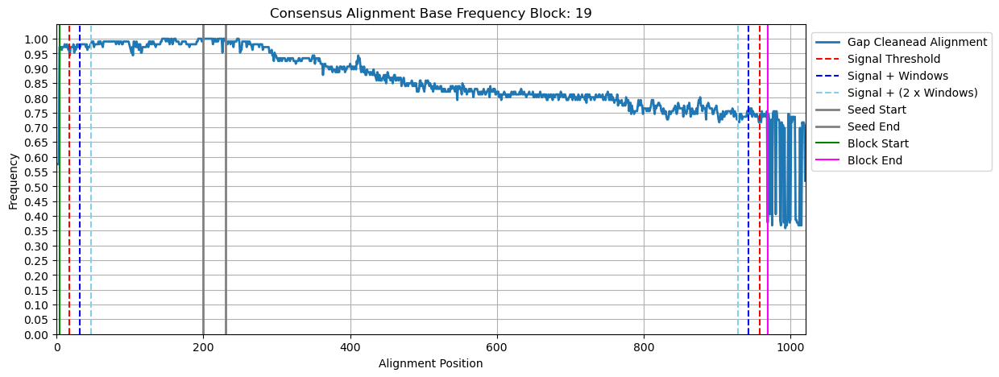

Working on Targe seed k:1831_c:96
Working on Targe seed k:1814_c:96
Working on Targe seed k:1775_c:97
Working on Targe seed k:1739_c:97
Working on Targe seed k:1690_c:99
Working on Targe seed k:1926_c:95
Working on Targe seed k:1562_c:106
Working on Targe seed k:1553_c:106
Working on Targe seed k:1881_c:95
Working on Targe seed k:1879_c:95
Working on Targe seed k:1660_c:101
Working on Targe seed k:1672_c:100
Working on Targe seed k:1713_c:98
Working on Targe seed k:1611_c:104
Working on Targe seed k:1731_c:97
Working on Targe seed k:1689_c:99
Working on Targe seed k:1869_c:96
Working on Targe seed k:2029_c:94
Working on Targe seed k:1642_c:102
Working on Targe seed k:1782_c:97
Working on Targe seed k:1699_c:98
Working on Targe seed k:1685_c:99
Working on Targe seed k:1748_c:97
Working on Targe seed k:1781_c:97
Working on Targe seed k:1767_c:97
Working on Targe seed k:1761_c:97
Working on Targe seed k:1778_c:97
Working on Targe seed k:1750_c:97
Working on Targe seed k:1608_c:104
Working

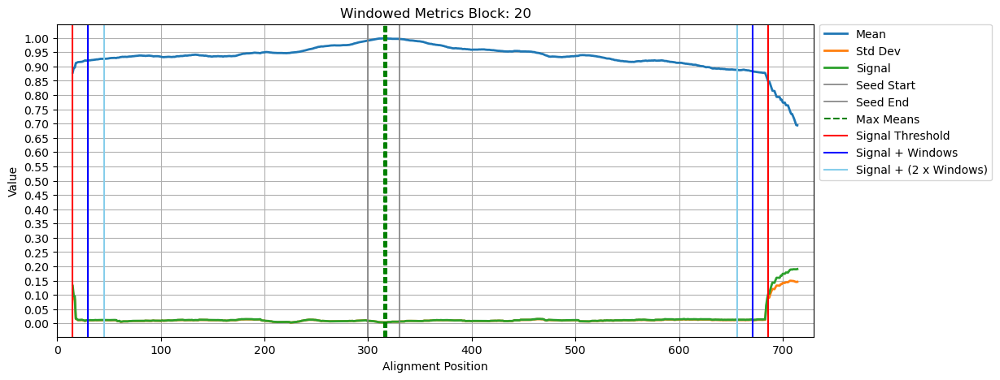

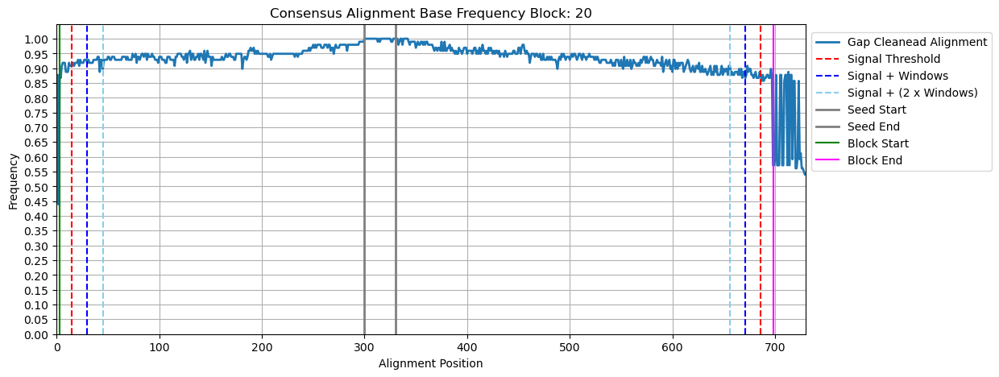

Working on Targe seed k:2054_c:94
Working on Targe seed k:2004_c:94
Working on Targe seed k:2023_c:94
Working on Targe seed k:2046_c:94
Working on Targe seed k:2043_c:94
Working on Targe seed k:2042_c:94
Working on Targe seed k:2415_c:90
Working on Targe seed k:2420_c:90
Working on Targe seed k:1845_c:96
Working on Targe seed k:2055_c:93
Working on Targe seed k:2060_c:93
Working on Targe seed k:2051_c:94
Working on Targe seed k:1851_c:96
Working on Targe seed k:1847_c:96
Working on Targe seed k:2151_c:92
Working on Targe seed k:2157_c:92
Working on Targe seed k:1874_c:96
Working on Targe seed k:1862_c:96
Working on Targe seed k:1856_c:96
Working on Targe seed k:1898_c:95
Working on Targe seed k:1899_c:95
Working on Targe seed k:1878_c:95
Working on Targe seed k:1853_c:96
Working on Targe seed k:2090_c:93
Working on Targe seed k:2270_c:91
Working on Targe seed k:1766_c:97
Working on Targe seed k:2461_c:90
Working on Targe seed k:2453_c:90
Working on Targe seed k:2446_c:90
Working on Tar

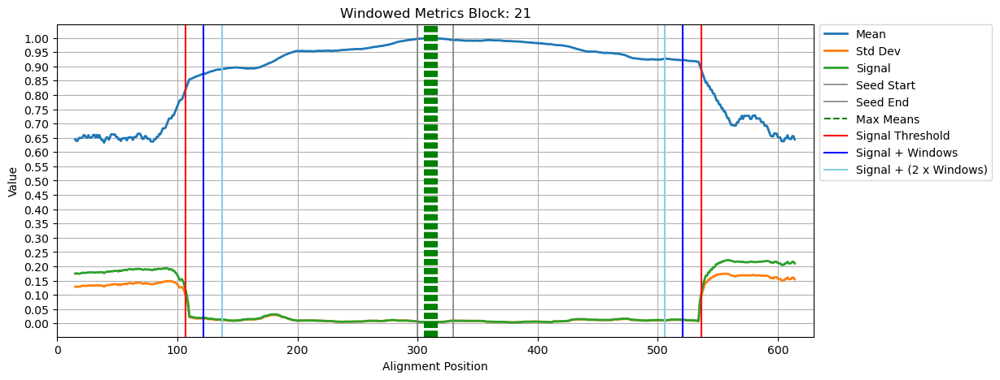

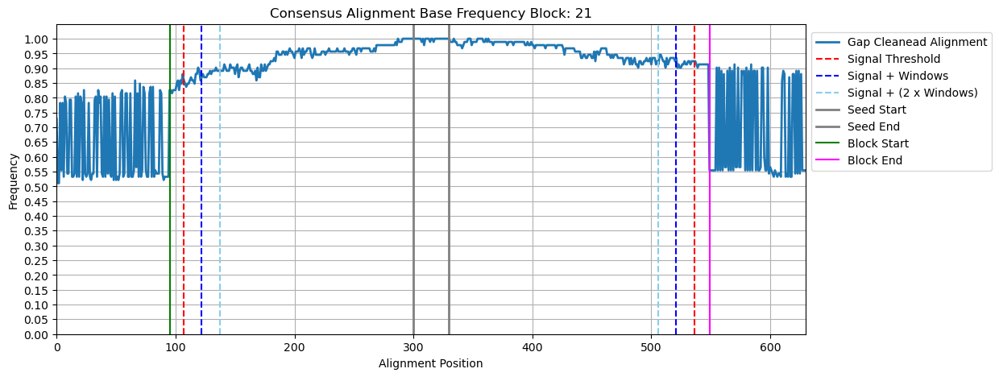

Working on Targe seed k:2798_c:86
Working on Targe seed k:2582_c:88
Working on Targe seed k:2574_c:88
Working on Targe seed k:2583_c:88
Working on Targe seed k:2572_c:88
Working on Targe seed k:2530_c:89
Working on Targe seed k:2440_c:90
Working on Targe seed k:2681_c:87
Working on Targe seed k:2702_c:87
Working on Targe seed k:2651_c:88
Working on Targe seed k:2346_c:91
Working on Targe seed k:2712_c:87
Working on Targe seed k:2629_c:88
Working on Targe seed k:2617_c:88
Working on Targe seed k:2622_c:88
Working on Targe seed k:2668_c:87
Working on Targe seed k:2647_c:88
Working on Targe seed k:2676_c:87
Working on Targe seed k:2680_c:87
Working on Targe seed k:2956_c:84
Working on Targe seed k:2967_c:84
Working on Targe seed k:2950_c:84
Working on Targe seed k:2397_c:90
Working on Targe seed k:2294_c:91
Working on Targe seed k:2914_c:85
Working on Targe seed k:2591_c:88
Working on Targe seed k:2533_c:89
Working on Targe seed k:2532_c:89
Working on Targe seed k:2534_c:89
Working on Tar

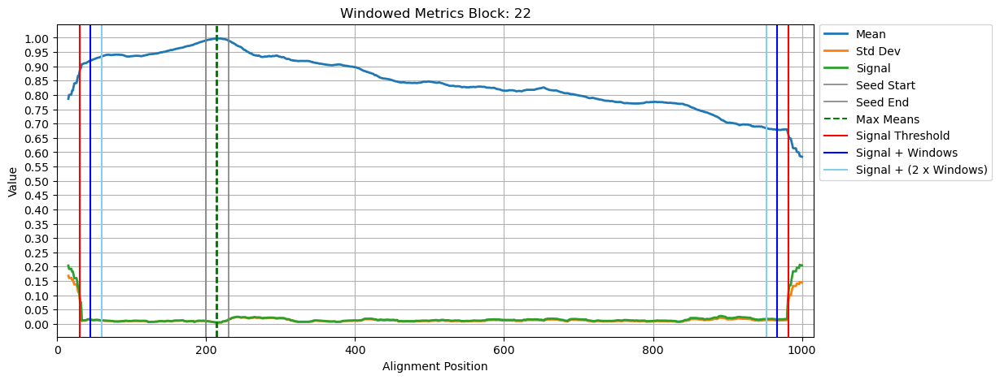

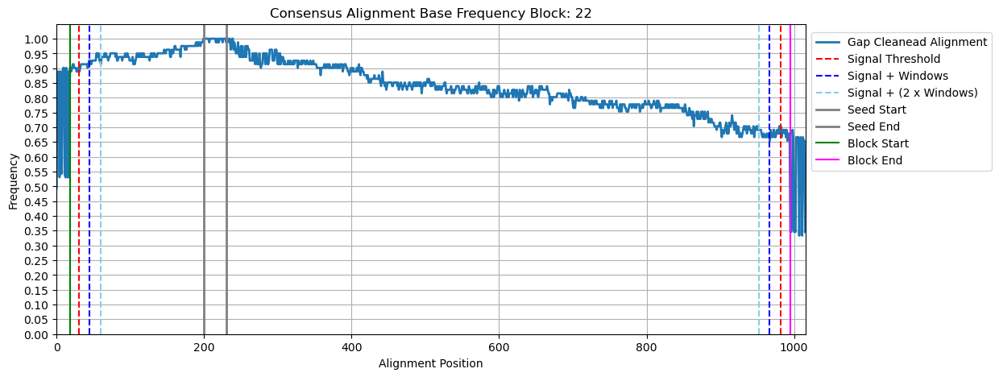

Working on Targe seed k:3121_c:75
Working on Targe seed k:3120_c:75
Working on Targe seed k:3071_c:76
Working on Targe seed k:3111_c:75
Working on Targe seed k:3033_c:78
Working on Targe seed k:3117_c:75
Mapping seed: k:3117_c:75

Processing Block Number: 23

Seed initial size: 30

Start signal Pos: 45
Mean Start signal Pos: 53
End signal Pos: 639
Mean End signal Pos: 634

Running: blastn -query /home/jpereira/OEs/Results/OE1/NamSeqs/Data/seed_extension/kmer30_k:5028_c:49/temp.seeds.fasta -subject /home/jpereira/OEs/Results/OE1/NamSeqs/Data/seed_extension/kmer30_k:5028_c:49/block-temp.fasta -out /home/jpereira/OEs/Results/OE1/NamSeqs/Data/seed_extension/kmer30_k:5028_c:49/temp.blast.seeds_fragment.tsv -reward 1 -gapextend 2 -gapopen 5 -penalty -2 -word_size 10 -outfmt '6 qseqid sseqid pident length mismatch gapopen qstart qend sstart send evalue bitscore qlen slen'
blastn_subject ran successfully.


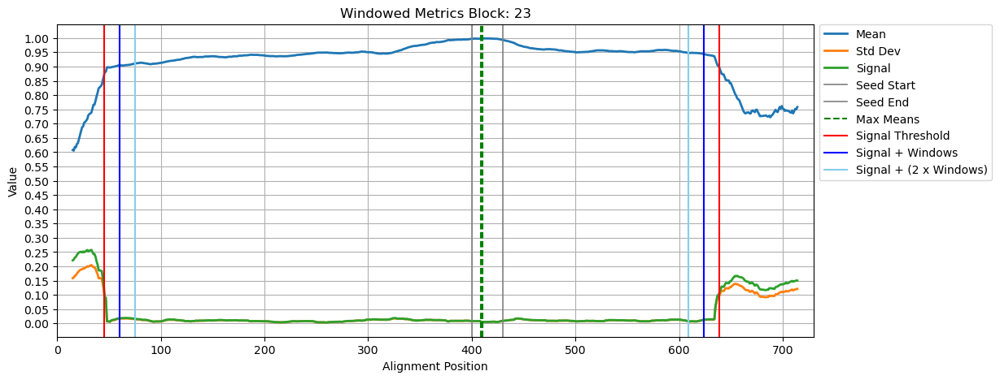

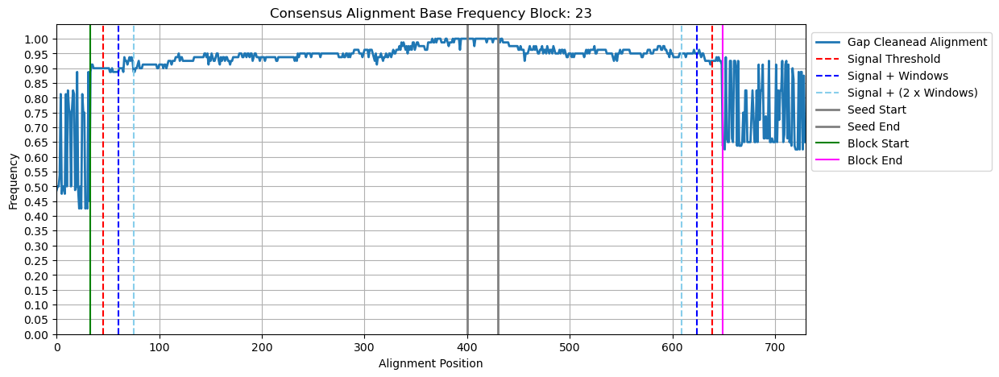

Working on Targe seed k:3131_c:75
Working on Targe seed k:3470_c:73
Working on Targe seed k:3237_c:74
Working on Targe seed k:3514_c:72
Working on Targe seed k:3171_c:75
Working on Targe seed k:3135_c:75
Working on Targe seed k:3067_c:76
Working on Targe seed k:3177_c:75
Working on Targe seed k:3289_c:74
Working on Targe seed k:3760_c:71
Working on Targe seed k:3156_c:75
Working on Targe seed k:3199_c:75
Working on Targe seed k:3166_c:75
Working on Targe seed k:3168_c:75
Working on Targe seed k:3154_c:75
Working on Targe seed k:3408_c:73
Working on Targe seed k:3439_c:73
Working on Targe seed k:3139_c:75
Working on Targe seed k:3272_c:74
Working on Targe seed k:3080_c:76
Working on Targe seed k:3088_c:76
Working on Targe seed k:3037_c:77
Working on Targe seed k:3305_c:74
Working on Targe seed k:3044_c:76
Working on Targe seed k:3331_c:74
Working on Targe seed k:3314_c:74
Working on Targe seed k:3038_c:77
Working on Targe seed k:3326_c:74
Working on Targe seed k:3794_c:71
Working on Tar

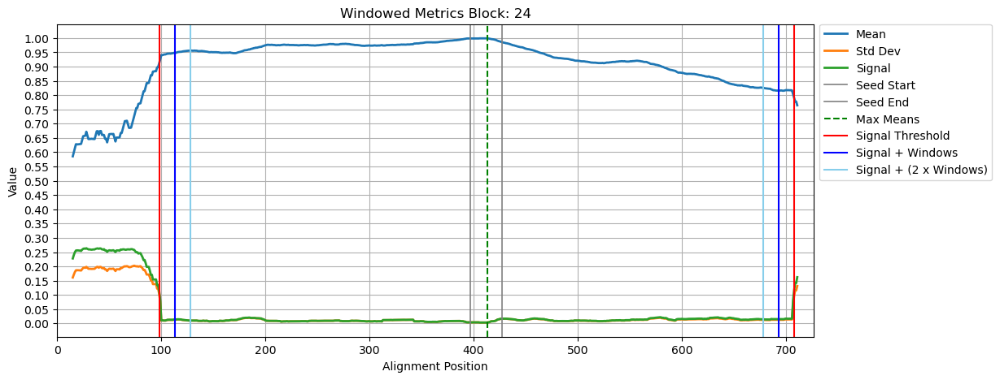

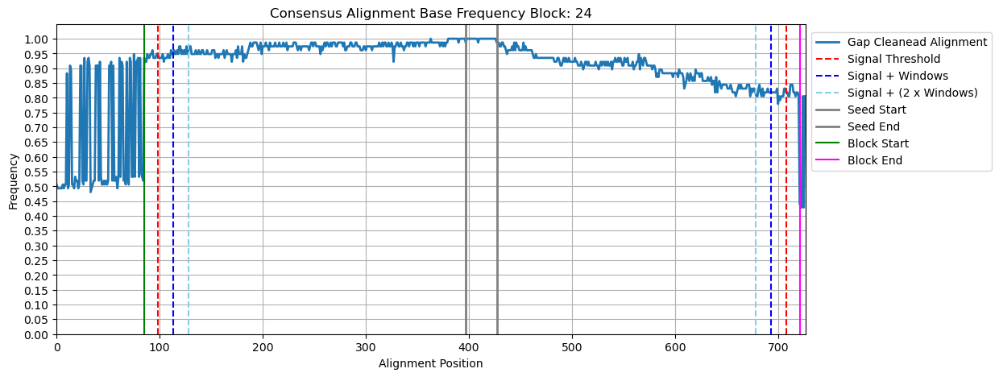

Working on Targe seed k:3253_c:74
Working on Targe seed k:3299_c:74
Working on Targe seed k:3485_c:72
Working on Targe seed k:3098_c:75
Working on Targe seed k:3267_c:74
Working on Targe seed k:3054_c:76
Working on Targe seed k:3049_c:76
Working on Targe seed k:3063_c:76
Working on Targe seed k:3050_c:76
Working on Targe seed k:3273_c:74
Working on Targe seed k:3574_c:72
Working on Targe seed k:3452_c:73
Working on Targe seed k:3503_c:72
Working on Targe seed k:3391_c:73
Working on Targe seed k:3060_c:76
Working on Targe seed k:3542_c:72
Working on Targe seed k:3236_c:74
Working on Targe seed k:3316_c:74
Working on Targe seed k:3132_c:75
Working on Targe seed k:3051_c:76
Working on Targe seed k:3458_c:73
Working on Targe seed k:3309_c:74
Working on Targe seed k:3325_c:74
Working on Targe seed k:3312_c:74
Working on Targe seed k:3334_c:74
Working on Targe seed k:3461_c:73
Working on Targe seed k:3276_c:74
Working on Targe seed k:3254_c:74
Working on Targe seed k:3270_c:74
Working on Tar

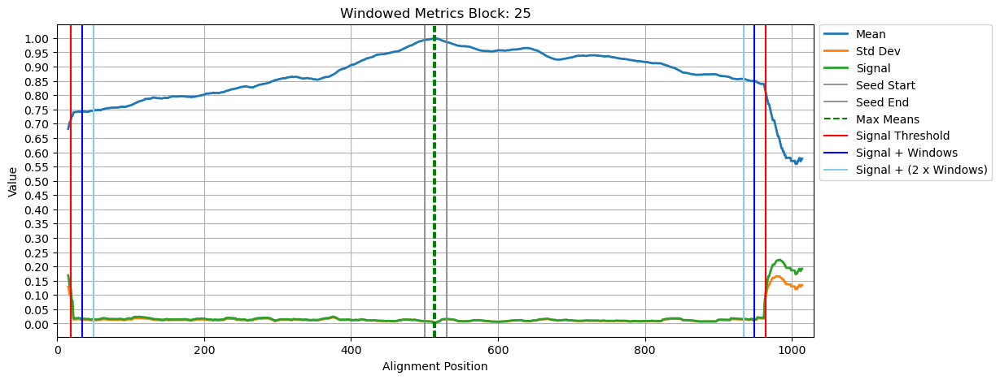

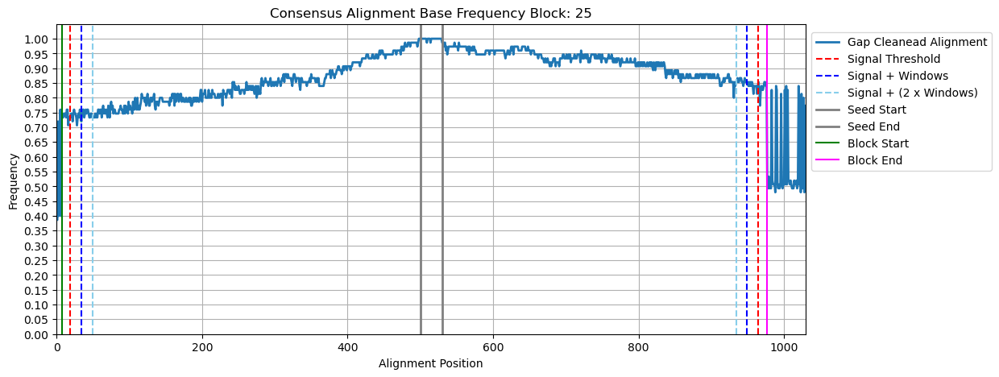

Working on Targe seed k:3548_c:72
Working on Targe seed k:3532_c:72
Working on Targe seed k:3481_c:72
Working on Targe seed k:3529_c:72
Working on Targe seed k:3365_c:73
Working on Targe seed k:3972_c:70
Working on Targe seed k:3964_c:70
Working on Targe seed k:3914_c:70
Working on Targe seed k:3404_c:73
Working on Targe seed k:3410_c:73
Working on Targe seed k:3411_c:73
Working on Targe seed k:3397_c:73
Working on Targe seed k:4017_c:70
Working on Targe seed k:3977_c:70
Working on Targe seed k:3930_c:70
Working on Targe seed k:3396_c:73
Working on Targe seed k:3941_c:70
Working on Targe seed k:3398_c:73
Working on Targe seed k:3421_c:73
Working on Targe seed k:3885_c:70
Working on Targe seed k:3887_c:70
Working on Targe seed k:3602_c:72
Working on Targe seed k:3605_c:72
Working on Targe seed k:4072_c:69
Working on Targe seed k:3377_c:73
Working on Targe seed k:3200_c:75
Working on Targe seed k:3193_c:75
Working on Targe seed k:3244_c:74
Working on Targe seed k:3278_c:74
Working on Tar

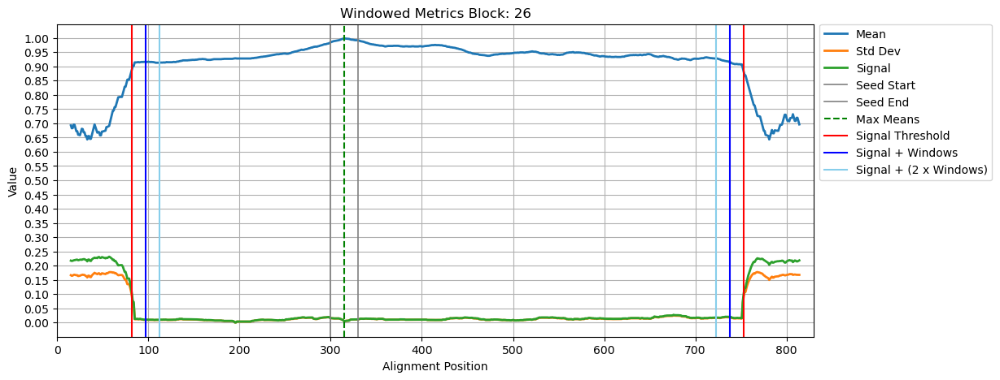

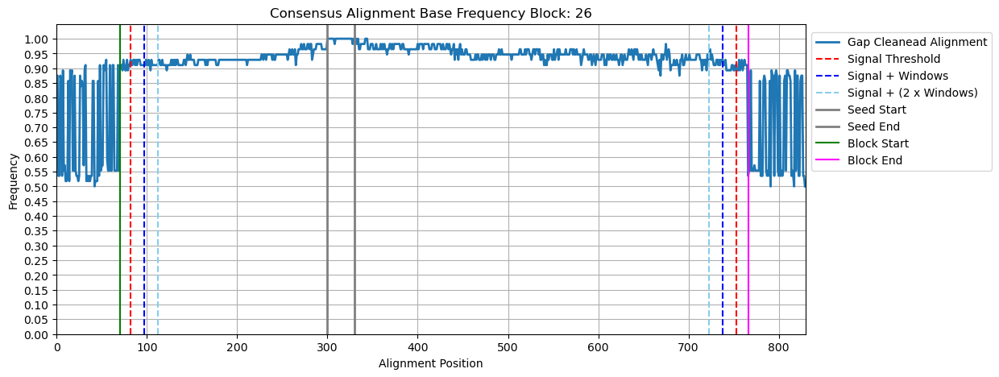

Working on Targe seed k:4867_c:54
Working on Targe seed k:4908_c:53
Working on Targe seed k:4824_c:54
Working on Targe seed k:4907_c:53
Working on Targe seed k:4841_c:54
Working on Targe seed k:4827_c:54
Working on Targe seed k:4848_c:54
Working on Targe seed k:4837_c:54
Working on Targe seed k:4823_c:54
Working on Targe seed k:4995_c:51
Working on Targe seed k:4831_c:54
Working on Targe seed k:4830_c:54
Working on Targe seed k:4829_c:54
Working on Targe seed k:4842_c:54
Working on Targe seed k:4844_c:54
Working on Targe seed k:4843_c:54
Working on Targe seed k:4942_c:52
Working on Targe seed k:4926_c:52
Working on Targe seed k:4899_c:53
Working on Targe seed k:4855_c:54
Working on Targe seed k:4865_c:54
Working on Targe seed k:4864_c:54
Working on Targe seed k:4858_c:54
Working on Targe seed k:4857_c:54
Working on Targe seed k:4832_c:54
Working on Targe seed k:4828_c:54
Working on Targe seed k:4833_c:54
Working on Targe seed k:4856_c:54
Working on Targe seed k:4862_c:54
Working on Tar

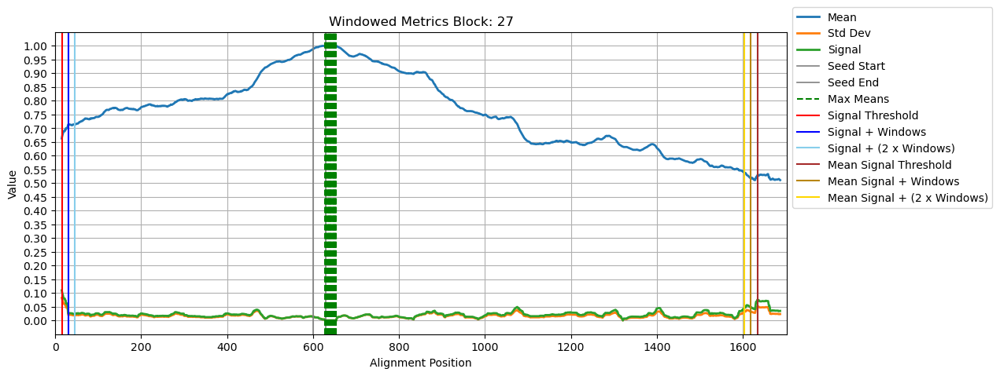

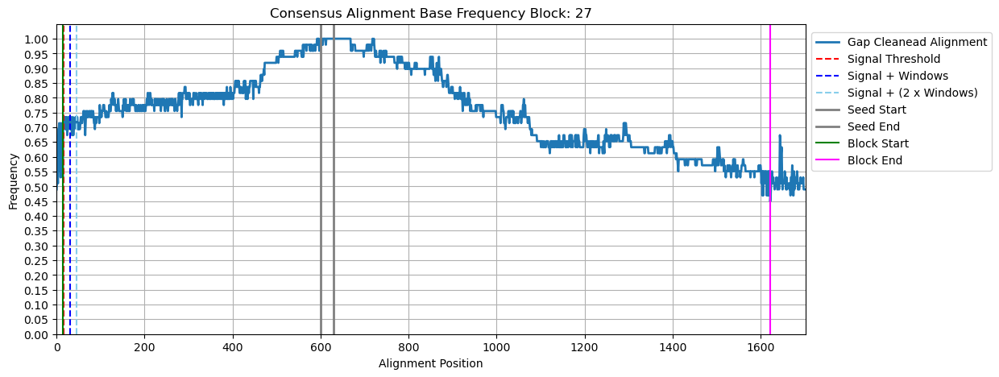

Working on Targe seed k:5025_c:49
Working on Targe seed k:5026_c:49
Working on Targe seed k:5028_c:49
Working on Targe seed k:5031_c:49
Working on Targe seed k:5041_c:49
Working on Targe seed k:5040_c:49
Working on Targe seed k:5039_c:49
Working on Targe seed k:5034_c:49
Working on Targe seed k:5027_c:49
Working on Targe seed k:5146_c:46
Working on Targe seed k:5096_c:47
Working on Targe seed k:5084_c:48
Working on Targe seed k:5045_c:49
Working on Targe seed k:5053_c:48
Working on Targe seed k:5043_c:49
Working on Targe seed k:5119_c:47
Working on Targe seed k:5070_c:48
Working on Targe seed k:5058_c:48
Working on Targe seed k:5055_c:48
Working on Targe seed k:5082_c:48
Working on Targe seed k:5188_c:45
Working on Targe seed k:5197_c:45
Working on Targe seed k:5141_c:46
Working on Targe seed k:5193_c:45
Working on Targe seed k:5164_c:46
Working on Targe seed k:5145_c:46
Working on Targe seed k:5135_c:46
Working on Targe seed k:5136_c:46
Working on Targe seed k:5124_c:47
Working on Tar

In [4]:
################################ Extending each seed to find a block ###############################

temp_seeds_fasta = output_dir / "temp.seeds.fasta"
with open(temp_seeds_fasta, 'w') as fasta:
    for i, row in seeds_df.iterrows():
        fasta.write(f">{row['qseqid']}\n")
        fasta.write(f"{row['seq']}\n")

mapped_seeds = set()

output_blocks_fasta = output_dir / "blocks.fasta" 
temp_block_fasta = output_dir / "block-temp.fasta"
visuals_dir = output_dir / "block_extension_plots"
visuals_dir.mkdir(parents=True, exist_ok=True)

# Initializing final fasta file
with open(output_blocks_fasta, 'w') as fasta:
    fasta.write(f"")

block_num=0
for i, row in seeds_hits_df.iterrows():

    seed = row['qseqid']
    print(f"Working on Targe seed {seed}")
    
    if seed in mapped_seeds:
        continue
    else:
        print(f'Mapping seed: {seed}')
    
    block_num+=1
    
    print(f"\nProcessing Block Number: {block_num}\n")
    seed_mapped_reads = blast_df[blast_df['qseqid'] == seed][['sseqid', 'sstart', 'send', 'slen']]
    seed_mapped_id = set(seed_mapped_reads['sseqid'])

    # ------------------ PARAMETERS ------------------
    
    mean_signal_start = False
    mean_signal_end = False
    
    signal_start = False
    signal_end = False

    # Compute the length of each seed match
    seed_size = blast_df[blast_df['qseqid'] == seed]['qlen'].iloc[0]
    print(f"Seed initial size: {seed_size}")
    
    s_aln_extension = 0
    e_aln_extension = 0
    block_seq = None
    while not block_seq:
        
        if not (signal_start or mean_signal_start):
            s_aln_extension += params_aln_w_step_size
        if not (signal_end or mean_signal_end):
            e_aln_extension += params_aln_w_step_size    

        ##### - - Multiple Sequence Alignment - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - -
        
        # Run alignment function
        aligned, freq_table, consensus_df, real_s_extension, real_e_extension = align_seed_neighbours(
            reads_fasta=input_reads_fasta,
            seed_hits=seed_mapped_reads,
            s_extension=int(s_aln_extension),
            e_extension=int(e_aln_extension),
            threads=10,
            max_iter=100,
            gap_open=1.0,
            gap_extend=0.1,
            show_cmd = False
        )
               
        # Keep only rows where 'base' != '-'
        df_clean = consensus_df[consensus_df['base'] != '-'].copy()
        # Reset index and name that column 'aln_pos'
        df_clean = df_clean.reset_index(names='aln_pos')
        
        n = len(df_clean)
        if n < 2 * params_window_radius:
            print("Not enough data points to compute windowed metrics. Skipping.")
            continue
        
        ##### - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - -
        
        ##### - - Windows Signals - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - -
        
        # Preallocate arrays
        w_means   = np.full(n, np.nan)
        w_stds    = np.full(n, np.nan)
        w_signal  = np.full(n, np.nan)
        
        freqs = df_clean['freq'].values
        signal_pos = []
        for pos in range(params_window_radius, n - params_window_radius):
            segment = freqs[pos - params_window_radius : pos + params_window_radius]
            mean_val = segment.mean()
            std_val  = segment.std()
            sig_val  = std_val * (2 - mean_val)
            
            w_means[pos]  = mean_val
            w_stds[pos]   = std_val
            w_signal[pos] = sig_val
            
            if sig_val > params_signal_threshold:
                signal_pos.append(pos)
                
        # Drop the NaN entries
        valid_mask   = ~np.isnan(w_signal)
        x_vals       = np.where(valid_mask)[0]
        plot_means   = w_means[valid_mask]
        plot_stds    = w_stds[valid_mask]
        plot_signal  = w_signal[valid_mask]
        
        # Calculate mean signal values
        w_mean_sig = np.full(len(plot_signal), np.nan)
        mean_signal_pos = []
        for pos in range(params_window_radius, len(plot_signal) - params_window_radius):
            segment = plot_signal[pos - params_window_radius : pos + params_window_radius]
            mean_sig = segment.mean()
            
            w_mean_sig[pos] = mean_sig
            if mean_sig > params_mean_signal_threshold:
                mean_signal_pos.append(pos + params_window_radius)

        valid_mask      = ~np.isnan(w_mean_sig)
        x_vals_mean_sig = np.where(valid_mask)[0] + params_window_radius
        plot_mean_sig   = w_mean_sig[valid_mask]

        if plot_signal.size == 0:
            print("Warning: no valid signal values. Skipping plot.")
            break
    
        #### - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - -
        
        #### - - Finding Seed Position - - - - - - - - - - - - - - - - - - - - - - - - - -
        
        total_aln_extension = s_aln_extension + seed_size + e_aln_extension
        if total_aln_extension != n:
            print(f"Warning! Differences between alignment extension ({n}) and expected alignment extension ({total_aln_extension})")
            print("Attempting to find original seed position")

            seed_seq = seeds_df[seeds_df['qseqid'] == seed]['seq'].values[0]
            consensus_seq = ''.join(df_clean['base'].astype(str))
            seed_seq = seed_seq.upper()
            consensus_seq = consensus_seq.upper()
            matches = list(re.finditer(seed_seq, consensus_seq))

            if len(matches) > 1:
                print("Multiple matches detected for the same seed.")
                print("Skipping seed.")
                break
            elif len(matches) == 0:
                print("No exact matches found")
                print("Skipping seeds")
                break
            else:
                start_seed_pos = matches[0].start()
                end_seed_pos = matches[0].end()

            if total_aln_extension > params_max_aln_extension:    
                print(f"Warning! Skipping seed {seed}, exceded max alignment extension({params_max_aln_extension })")
                break
        else:
            start_seed_pos = s_aln_extension 
            end_seed_pos   = s_aln_extension + seed_size
            
        #### - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - -
        
        #### - - Finding Signal Relative Ubication - - - - - - - - - - - - - - - - - - - - 

        # Highlight signal above threshold positions
        signal_pos = pd.Series(signal_pos)
        mean_signal_pos = pd.Series(mean_signal_pos)
        
        start_sigs = signal_pos[signal_pos < start_seed_pos]
        end_sigs = signal_pos[signal_pos > end_seed_pos]
        
        mean_start_sigs = mean_signal_pos[mean_signal_pos < start_seed_pos]
        mean_end_sigs = mean_signal_pos[mean_signal_pos > end_seed_pos]

        # Find all positions (in original frame) where signal == max_signal
        max_indices = x_vals[plot_means == plot_means.max()]
        
        if not mean_start_sigs.empty:
            mean_start_signal_pos = max(mean_start_sigs)
            mean_signal_start = True
            
        if not mean_end_sigs.empty:
            mean_end_signal_pos = min(mean_end_sigs)
            mean_signal_end = True

        if not start_sigs.empty:
            start_signal_pos = max(start_sigs)
            signal_start = True
        
        if not end_sigs.empty:
            end_signal_pos = min(end_sigs)
            signal_end = True
        
        max_signal = plot_signal.max()
       
        #### - - Define Block - - - - - - - - - - - - - - - - - - - - - - - - - - - - -
        
        if (signal_start or mean_signal_start) and (signal_end or mean_signal_end):
            if signal_start:
                s_sig_pos = start_signal_pos
            else:
                s_sig_pos = mean_start_signal_pos + params_window_radius
            
            if signal_end:
                e_sig_pos = end_signal_pos
            else:
                e_sig_pos = mean_end_signal_pos - params_window_radius
            
            print(f"\nStart signal Pos: {start_signal_pos}")
            print(f"Mean Start signal Pos: {mean_start_signal_pos}")
            
            print(f"End signal Pos: {end_signal_pos}")
            print(f"Mean End signal Pos: {mean_end_signal_pos}\n")

            
            start_block_pos, end_block_pos = find_block_boundaries(df_clean, s_sig_pos, e_sig_pos, start_seed_pos,
                                                                   end_seed_pos, 10, threshold=0.10)
            
            if not start_seed_pos or not end_block_pos:
                print("Warning the function find_block_boundaries couldn't find a result. Skiping seed")
                print(f"Start Block Positon: {start_block_pos}")
                print(f"End Block Positon: {end_block_pos}")
                break

            # Extract the block sequence
            block_seq = ''.join(df_clean['base'][start_block_pos:end_block_pos + 1])

            # Write to the final and temporary FASTA files
            with open(output_blocks_fasta, 'a') as fasta, open(temp_block_fasta, 'w') as temp_fasta:

                # Final FASTA file
                fasta.write(f">block_{block_num}\n")
                fasta.write(f"{block_seq}\n")

                # Temporary FASTA file used for alignment
                temp_fasta.write(f">block_{block_num}\n")
                temp_fasta.write(f"{block_seq}\n")

        #### - - Discard seeds included in the block - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - -
            
            mapped_seeds.add(seed)          
            temp_block_fasta = output_dir / "block-temp.fasta"

            blast_output_table_tsv = output_dir / "temp.blast.seeds_fragment.tsv"
            blastn_subject(blast_input_seqs=temp_seeds_fasta, 
                            blast_subject_seqs=temp_block_fasta,
                            blast_output_table_tsv=blast_output_table_tsv,
                            word_size=10,gap_extend=2, gapopen=5,penalty=-2)

            seeds_block_df  = pd.read_csv(blast_output_table_tsv, sep='\t')
            seeds_block_df.columns = default_blast_columns

            seed_coverage_filter = (seeds_block_df['length'] / seeds_block_df['qlen'] > params_seed_map_coverage_threshold)
            aln_len_filter = (seeds_block_df['length'] >= 20)
            aln_pident_filter = (seeds_block_df['pident'] > 85)

            seeds_block_df = seeds_block_df[aln_len_filter & aln_pident_filter & seed_coverage_filter]
            
            mapped_seeds.update(seeds_block_df['qseqid'])

        #### - - Plotting Windowed Means Alignments Metrics - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - -

        if block_seq or ((signal_start or mean_signal_start) and (signal_end or mean_signal_end)):
            plt.figure(figsize=(12, 5))
            plt.yticks(np.linspace(0, 1, 21).round(2))
            plt.xlabel("Alignment Position")
            plt.ylabel("Value")
            plt.title(f"Windowed Metrics Block: {block_num}")
            
            plt.plot(x_vals, plot_means,  label="Mean", linewidth=2)
            plt.plot(x_vals, plot_stds,   label="Std Dev", linewidth=2)
            plt.plot(x_vals, plot_signal, label="Signal", linewidth=2)
        
            plt.axvline(start_seed_pos, color='gray', linestyle='-',linewidth=1.2, label='Seed Start')
            plt.axvline(end_seed_pos,   color='gray', linestyle='-',linewidth=1.2, label='Seed End')
            
            # Highlight all max-means positions
            for idx in max_indices:
                plt.axvline(idx, color='green', linestyle='--', label='Max Means')
            
            if not start_sigs.empty:
                plt.axvline(start_signal_pos, color='red', linestyle='-', label='Signal Threshold')
                plt.axvline(start_signal_pos + params_window_radius, color='Blue', linestyle='-', label='Signal + Windows')
                plt.axvline(start_signal_pos + 2 * params_window_radius, color='Skyblue', linestyle='-', label='Signal + (2 x Windows)')
            elif not mean_start_sigs.empty:
                plt.axvline(mean_start_signal_pos, color='brown', linestyle='-', label='Mean Signal Threshold')
                plt.axvline(mean_start_signal_pos + params_window_radius, color='darkgoldenrod', linestyle='-', label='Mean Signal + Windows')
                plt.axvline(mean_start_signal_pos + 2 * params_window_radius, color='gold', linestyle='-', label='Mean Signal + (2 x Windows)')

            
            if not end_sigs.empty:
                plt.axvline(end_signal_pos, color='red', linestyle='-', label='Signal Threshold')
                plt.axvline(end_signal_pos - params_window_radius, color='Blue', linestyle='-', label='Signal + Windows')
                plt.axvline(end_signal_pos - 2 * params_window_radius, color='Skyblue', linestyle='-', label='Signal + (2 x Windows)')                
            elif not mean_end_sigs.empty:
                plt.axvline(mean_end_signal_pos, color='brown', linestyle='-', label='Mean Signal Threshold')
                plt.axvline(mean_end_signal_pos - params_window_radius, color='darkgoldenrod', linestyle='-', label='Mean Signal + Windows')
                plt.axvline(mean_end_signal_pos - 2 * params_window_radius, color='gold', linestyle='-', label='Mean Signal + (2 x Windows)')
            
            # Remove duplicate legend entries
            handles, labels = plt.gca().get_legend_handles_labels()
            unique = dict(zip(labels, handles))
            plt.legend(unique.values(), unique.keys(), loc='center left', bbox_to_anchor=(1, 0.75))
            
            plt.grid(visible='both')
            plt.xlim(left=0, right=n)
            plt.savefig(visuals_dir / f"windowed_msa_metrics_block_{block_num}.svg" )
            plt.show()
            plt.close()
            
            #plot_windowed_metrics(
            #    x_vals=x_vals,
            #    plot_means=plot_means,
            #    plot_stds=plot_stds,
            #    plot_signal=plot_signal,
            #    block_num=block_num,
            #    start_seed_pos=start_seed_pos,
            #    end_seed_pos=end_seed_pos,
            #    max_indices=max_indices,
            #    start_sigs=start_sigs,
            #    mean_start_sigs=mean_start_sigs,
            #    end_sigs=end_sigs,
            #    mean_end_sigs=mean_end_sigs,
            #    start_signal_pos=start_signal_pos,
            #    mean_start_signal_pos=mean_start_signal_pos,
            #    end_signal_pos=end_signal_pos,
            #    mean_end_signal_pos=mean_end_signal_pos,
            #    params_window_radius=params_window_radius,
            #    n=n,
            #    visuals_dir=visuals_dir,
            #    )

        
        #### - - Plotting Crude Alignments Metrics  - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - -
            
            plt.figure(figsize=(12, 5))
            plt.yticks(np.linspace(0, 1, 21).round(2))
            plt.xlabel("Alignment Position")
            plt.ylabel("Frequency")
            plt.title(f"Consensus Alignment Base Frequency Block: {block_num}")

            plt.plot(df_clean['freq'],  label="Gap Cleanead Alignment", linewidth=2)

            if not start_sigs.empty:
                plt.axvline(start_signal_pos, color='red', linestyle='--', label='Signal Threshold')
                plt.axvline(start_signal_pos +  params_window_radius, color='Blue', linestyle='--', label='Signal + Windows')
                plt.axvline(start_signal_pos + 2 * params_window_radius, color='Skyblue', linestyle='--', label='Signal + (2 x Windows)')

            if not end_sigs.empty:
                plt.axvline(end_signal_pos, color='red', linestyle='--', label='Signal Threshold')
                plt.axvline(end_signal_pos - params_window_radius, color='Blue', linestyle='--', label='Signal + Windows')
                plt.axvline(end_signal_pos - 2 * params_window_radius, color='Skyblue', linestyle='--', label='Signal + (2 x Windows)')

            plt.axvline(start_seed_pos, color='gray', linestyle='-',linewidth = 2, label='Seed Start')
            plt.axvline(end_seed_pos,   color='gray', linestyle='-',linewidth = 2, label='Seed End')

            if (signal_start or mean_signal_start) and (signal_end or mean_signal_end):
                plt.axvline(start_block_pos, color="Green", linestyle='-', label="Block Start")
                plt.axvline(end_block_pos + 1, color="Fuchsia", linestyle='-', label="Block End")

            # Remove duplicate legend entries
            handles, labels = plt.gca().get_legend_handles_labels()
            unique = dict(zip(labels, handles))
            plt.legend(unique.values(), unique.keys(), loc='center left', bbox_to_anchor=(1, 0.75))

            plt.grid(visible='both')
            plt.xlim(left=0, right=n)
            plt.ylim(bottom = 0, top= 1.05)
            plt.savefig(visuals_dir / f"consensus_msa_frequency_block_{block_num}.svg" )
            plt.show()
            plt.close()

        #### - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - -

In [7]:
################################ Extending each seed to find a block ###############################

temp_seeds_fasta = output_dir / "temp.seeds.fasta"
with open(temp_seeds_fasta, 'w') as fasta:
    for i, row in seeds_df.iterrows():
        fasta.write(f">{row['qseqid']}\n")
        fasta.write(f"{row['seq']}\n")

mapped_seeds = set()

output_blocks_fasta = output_dir / "blocks.fasta" 
temp_block_fasta = output_dir / "block-temp.fasta"
visuals_dir = output_dir / "block_extension_plots"
visuals_dir.mkdir(parents=True, exist_ok=True)

# Initializing final fasta file
with open(output_blocks_fasta, 'w') as fasta:
    fasta.write(f"")

block_num=0
for i, row in seeds_hits_df.iterrows():

    seed = row['qseqid']
    print(f"Working on Targe seed {seed}")
    
    if seed in mapped_seeds:
        continue
    else:
        print(f'Mapping seed: {seed}')
    
    block_num+=1
    
    print(f"\nProcessing Block Number: {block_num}\n")
    seed_mapped_reads = blast_df[blast_df['qseqid'] == seed][['sseqid', 'sstart', 'send', 'slen']]
    seed_mapped_id = set(seed_mapped_reads['sseqid'])

    # ------------------ PARAMETERS ------------------
    
    mean_signal_start = False
    mean_signal_end = False
    
    signal_start = False
    signal_end = False

    # Compute the length of each seed match
    seed_size = blast_df[blast_df['qseqid'] == seed]['qlen'].iloc[0]
    print(f"Seed initial size: {seed_size}")
    
    s_aln_extension = 0
    e_aln_extension = 0
    block_seq = None
    while not block_seq:
        
        if not (signal_start or mean_signal_start):
            s_aln_extension += params_aln_w_step_size
        if not (signal_end or mean_signal_end):
            e_aln_extension += params_aln_w_step_size    

        ##### - - Multiple Sequence Alignment - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - -
        
        # Run alignment function
        aligned, freq_table, consensus_df, real_s_extension, real_e_extension = align_seed_neighbours(
            reads_fasta=input_reads_fasta,
            seed_hits=seed_mapped_reads,
            s_extension=int(s_aln_extension),
            e_extension=int(e_aln_extension),
            threads=10,
            max_iter=100,
            gap_open=1.0,
            gap_extend=0.1,
            show_cmd = False
        )
               
        # Keep only rows where 'base' != '-'
        df_clean = consensus_df[consensus_df['base'] != '-'].copy()
        # Reset index and name that column 'aln_pos'
        df_clean = df_clean.reset_index(names='aln_pos')
        
        n = len(df_clean)
        if n < 2 * params_window_radius:
            print("Not enough data points to compute windowed metrics. Skipping.")
            continue
        
        ##### - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - -
        
        ##### - - Windows Signals - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - -
        
        # Preallocate arrays
        w_means   = np.full(n, np.nan)
        w_stds    = np.full(n, np.nan)
        w_signal  = np.full(n, np.nan)
        
        freqs = df_clean['freq'].values
        signal_pos = []
        for pos in range(params_window_radius, n - params_window_radius):
            segment = freqs[pos - params_window_radius : pos + params_window_radius]
            mean_val = segment.mean()
            std_val  = segment.std()
            sig_val  = std_val * (2 - mean_val)
            
            w_means[pos]  = mean_val
            w_stds[pos]   = std_val
            w_signal[pos] = sig_val
            
            if sig_val > params_signal_threshold:
                signal_pos.append(pos)
                
        # Drop the NaN entries
        valid_mask   = ~np.isnan(w_signal)
        x_vals       = np.where(valid_mask)[0]
        plot_means   = w_means[valid_mask]
        plot_stds    = w_stds[valid_mask]
        plot_signal  = w_signal[valid_mask]
        
        # Calculate mean signal values
        w_mean_sig = np.full(len(plot_signal), np.nan)
        mean_signal_pos = []
        for pos in range(params_window_radius, len(plot_signal) - params_window_radius):
            segment = plot_signal[pos - params_window_radius : pos + params_window_radius]
            mean_sig = segment.mean()
            
            w_mean_sig[pos] = mean_sig
            if mean_sig > params_mean_signal_threshold:
                mean_signal_pos.append(pos + params_window_radius)

        valid_mask      = ~np.isnan(w_mean_sig)
        x_vals_mean_sig = np.where(valid_mask)[0] + params_window_radius
        plot_mean_sig   = w_mean_sig[valid_mask]

        if plot_signal.size == 0:
            print("Warning: no valid signal values. Skipping plot.")
            break
    
        #### - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - -
        
        #### - - Finding Seed Position - - - - - - - - - - - - - - - - - - - - - - - - - -
        
        total_aln_extension = s_aln_extension + seed_size + e_aln_extension
        if total_aln_extension != n:
            print(f"Warning! Differences between alignment extension ({n}) and expected alignment extension ({total_aln_extension})")
            print("Attempting to find original seed position")

            seed_seq = seeds_df[seeds_df['qseqid'] == seed]['seq'].values[0]
            consensus_seq = ''.join(df_clean['base'].astype(str))
            seed_seq = seed_seq.upper()
            consensus_seq = consensus_seq.upper()
            matches = list(re.finditer(seed_seq, consensus_seq))

            if len(matches) > 1:
                print("Multiple matches detected for the same seed.")
                print("Skipping seed.")
                break
            elif len(matches) == 0:
                print("No exact matches found")
                print("Skipping seeds")
                break
            else:
                start_seed_pos = matches[0].start()
                end_seed_pos = matches[0].end()

            if total_aln_extension > params_max_aln_extension:    
                print(f"Warning! Skipping seed {seed}, exceded max alignment extension({params_max_aln_extension })")
                break
        else:
            start_seed_pos = s_aln_extension 
            end_seed_pos   = s_aln_extension + seed_size
            
        #### - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - -
        
        #### - - Finding Signal Relative Ubication - - - - - - - - - - - - - - - - - - - - 

        # Highlight signal above threshold positions
        signal_pos = pd.Series(signal_pos)
        mean_signal_pos = pd.Series(mean_signal_pos)
        
        start_sigs = signal_pos[signal_pos < start_seed_pos]
        end_sigs = signal_pos[signal_pos > end_seed_pos]
        
        mean_start_sigs = mean_signal_pos[mean_signal_pos < start_seed_pos]
        mean_end_sigs = mean_signal_pos[mean_signal_pos > end_seed_pos]

        # Find all positions (in original frame) where signal == max_signal
        max_indices = x_vals[plot_means == plot_means.max()]
        
        if not mean_start_sigs.empty:
            mean_start_signal_pos = max(mean_start_sigs)
            mean_signal_start = True
            
        if not mean_end_sigs.empty:
            mean_end_signal_pos = min(mean_end_sigs)
            mean_signal_end = True

        if not start_sigs.empty:
            start_signal_pos = max(start_sigs)
            signal_start = True
        
        if not end_sigs.empty:
            end_signal_pos = min(end_sigs)
            signal_end = True
        
        max_signal = plot_signal.max()
       
        #### - - Define Block - - - - - - - - - - - - - - - - - - - - - - - - - - - - -
        
        if (signal_start or mean_signal_start) and (signal_end or mean_signal_end):
            if signal_start:
                s_sig_pos = start_signal_pos
            else:
                s_sig_pos = mean_start_signal_pos + params_window_radius
            
            if signal_end:
                e_sig_pos = end_signal_pos
            else:
                e_sig_pos = mean_end_signal_pos - params_window_radius
            
            print(f"\nStart signal Pos: {start_signal_pos}")
            print(f"Mean Start signal Pos: {mean_start_signal_pos}")
            
            print(f"End signal Pos: {end_signal_pos}")
            print(f"Mean End signal Pos: {mean_end_signal_pos}\n")

            
            start_block_pos, end_block_pos = find_block_boundaries(df_clean, s_sig_pos, e_sig_pos, start_seed_pos,
                                                                   end_seed_pos, 10, threshold=0.10)
            
            if not start_seed_pos or not end_block_pos:
                print("Warning the function find_block_boundaries couldn't find a result. Skiping seed")
                print(f"Start Block Positon: {start_block_pos}")
                print(f"End Block Positon: {end_block_pos}")
                break

            # Extract the block sequence
            block_seq = ''.join(df_clean['base'][start_block_pos:end_block_pos + 1])

            # Write to the final and temporary FASTA files
            with open(output_blocks_fasta, 'a') as fasta, open(temp_block_fasta, 'w') as temp_fasta:

                # Final FASTA file
                fasta.write(f">block_{block_num}\n")
                fasta.write(f"{block_seq}\n")

                # Temporary FASTA file used for alignment
                temp_fasta.write(f">block_{block_num}\n")
                temp_fasta.write(f"{block_seq}\n")

        #### - - Discard seeds included in the block - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - -
            
            mapped_seeds.add(seed)          
            temp_block_fasta = output_dir / "block-temp.fasta"

            blast_output_table_tsv = output_dir / "temp.blast.seeds_fragment.tsv"
            blastn_subject(blast_input_seqs=temp_seeds_fasta, 
                            blast_subject_seqs=temp_block_fasta,
                            blast_output_table_tsv=blast_output_table_tsv,
                            word_size=10,gap_extend=2, gapopen=5,penalty=-2)

            seeds_block_df  = pd.read_csv(blast_output_table_tsv, sep='\t')
            seeds_block_df.columns = default_blast_columns

            seed_coverage_filter = (seeds_block_df['length'] / seeds_block_df['qlen'] > params_seed_map_coverage_threshold)
            aln_len_filter = (seeds_block_df['length'] >= 20)
            aln_pident_filter = (seeds_block_df['pident'] > 85)

            seeds_block_df = seeds_block_df[aln_len_filter & aln_pident_filter & seed_coverage_filter]
            
            mapped_seeds.update(seeds_block_df['qseqid'])

        #### - - Plotting Windowed Means Alignments Metrics - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - -

        if block_seq or ((signal_start or mean_signal_start) and (signal_end or mean_signal_end)):
            
            plot_windowed_metrics(
                x_vals=x_vals,
                plot_means=plot_means,
                plot_stds=plot_stds,
                plot_signal=plot_signal,
                block_num=block_num,
                start_seed_pos=start_seed_pos,
                end_seed_pos=end_seed_pos,
                max_indices=max_indices,
                start_sigs=start_sigs,
                mean_start_sigs=mean_start_sigs,
                end_sigs=end_sigs,
                mean_end_sigs=mean_end_sigs,
                start_signal_pos=start_signal_pos,
                mean_start_signal_pos=mean_start_signal_pos,
                end_signal_pos=end_signal_pos,
                mean_end_signal_pos=mean_end_signal_pos,
                params_window_radius=params_window_radius,
                n=n,
                visuals_dir=visuals_dir,
                )

        
        #### - - Plotting Crude Alignments Metrics  - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - -
                       
            plot_consensus_frequency(
                df_clean=df_clean,
                block_num=block_num,
                start_seed_pos=start_seed_pos,
                end_seed_pos=end_seed_pos,
                start_sigs=start_sigs,
                end_sigs=end_sigs,
                start_signal_pos=start_signal_pos,
                end_signal_pos=end_signal_pos,
                params_window_radius=params_window_radius,
                signal_start=signal_start,
                mean_signal_start=mean_signal_start,
                signal_end=signal_end,
                mean_signal_end=mean_signal_end,
                start_block_pos=start_block_pos,
                end_block_pos=end_block_pos,
                n=n,
                visuals_dir=visuals_dir,
            )

        #### - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - -

NameError: name 'seeds_hits_df' is not defined

Working on target seed: k:0_c:363
Mapping seed: k:0_c:363

Processing Block Number: 1

Seed initial size: 30
Warning! Alignment extension (226) != expected (230). Attempting to locate seed in consensus.

Start signal Pos: 64
Mean Start signal Pos: 69
End signal Pos: 132
Mean End signal Pos: 132

Running: blastn -query /home/jpereira/OEs/Results/OE1/NamSeqs/Data/seed_extension/test/temp.seeds.fasta -subject /home/jpereira/OEs/Results/OE1/NamSeqs/Data/seed_extension/test/block-temp.fasta -out /home/jpereira/OEs/Results/OE1/NamSeqs/Data/seed_extension/test/temp.blast.seeds_fragment.tsv -reward 1 -gapextend 2 -gapopen 5 -penalty -2 -word_size 10 -outfmt '6 qseqid sseqid pident length mismatch gapopen qstart qend sstart send evalue bitscore qlen slen'
blastn_subject ran successfully.


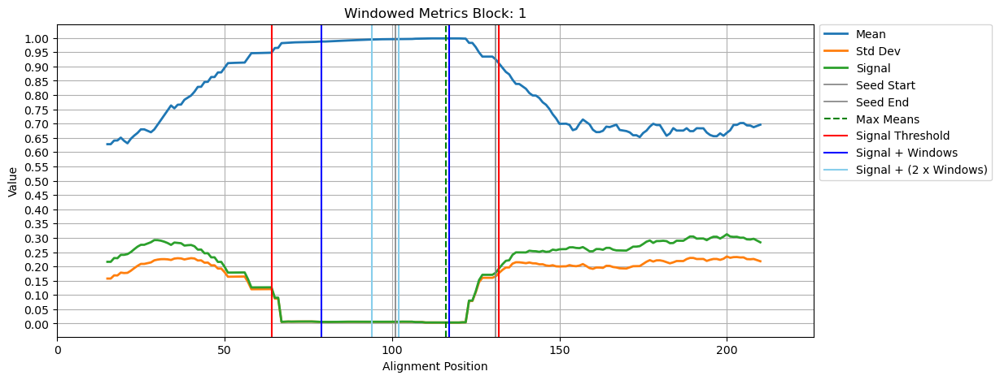

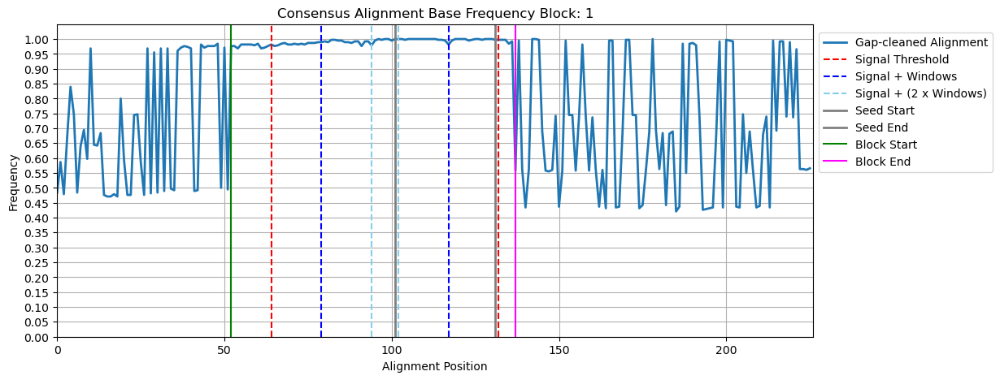

Working on target seed: k:5_c:361
Working on target seed: k:14_c:353
Working on target seed: k:8_c:361
Working on target seed: k:6_c:361
Working on target seed: k:2_c:362
Working on target seed: k:1_c:362
Working on target seed: k:11_c:357
Working on target seed: k:10_c:360
Working on target seed: k:3_c:361
Working on target seed: k:31_c:346
Working on target seed: k:9_c:361
Working on target seed: k:4_c:361
Working on target seed: k:7_c:361
Working on target seed: k:48_c:339
Working on target seed: k:42_c:341
Working on target seed: k:35_c:345
Working on target seed: k:17_c:350
Working on target seed: k:50_c:338
Working on target seed: k:49_c:338
Working on target seed: k:12_c:355
Working on target seed: k:19_c:350
Working on target seed: k:37_c:343
Working on target seed: k:188_c:201
Working on target seed: k:868_c:153
Working on target seed: k:38_c:343
Working on target seed: k:21_c:349
Working on target seed: k:29_c:347
Working on target seed: k:24_c:349
Working on target seed: k:2

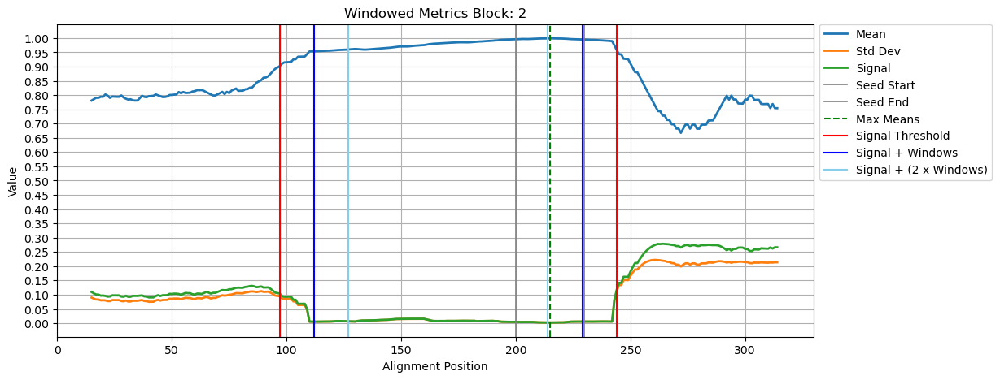

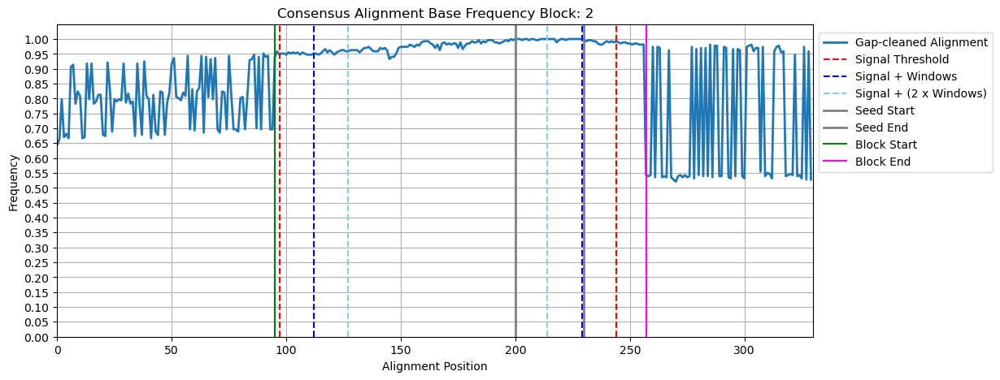

Working on target seed: k:57_c:257
Working on target seed: k:59_c:257
Working on target seed: k:58_c:257
Working on target seed: k:66_c:255
Working on target seed: k:65_c:255
Working on target seed: k:64_c:255
Working on target seed: k:72_c:254
Working on target seed: k:61_c:255
Working on target seed: k:67_c:255
Working on target seed: k:104_c:245
Working on target seed: k:60_c:256
Working on target seed: k:78_c:254
Working on target seed: k:74_c:254
Working on target seed: k:91_c:249
Working on target seed: k:90_c:250
Working on target seed: k:85_c:252
Working on target seed: k:93_c:249
Working on target seed: k:79_c:254
Working on target seed: k:69_c:255
Working on target seed: k:80_c:253
Working on target seed: k:77_c:254
Working on target seed: k:63_c:255
Working on target seed: k:89_c:251
Working on target seed: k:73_c:254
Working on target seed: k:102_c:245
Working on target seed: k:101_c:245
Working on target seed: k:99_c:246
Working on target seed: k:82_c:253
Working on target

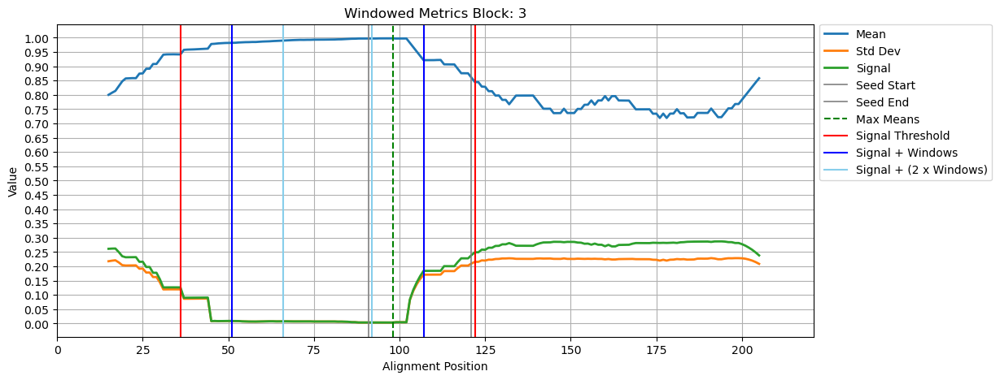

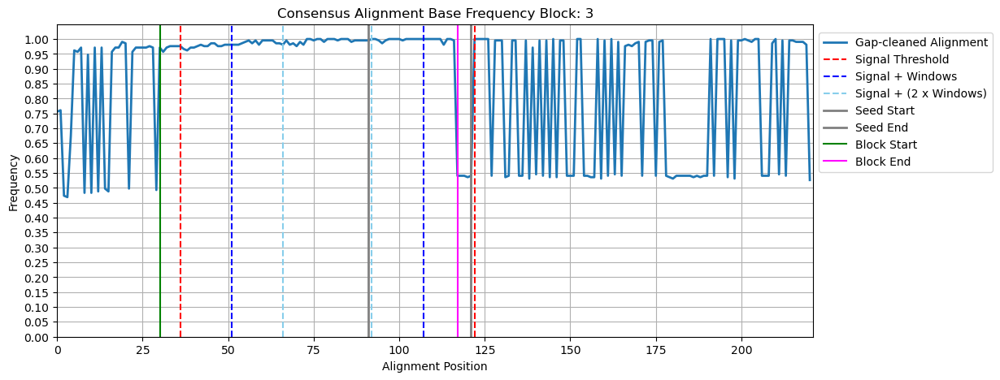

Working on target seed: k:1549_c:106
Working on target seed: k:2242_c:91
Working on target seed: k:212_c:190
Mapping seed: k:212_c:190

Processing Block Number: 4

Seed initial size: 30

Start signal Pos: 99
Mean Start signal Pos: 99
End signal Pos: 281
Mean End signal Pos: 275

Running: blastn -query /home/jpereira/OEs/Results/OE1/NamSeqs/Data/seed_extension/test/temp.seeds.fasta -subject /home/jpereira/OEs/Results/OE1/NamSeqs/Data/seed_extension/test/block-temp.fasta -out /home/jpereira/OEs/Results/OE1/NamSeqs/Data/seed_extension/test/temp.blast.seeds_fragment.tsv -reward 1 -gapextend 2 -gapopen 5 -penalty -2 -word_size 10 -outfmt '6 qseqid sseqid pident length mismatch gapopen qstart qend sstart send evalue bitscore qlen slen'
blastn_subject ran successfully.


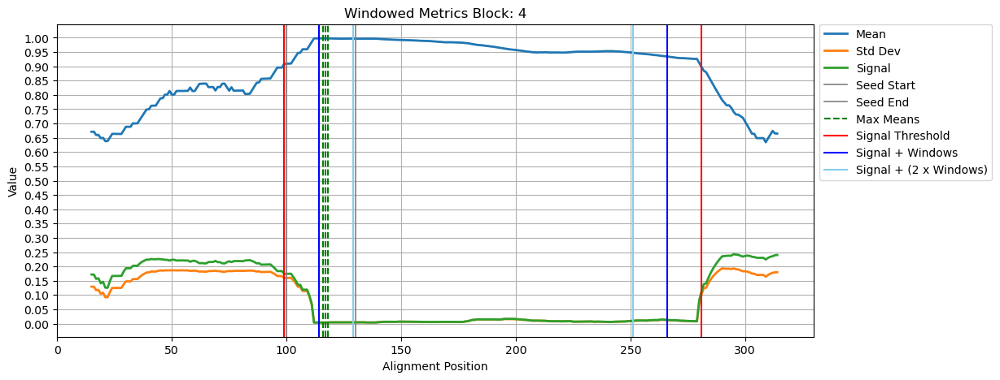

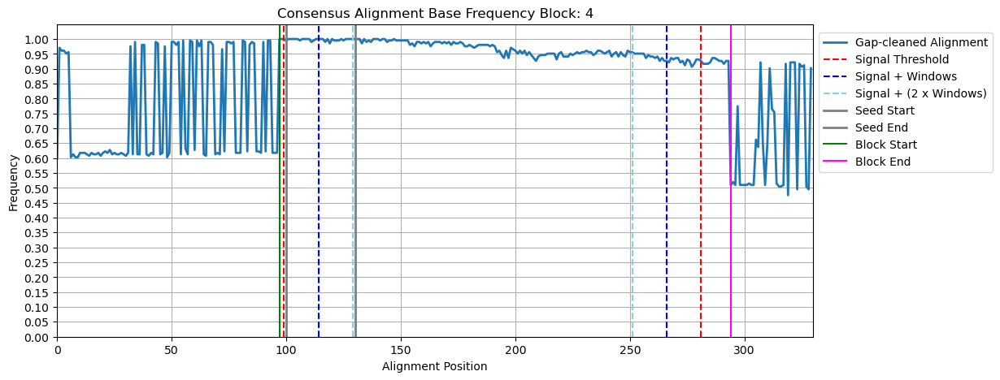

Working on target seed: k:198_c:191
Working on target seed: k:215_c:190
Working on target seed: k:1256_c:117
Working on target seed: k:195_c:192
Working on target seed: k:206_c:191
Working on target seed: k:203_c:191
Working on target seed: k:204_c:191
Working on target seed: k:194_c:192
Mapping seed: k:194_c:192

Processing Block Number: 5

Seed initial size: 30
Warning! Alignment extension (321) != expected (330). Attempting to locate seed in consensus.

Start signal Pos: 99
Mean Start signal Pos: 99
End signal Pos: 283
Mean End signal Pos: 280

Running: blastn -query /home/jpereira/OEs/Results/OE1/NamSeqs/Data/seed_extension/test/temp.seeds.fasta -subject /home/jpereira/OEs/Results/OE1/NamSeqs/Data/seed_extension/test/block-temp.fasta -out /home/jpereira/OEs/Results/OE1/NamSeqs/Data/seed_extension/test/temp.blast.seeds_fragment.tsv -reward 1 -gapextend 2 -gapopen 5 -penalty -2 -word_size 10 -outfmt '6 qseqid sseqid pident length mismatch gapopen qstart qend sstart send evalue bitsco

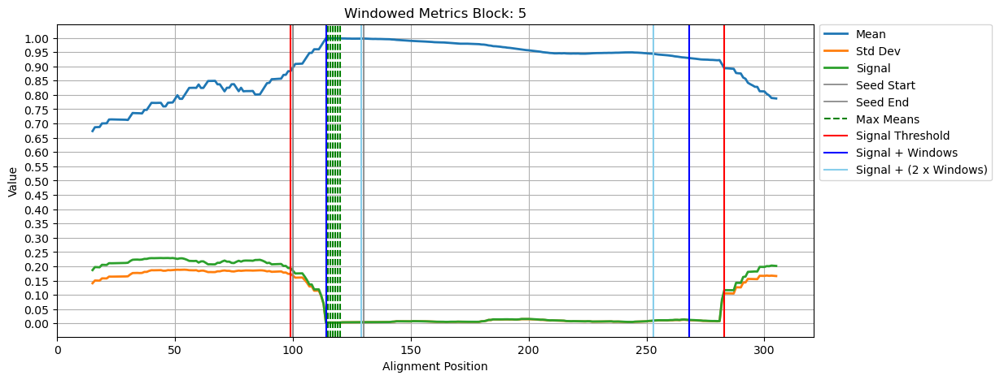

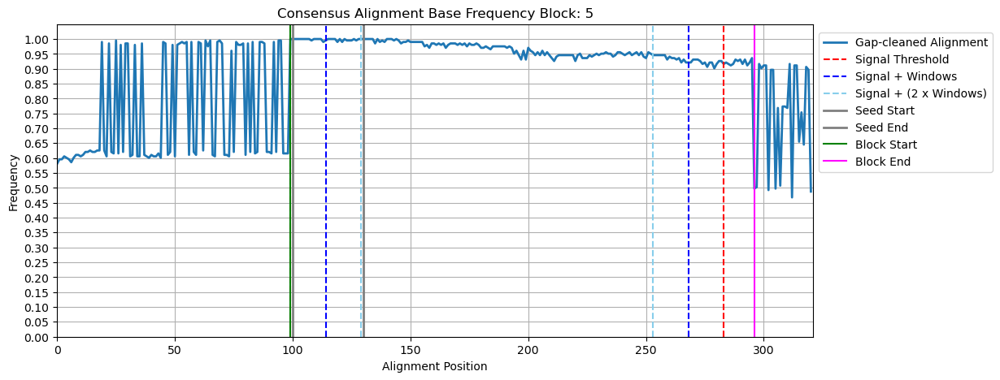

Working on target seed: k:205_c:191
Working on target seed: k:243_c:188
Working on target seed: k:220_c:189
Working on target seed: k:231_c:189
Working on target seed: k:278_c:187
Working on target seed: k:230_c:189
Working on target seed: k:276_c:187
Working on target seed: k:225_c:189
Working on target seed: k:224_c:189
Working on target seed: k:219_c:189
Working on target seed: k:260_c:187
Working on target seed: k:238_c:189
Working on target seed: k:239_c:189
Working on target seed: k:199_c:191
Working on target seed: k:240_c:189
Working on target seed: k:233_c:189
Working on target seed: k:234_c:189
Working on target seed: k:252_c:188
Working on target seed: k:3125_c:75
Working on target seed: k:197_c:192
Working on target seed: k:279_c:187
Working on target seed: k:196_c:192
Working on target seed: k:209_c:190
Working on target seed: k:201_c:191
Working on target seed: k:208_c:190
Working on target seed: k:294_c:186
Working on target seed: k:200_c:191
Working on target seed: k:22

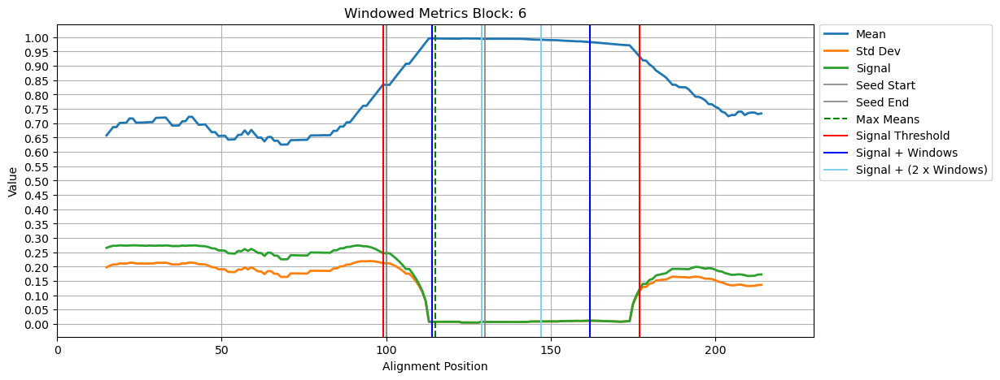

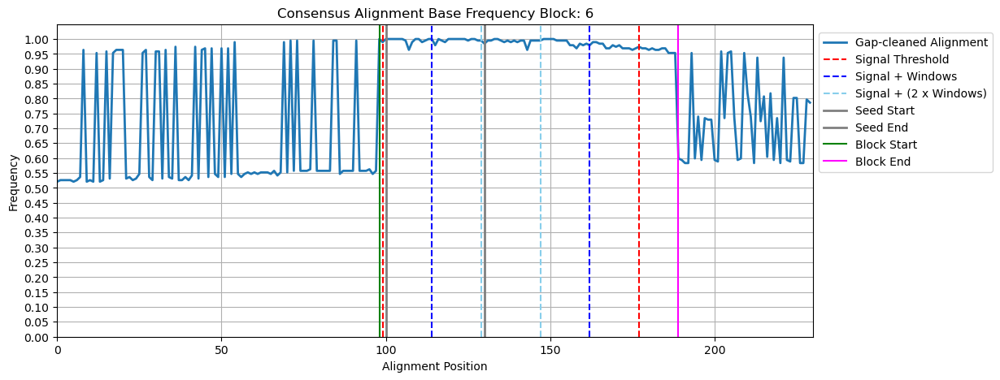

Working on target seed: k:304_c:184
Working on target seed: k:536_c:170
Working on target seed: k:585_c:168
Working on target seed: k:322_c:180
Working on target seed: k:528_c:170
Working on target seed: k:642_c:165
Working on target seed: k:655_c:165
Working on target seed: k:636_c:166
Working on target seed: k:335_c:177
Working on target seed: k:365_c:176
Working on target seed: k:348_c:176
Working on target seed: k:330_c:178
Working on target seed: k:324_c:178
Mapping seed: k:324_c:178

Processing Block Number: 7

Seed initial size: 30

Start signal Pos: 92
Mean Start signal Pos: 99
End signal Pos: 158
Mean End signal Pos: 153

Running: blastn -query /home/jpereira/OEs/Results/OE1/NamSeqs/Data/seed_extension/test/temp.seeds.fasta -subject /home/jpereira/OEs/Results/OE1/NamSeqs/Data/seed_extension/test/block-temp.fasta -out /home/jpereira/OEs/Results/OE1/NamSeqs/Data/seed_extension/test/temp.blast.seeds_fragment.tsv -reward 1 -gapextend 2 -gapopen 5 -penalty -2 -word_size 10 -outfmt 

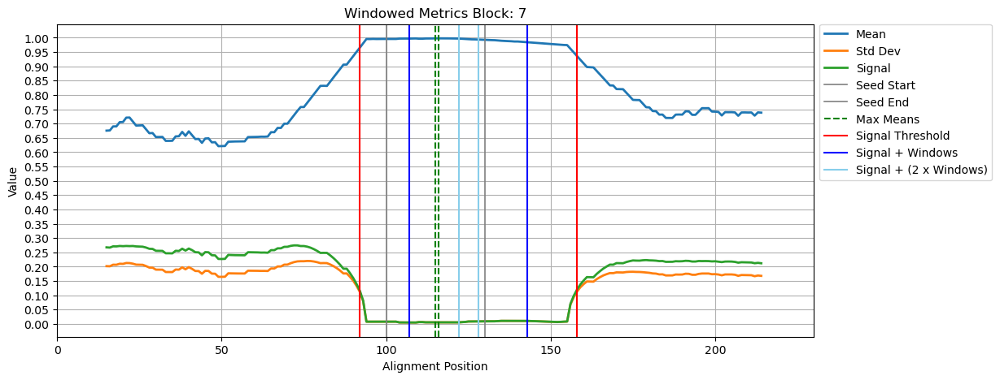

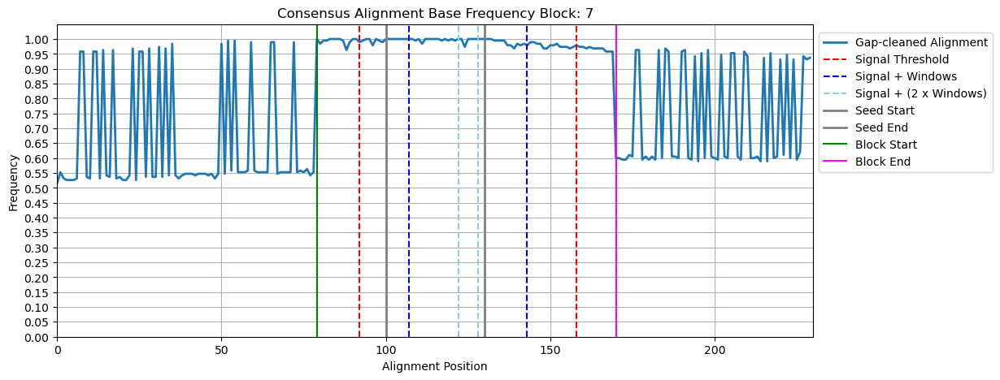

Working on target seed: k:343_c:177
Working on target seed: k:326_c:178
Working on target seed: k:325_c:178
Working on target seed: k:351_c:176
Working on target seed: k:332_c:177
Working on target seed: k:671_c:164
Working on target seed: k:3482_c:72
Working on target seed: k:596_c:168
Working on target seed: k:349_c:176
Working on target seed: k:1694_c:98
Working on target seed: k:375_c:176
Working on target seed: k:428_c:173
Working on target seed: k:352_c:176
Working on target seed: k:367_c:176
Working on target seed: k:360_c:176
Working on target seed: k:522_c:170
Working on target seed: k:572_c:169
Working on target seed: k:461_c:172
Working on target seed: k:342_c:177
Working on target seed: k:385_c:175
Mapping seed: k:385_c:175

Processing Block Number: 8

Seed initial size: 30

Start signal Pos: 47
Mean Start signal Pos: 53
End signal Pos: 193
Mean End signal Pos: 189

Running: blastn -query /home/jpereira/OEs/Results/OE1/NamSeqs/Data/seed_extension/test/temp.seeds.fasta -subj

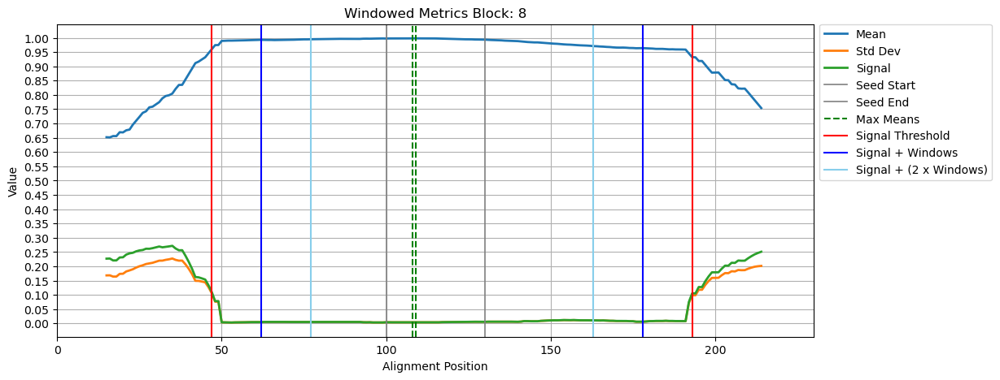

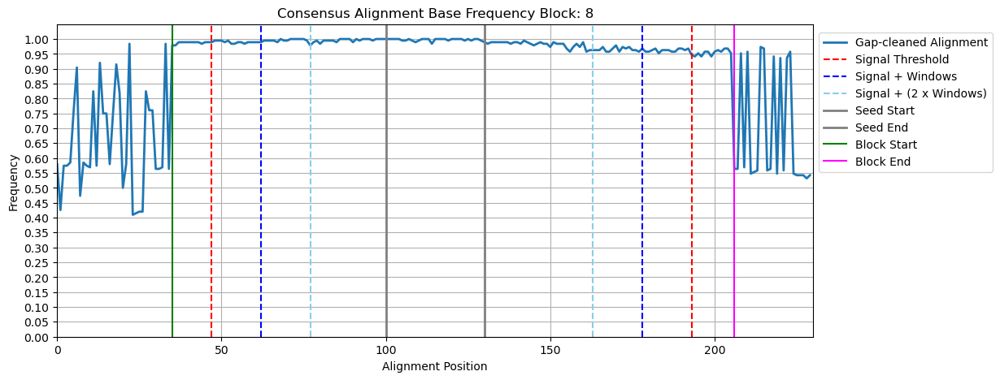

Working on target seed: k:340_c:177
Working on target seed: k:394_c:175
Working on target seed: k:427_c:173
Working on target seed: k:524_c:170
Working on target seed: k:664_c:164
Working on target seed: k:415_c:174
Mapping seed: k:415_c:174

Processing Block Number: 9

Seed initial size: 30
Warning! Alignment extension (529) != expected (530). Attempting to locate seed in consensus.

Start signal Pos: 90
Mean Start signal Pos: 98
End signal Pos: 470
Mean End signal Pos: 465

Running: blastn -query /home/jpereira/OEs/Results/OE1/NamSeqs/Data/seed_extension/test/temp.seeds.fasta -subject /home/jpereira/OEs/Results/OE1/NamSeqs/Data/seed_extension/test/block-temp.fasta -out /home/jpereira/OEs/Results/OE1/NamSeqs/Data/seed_extension/test/temp.blast.seeds_fragment.tsv -reward 1 -gapextend 2 -gapopen 5 -penalty -2 -word_size 10 -outfmt '6 qseqid sseqid pident length mismatch gapopen qstart qend sstart send evalue bitscore qlen slen'
blastn_subject ran successfully.


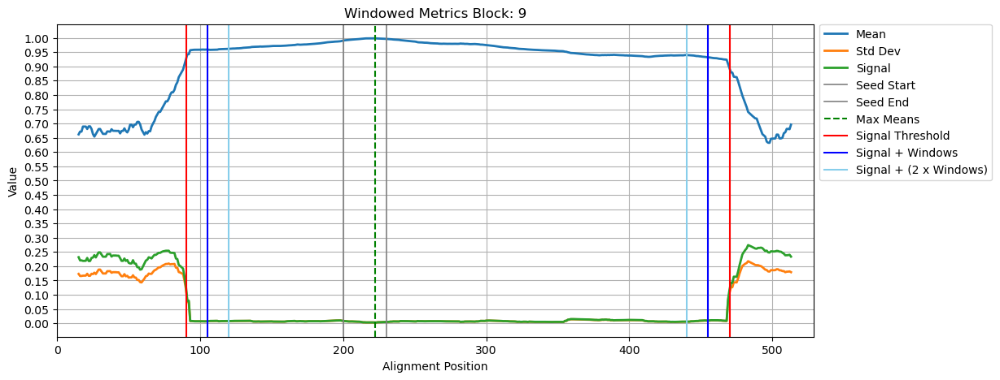

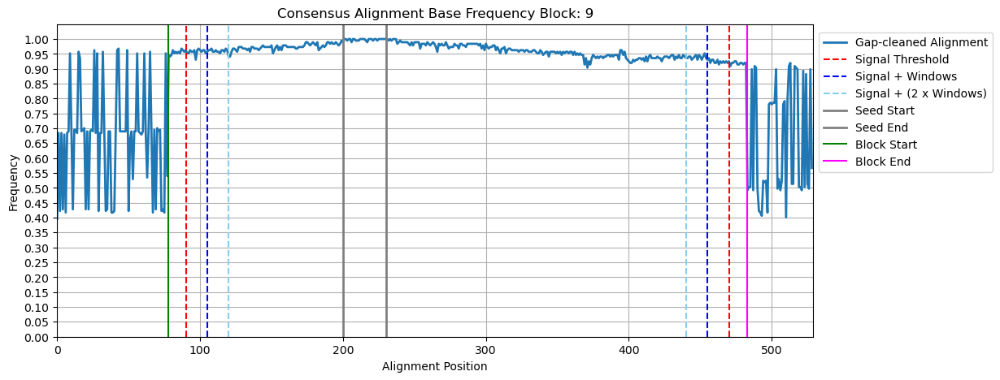

Working on target seed: k:423_c:173
Working on target seed: k:441_c:172
Working on target seed: k:443_c:172
Working on target seed: k:447_c:172
Working on target seed: k:694_c:162
Working on target seed: k:329_c:178
Working on target seed: k:409_c:174
Working on target seed: k:563_c:169
Working on target seed: k:347_c:176
Working on target seed: k:669_c:164
Working on target seed: k:371_c:176
Working on target seed: k:391_c:175
Working on target seed: k:368_c:176
Working on target seed: k:690_c:162
Working on target seed: k:611_c:167
Working on target seed: k:366_c:176
Working on target seed: k:565_c:169
Working on target seed: k:408_c:174
Working on target seed: k:437_c:173
Working on target seed: k:465_c:172
Working on target seed: k:412_c:174
Working on target seed: k:457_c:172
Working on target seed: k:695_c:161
Working on target seed: k:551_c:169
Working on target seed: k:355_c:176
Working on target seed: k:484_c:171
Working on target seed: k:610_c:167
Working on target seed: k:58

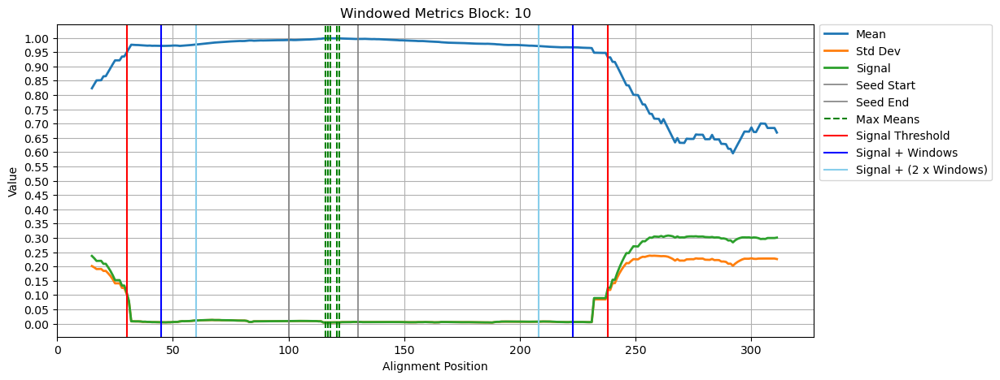

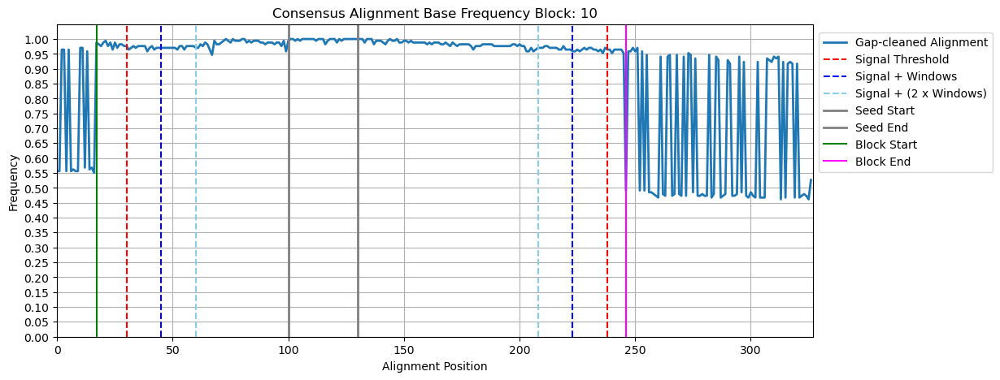

Working on target seed: k:763_c:158
Working on target seed: k:711_c:159
Working on target seed: k:750_c:158
Working on target seed: k:744_c:158
Working on target seed: k:791_c:157
Working on target seed: k:820_c:155
Working on target seed: k:751_c:158
Working on target seed: k:888_c:151
Working on target seed: k:760_c:158
Working on target seed: k:758_c:158
Working on target seed: k:823_c:155
Working on target seed: k:702_c:159
Working on target seed: k:722_c:159
Working on target seed: k:706_c:159
Working on target seed: k:709_c:159
Working on target seed: k:726_c:159
Working on target seed: k:728_c:158
Working on target seed: k:720_c:159
Mapping seed: k:720_c:159

Processing Block Number: 11

Seed initial size: 30

Start signal Pos: 72
Mean Start signal Pos: 79
End signal Pos: 160
Mean End signal Pos: 157

Running: blastn -query /home/jpereira/OEs/Results/OE1/NamSeqs/Data/seed_extension/test/temp.seeds.fasta -subject /home/jpereira/OEs/Results/OE1/NamSeqs/Data/seed_extension/test/blo

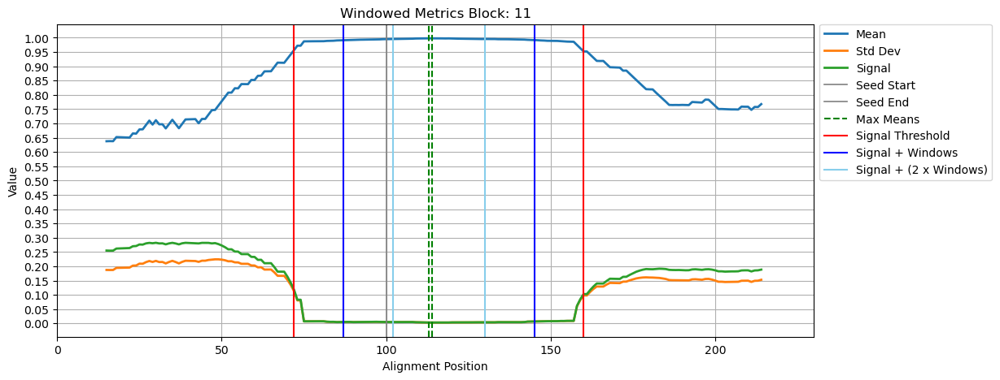

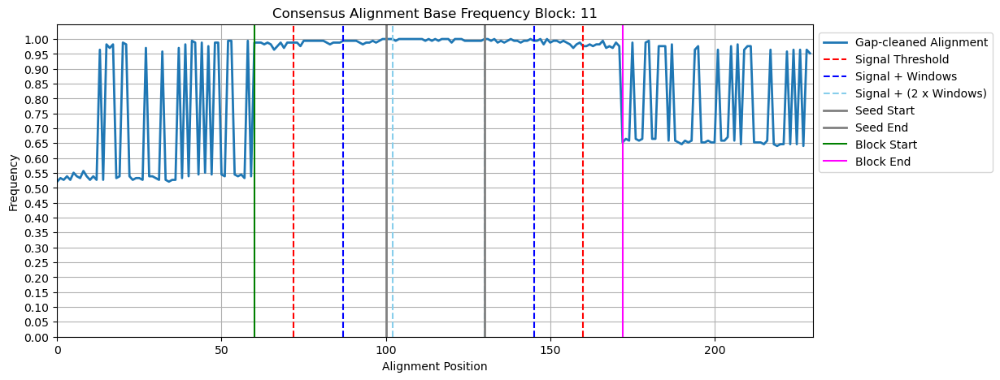

Working on target seed: k:731_c:158
Working on target seed: k:822_c:155
Working on target seed: k:845_c:154
Working on target seed: k:710_c:159
Mapping seed: k:710_c:159

Processing Block Number: 12

Seed initial size: 30

Start signal Pos: 73
Mean Start signal Pos: 80
End signal Pos: 161
Mean End signal Pos: 158

Running: blastn -query /home/jpereira/OEs/Results/OE1/NamSeqs/Data/seed_extension/test/temp.seeds.fasta -subject /home/jpereira/OEs/Results/OE1/NamSeqs/Data/seed_extension/test/block-temp.fasta -out /home/jpereira/OEs/Results/OE1/NamSeqs/Data/seed_extension/test/temp.blast.seeds_fragment.tsv -reward 1 -gapextend 2 -gapopen 5 -penalty -2 -word_size 10 -outfmt '6 qseqid sseqid pident length mismatch gapopen qstart qend sstart send evalue bitscore qlen slen'
blastn_subject ran successfully.


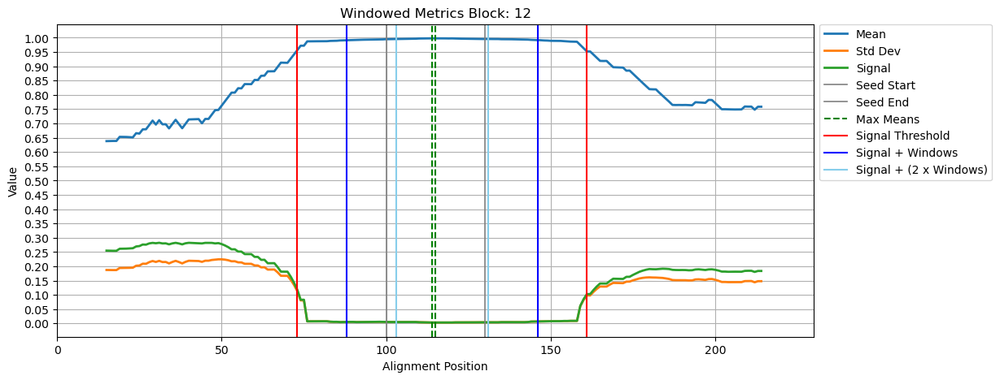

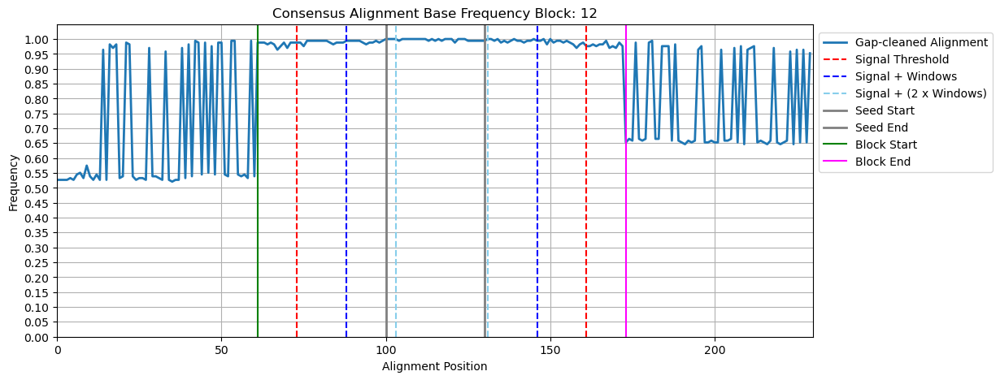

Working on target seed: k:707_c:159
Working on target seed: k:768_c:157
Working on target seed: k:719_c:159
Working on target seed: k:876_c:152
Working on target seed: k:743_c:158
Working on target seed: k:739_c:158
Working on target seed: k:761_c:158
Working on target seed: k:752_c:158
Working on target seed: k:737_c:158
Working on target seed: k:715_c:159
Working on target seed: k:700_c:160
Working on target seed: k:775_c:157
Working on target seed: k:861_c:153
Working on target seed: k:835_c:155
Working on target seed: k:708_c:159
Working on target seed: k:740_c:158
Working on target seed: k:902_c:150
Working on target seed: k:699_c:160
Working on target seed: k:886_c:151
Working on target seed: k:756_c:158
Working on target seed: k:759_c:158
Working on target seed: k:741_c:158
Working on target seed: k:865_c:153
Working on target seed: k:778_c:157
Working on target seed: k:718_c:159
Working on target seed: k:713_c:159
Working on target seed: k:725_c:159
Working on target seed: k:78

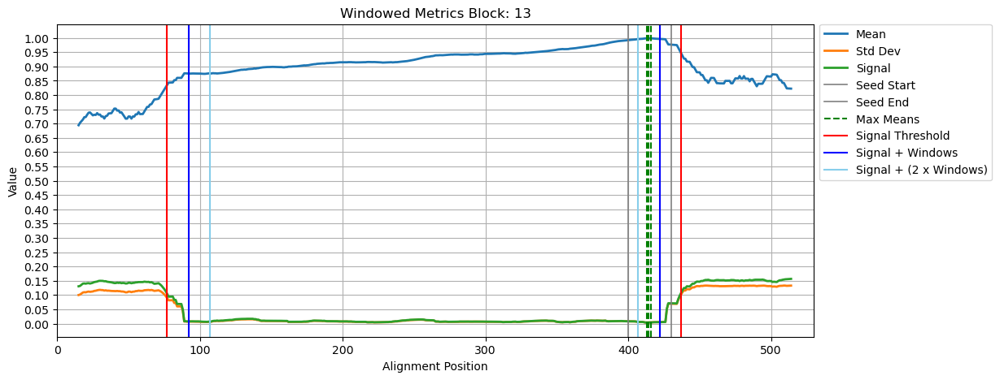

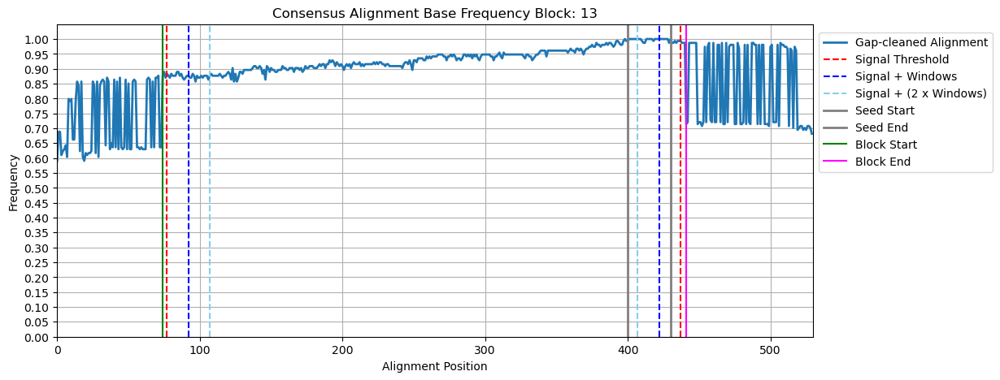

Working on target seed: k:925_c:146
Working on target seed: k:923_c:146
Working on target seed: k:932_c:145
Working on target seed: k:920_c:146
Working on target seed: k:924_c:146
Working on target seed: k:942_c:144
Working on target seed: k:928_c:145
Working on target seed: k:919_c:146
Working on target seed: k:951_c:144
Working on target seed: k:952_c:143
Working on target seed: k:922_c:146
Working on target seed: k:941_c:144
Working on target seed: k:936_c:145
Working on target seed: k:929_c:145
Working on target seed: k:931_c:145
Working on target seed: k:946_c:144
Working on target seed: k:948_c:144
Working on target seed: k:949_c:144
Working on target seed: k:938_c:144
Working on target seed: k:983_c:141
Working on target seed: k:980_c:141
Working on target seed: k:1639_c:102
Working on target seed: k:961_c:143
Working on target seed: k:973_c:141
Working on target seed: k:955_c:143
Working on target seed: k:994_c:140
Working on target seed: k:943_c:144
Working on target seed: k:9

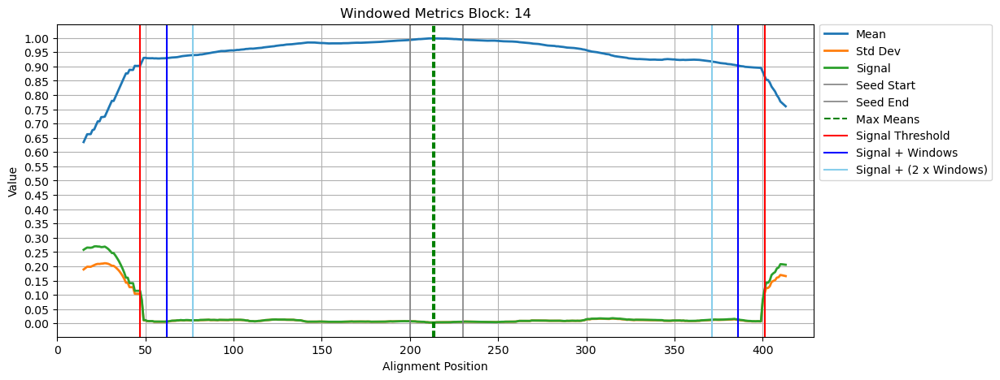

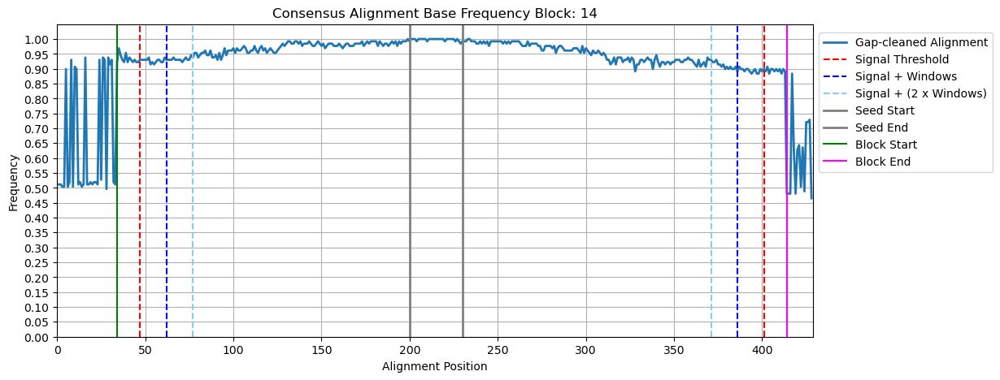

Working on target seed: k:1150_c:123
Working on target seed: k:1130_c:125
Working on target seed: k:1132_c:125
Working on target seed: k:1161_c:122
Working on target seed: k:1192_c:120
Working on target seed: k:1154_c:123
Working on target seed: k:1144_c:124
Working on target seed: k:1170_c:122
Working on target seed: k:1165_c:122
Working on target seed: k:1343_c:112
Working on target seed: k:1157_c:122
Working on target seed: k:1268_c:117
Working on target seed: k:1264_c:117
Working on target seed: k:1149_c:123
Working on target seed: k:1159_c:122
Working on target seed: k:1167_c:122
Working on target seed: k:1162_c:122
Working on target seed: k:1163_c:122
Working on target seed: k:1344_c:112
Working on target seed: k:1135_c:124
Working on target seed: k:1131_c:125
Working on target seed: k:1258_c:117
Working on target seed: k:1134_c:124
Working on target seed: k:1143_c:124
Working on target seed: k:1145_c:124
Working on target seed: k:1138_c:124
Working on target seed: k:1146_c:123
W

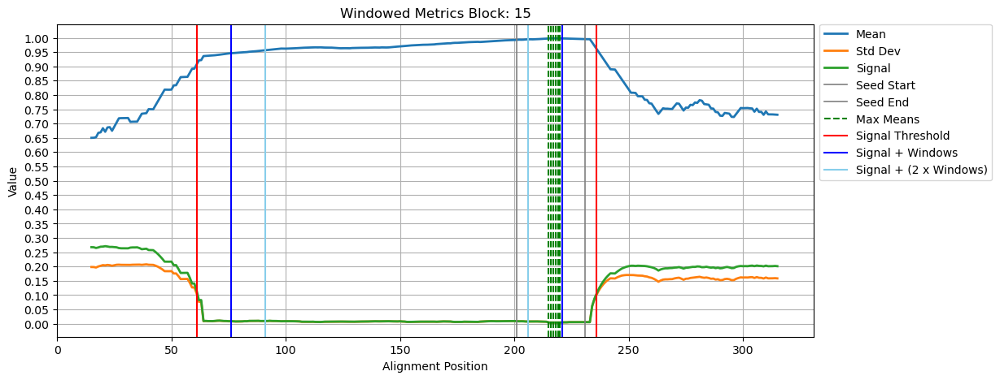

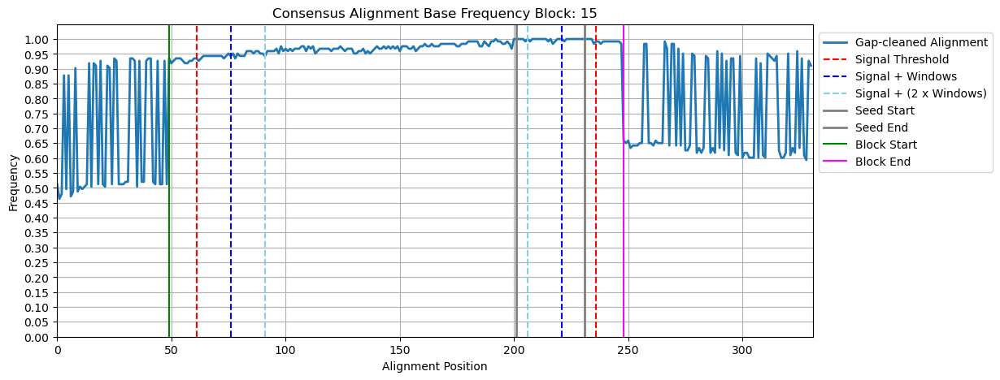

Working on target seed: k:1206_c:119
Working on target seed: k:1307_c:114
Working on target seed: k:1311_c:113
Working on target seed: k:1275_c:116
Working on target seed: k:1273_c:116
Working on target seed: k:1293_c:114
Working on target seed: k:1296_c:114
Working on target seed: k:1259_c:117
Working on target seed: k:1194_c:120
Working on target seed: k:1179_c:121
Working on target seed: k:1278_c:115
Working on target seed: k:1302_c:114
Working on target seed: k:1301_c:114
Working on target seed: k:1249_c:117
Working on target seed: k:1410_c:110
Working on target seed: k:1245_c:118
Working on target seed: k:1243_c:118
Working on target seed: k:1242_c:118
Working on target seed: k:1254_c:117
Working on target seed: k:1230_c:118
Working on target seed: k:1222_c:118
Working on target seed: k:1223_c:118
Working on target seed: k:1215_c:118
Working on target seed: k:1287_c:114
Working on target seed: k:1305_c:114
Working on target seed: k:1331_c:113
Working on target seed: k:1286_c:114
W

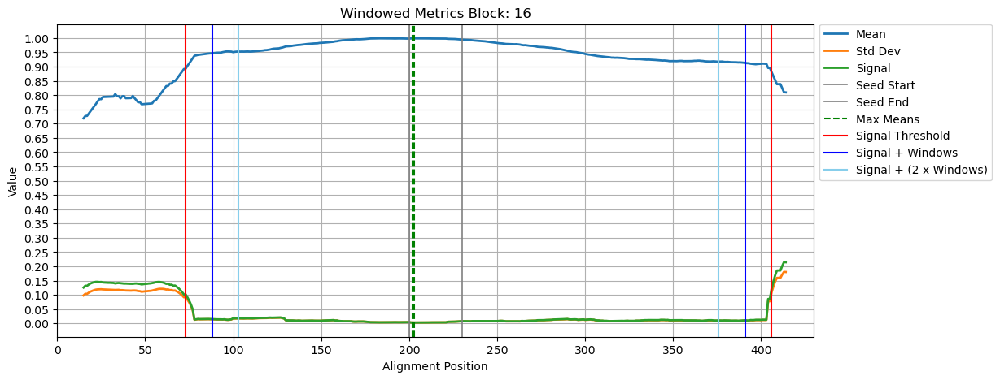

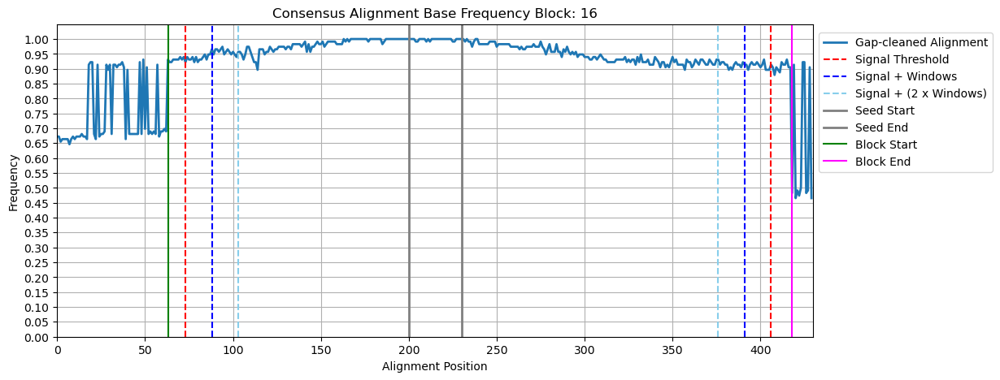

Working on target seed: k:1402_c:110
Working on target seed: k:1543_c:107
Working on target seed: k:1408_c:110
Working on target seed: k:1415_c:109
Working on target seed: k:1521_c:107
Working on target seed: k:1510_c:108
Working on target seed: k:1513_c:107
Working on target seed: k:1514_c:107
Working on target seed: k:1536_c:107
Working on target seed: k:1442_c:109
Working on target seed: k:1494_c:108
Working on target seed: k:1489_c:108
Working on target seed: k:1538_c:107
Working on target seed: k:1532_c:107
Working on target seed: k:1386_c:110
Working on target seed: k:1399_c:110
Working on target seed: k:1523_c:107
Working on target seed: k:1457_c:109
Working on target seed: k:1324_c:113
Mapping seed: k:1324_c:113

Processing Block Number: 17

Seed initial size: 30
Warning! Alignment extension (429) != expected (430). Attempting to locate seed in consensus.
Warning! Alignment extension (529) != expected (530). Attempting to locate seed in consensus.
Warning! Alignment extension (

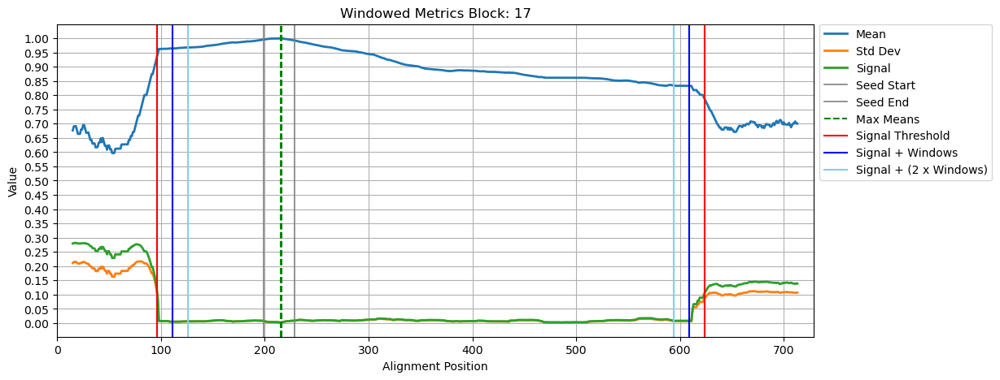

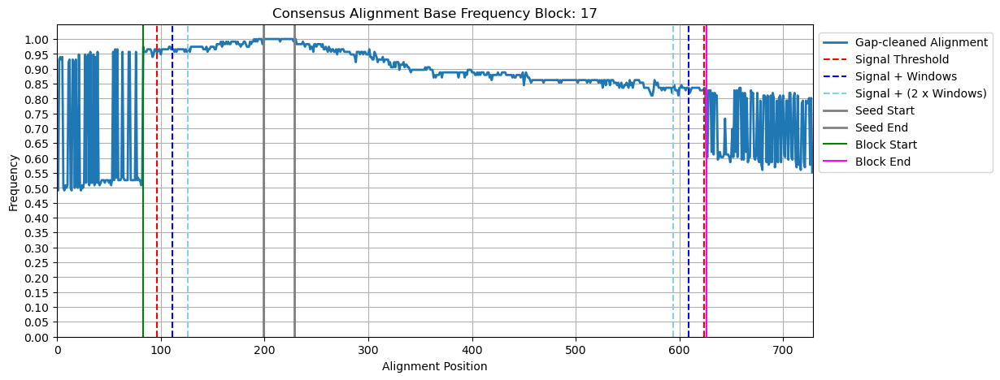

Working on target seed: k:1336_c:112
Working on target seed: k:1541_c:107
Working on target seed: k:1546_c:107
Working on target seed: k:1526_c:107
Working on target seed: k:1376_c:110
Working on target seed: k:1437_c:109
Working on target seed: k:1439_c:109
Working on target seed: k:1465_c:109
Working on target seed: k:1518_c:107
Working on target seed: k:1455_c:109
Working on target seed: k:1447_c:109
Working on target seed: k:1419_c:109
Working on target seed: k:1480_c:108
Working on target seed: k:1300_c:114
Working on target seed: k:1529_c:107
Working on target seed: k:1477_c:109
Working on target seed: k:1520_c:107
Working on target seed: k:1576_c:106
Working on target seed: k:1445_c:109
Working on target seed: k:1467_c:109
Working on target seed: k:1430_c:109
Working on target seed: k:1440_c:109
Working on target seed: k:1434_c:109
Working on target seed: k:1431_c:109
Working on target seed: k:1441_c:109
Working on target seed: k:1446_c:109
Working on target seed: k:1470_c:109
W

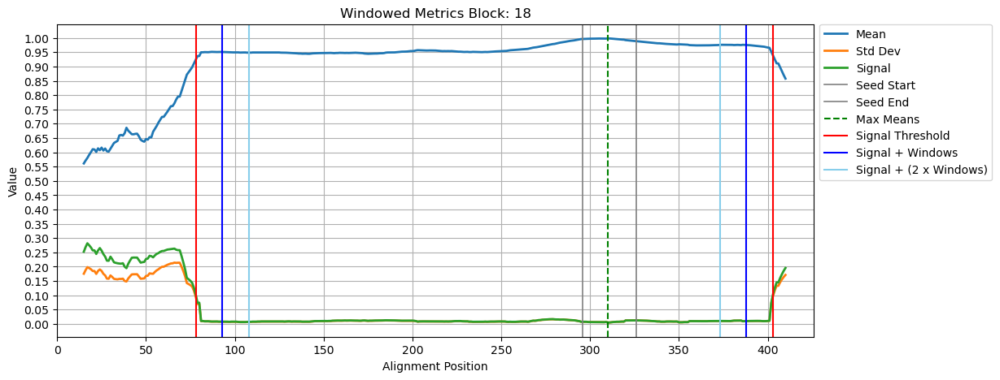

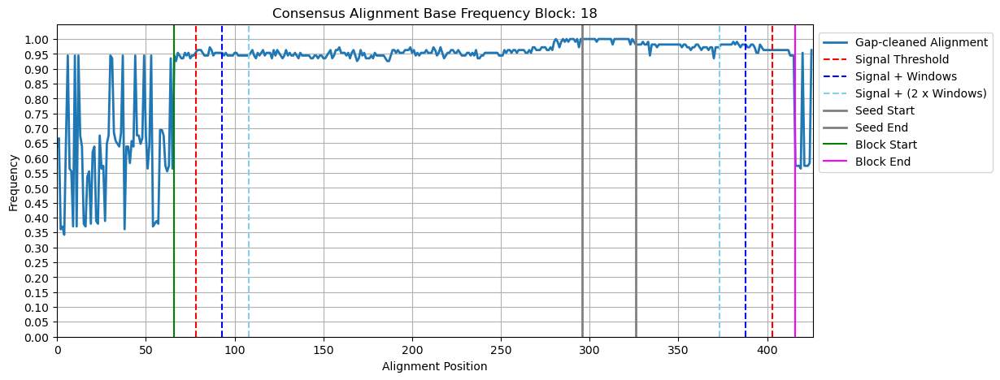

Working on target seed: k:1647_c:102
Working on target seed: k:1664_c:101
Working on target seed: k:1670_c:100
Working on target seed: k:1623_c:103
Working on target seed: k:1560_c:106
Working on target seed: k:1589_c:105
Working on target seed: k:1584_c:105
Working on target seed: k:1681_c:99
Working on target seed: k:1570_c:106
Working on target seed: k:1643_c:102
Working on target seed: k:1658_c:101
Working on target seed: k:1678_c:100
Working on target seed: k:1662_c:101
Working on target seed: k:1771_c:97
Working on target seed: k:1622_c:103
Working on target seed: k:1579_c:106
Working on target seed: k:1625_c:103
Working on target seed: k:1631_c:103
Working on target seed: k:1854_c:96
Working on target seed: k:1590_c:105
Working on target seed: k:1617_c:104
Working on target seed: k:1842_c:96
Working on target seed: k:1888_c:95
Mapping seed: k:1888_c:95

Processing Block Number: 19

Seed initial size: 30
Warning! Alignment extension (1017) != expected (1030). Attempting to locate

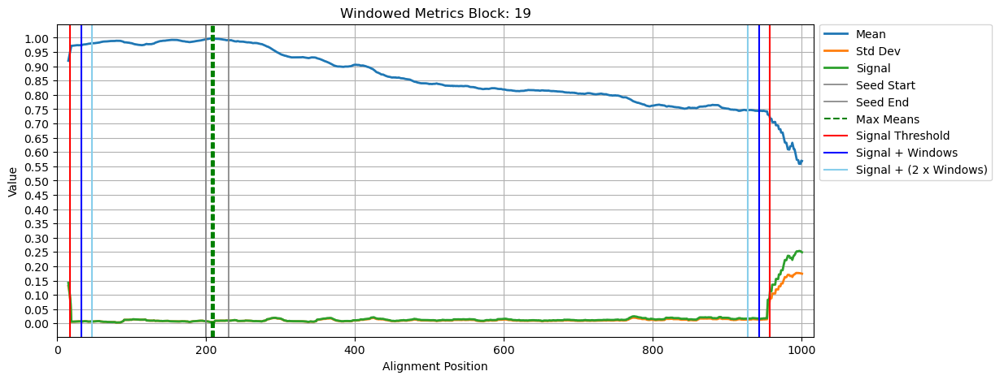

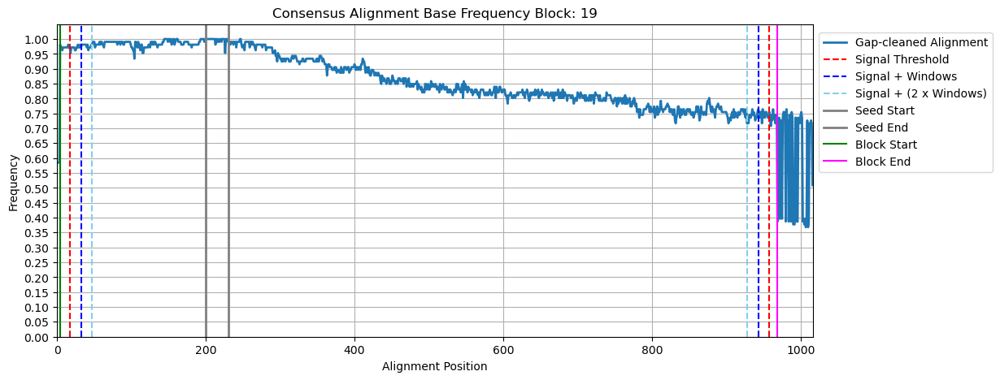

Working on target seed: k:1831_c:96
Working on target seed: k:1814_c:96
Working on target seed: k:1775_c:97
Working on target seed: k:1739_c:97
Working on target seed: k:1690_c:99
Working on target seed: k:1926_c:95
Working on target seed: k:1562_c:106
Working on target seed: k:1553_c:106
Working on target seed: k:1881_c:95
Working on target seed: k:1879_c:95
Working on target seed: k:1660_c:101
Working on target seed: k:1672_c:100
Working on target seed: k:1713_c:98
Working on target seed: k:1611_c:104
Working on target seed: k:1731_c:97
Working on target seed: k:1689_c:99
Working on target seed: k:1869_c:96
Working on target seed: k:2029_c:94
Working on target seed: k:1642_c:102
Working on target seed: k:1782_c:97
Working on target seed: k:1699_c:98
Working on target seed: k:1685_c:99
Working on target seed: k:1748_c:97
Working on target seed: k:1781_c:97
Working on target seed: k:1767_c:97
Working on target seed: k:1761_c:97
Working on target seed: k:1778_c:97
Working on target seed

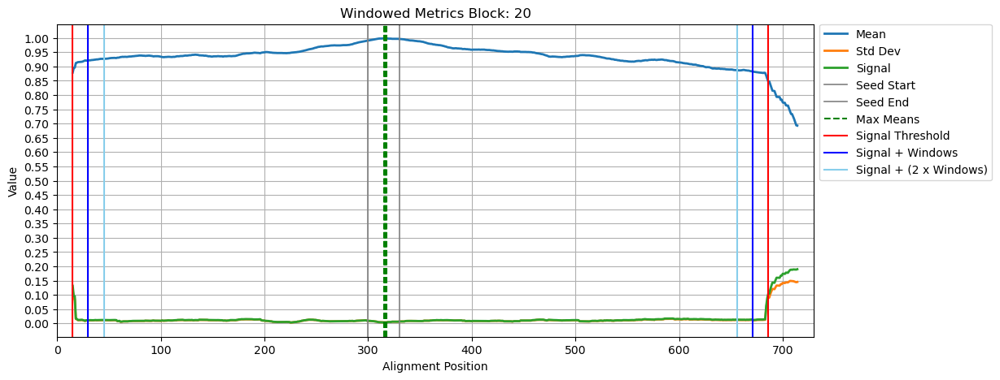

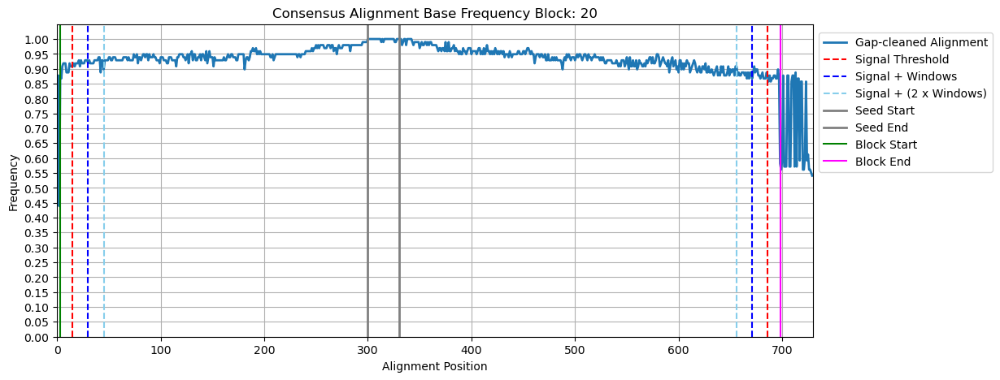

Working on target seed: k:2054_c:94
Working on target seed: k:2004_c:94
Working on target seed: k:2023_c:94
Working on target seed: k:2046_c:94
Working on target seed: k:2043_c:94
Working on target seed: k:2042_c:94
Working on target seed: k:2415_c:90
Working on target seed: k:2420_c:90
Working on target seed: k:1845_c:96
Working on target seed: k:2055_c:93
Working on target seed: k:2060_c:93
Working on target seed: k:2051_c:94
Working on target seed: k:1851_c:96
Working on target seed: k:1847_c:96
Working on target seed: k:2151_c:92
Working on target seed: k:2157_c:92
Working on target seed: k:1874_c:96
Working on target seed: k:1862_c:96
Working on target seed: k:1856_c:96
Working on target seed: k:1898_c:95
Working on target seed: k:1899_c:95
Working on target seed: k:1878_c:95
Working on target seed: k:1853_c:96
Working on target seed: k:2090_c:93
Working on target seed: k:2270_c:91
Working on target seed: k:1766_c:97
Working on target seed: k:2461_c:90
Working on target seed: k:24

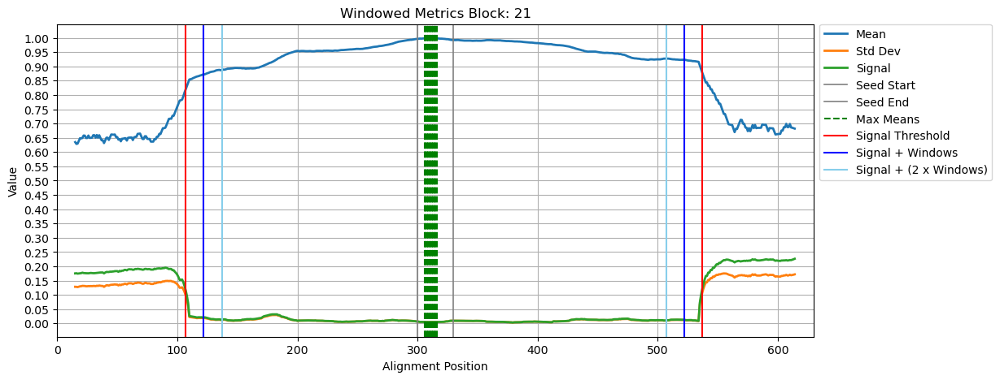

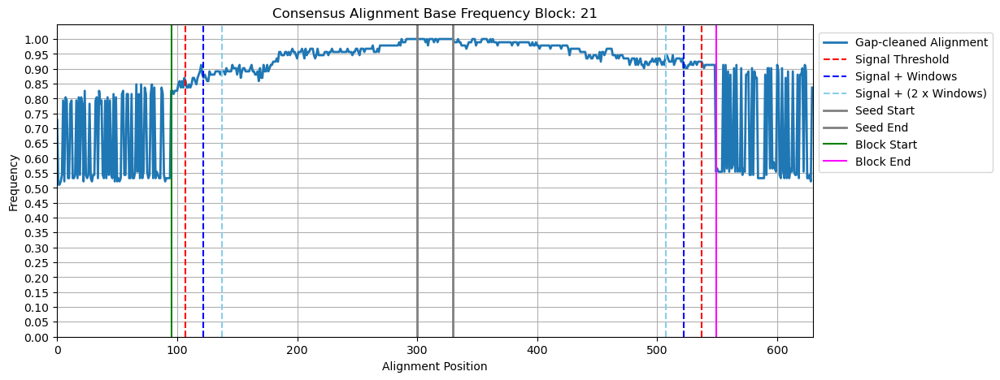

Working on target seed: k:2798_c:86
Working on target seed: k:2582_c:88
Working on target seed: k:2574_c:88
Working on target seed: k:2583_c:88
Working on target seed: k:2572_c:88
Working on target seed: k:2530_c:89
Working on target seed: k:2440_c:90
Working on target seed: k:2681_c:87
Working on target seed: k:2702_c:87
Working on target seed: k:2651_c:88
Working on target seed: k:2346_c:91
Working on target seed: k:2712_c:87
Working on target seed: k:2629_c:88
Working on target seed: k:2617_c:88
Working on target seed: k:2622_c:88
Working on target seed: k:2668_c:87
Working on target seed: k:2647_c:88
Working on target seed: k:2676_c:87
Working on target seed: k:2680_c:87
Working on target seed: k:2956_c:84
Working on target seed: k:2967_c:84
Working on target seed: k:2950_c:84
Working on target seed: k:2397_c:90
Working on target seed: k:2294_c:91
Working on target seed: k:2914_c:85
Working on target seed: k:2591_c:88
Working on target seed: k:2533_c:89
Working on target seed: k:25

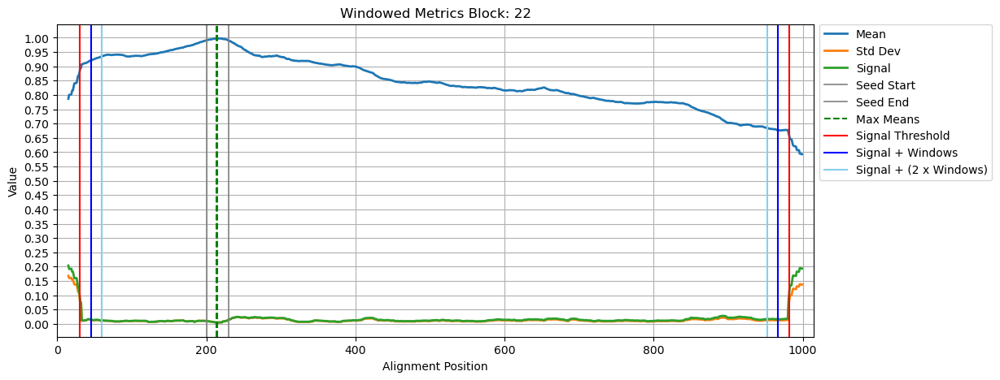

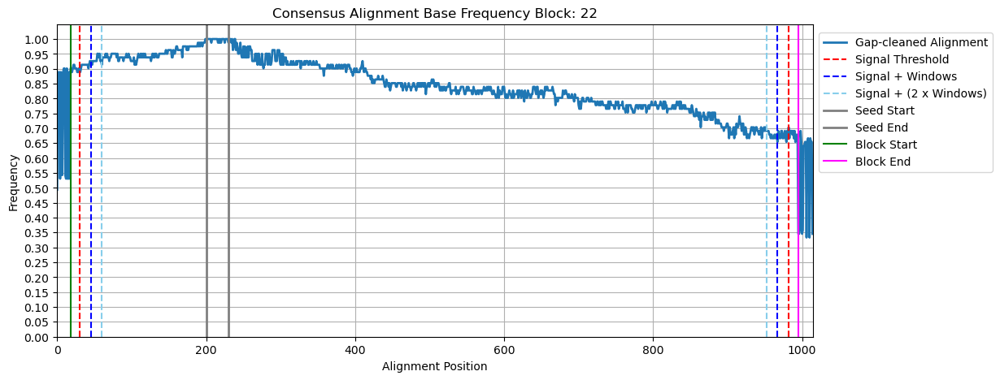

Working on target seed: k:3121_c:75
Working on target seed: k:3120_c:75
Working on target seed: k:3071_c:76
Working on target seed: k:3111_c:75
Working on target seed: k:3033_c:78
Working on target seed: k:3117_c:75
Mapping seed: k:3117_c:75

Processing Block Number: 23

Seed initial size: 30
Warning! Alignment extension (724) != expected (730). Attempting to locate seed in consensus.

Start signal Pos: 38
Mean Start signal Pos: 46
End signal Pos: 633
Mean End signal Pos: 628

Running: blastn -query /home/jpereira/OEs/Results/OE1/NamSeqs/Data/seed_extension/test/temp.seeds.fasta -subject /home/jpereira/OEs/Results/OE1/NamSeqs/Data/seed_extension/test/block-temp.fasta -out /home/jpereira/OEs/Results/OE1/NamSeqs/Data/seed_extension/test/temp.blast.seeds_fragment.tsv -reward 1 -gapextend 2 -gapopen 5 -penalty -2 -word_size 10 -outfmt '6 qseqid sseqid pident length mismatch gapopen qstart qend sstart send evalue bitscore qlen slen'
blastn_subject ran successfully.


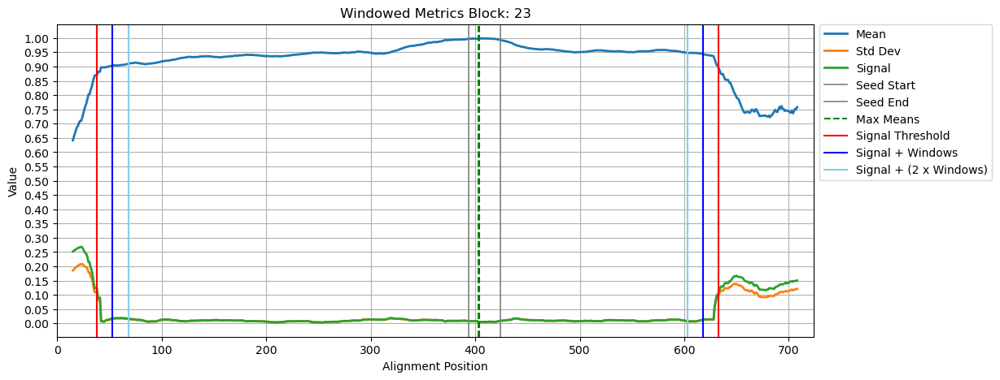

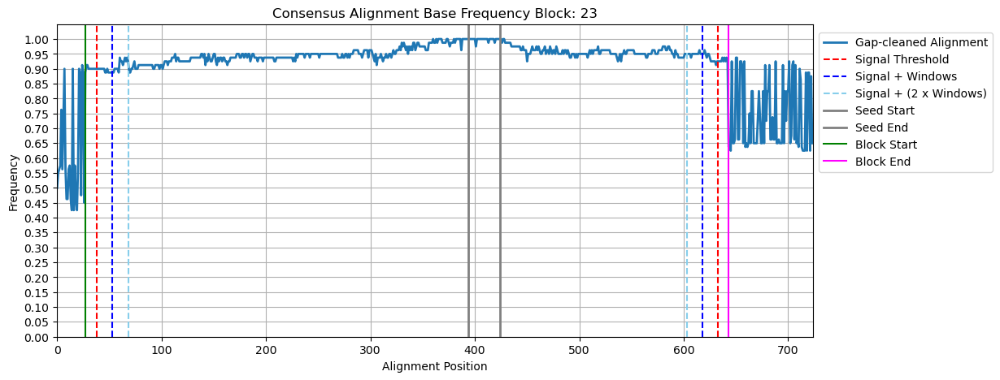

Working on target seed: k:3131_c:75
Working on target seed: k:3470_c:73
Working on target seed: k:3237_c:74
Working on target seed: k:3514_c:72
Working on target seed: k:3171_c:75
Working on target seed: k:3135_c:75
Working on target seed: k:3067_c:76
Working on target seed: k:3177_c:75
Working on target seed: k:3289_c:74
Working on target seed: k:3760_c:71
Working on target seed: k:3156_c:75
Working on target seed: k:3199_c:75
Working on target seed: k:3166_c:75
Working on target seed: k:3168_c:75
Working on target seed: k:3154_c:75
Working on target seed: k:3408_c:73
Working on target seed: k:3439_c:73
Working on target seed: k:3139_c:75
Working on target seed: k:3272_c:74
Working on target seed: k:3080_c:76
Working on target seed: k:3088_c:76
Working on target seed: k:3037_c:77
Working on target seed: k:3305_c:74
Working on target seed: k:3044_c:76
Working on target seed: k:3331_c:74
Working on target seed: k:3314_c:74
Working on target seed: k:3038_c:77
Working on target seed: k:33

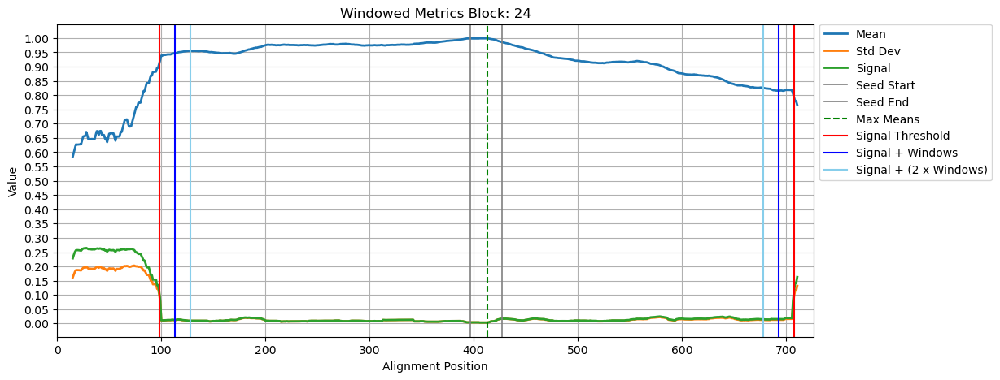

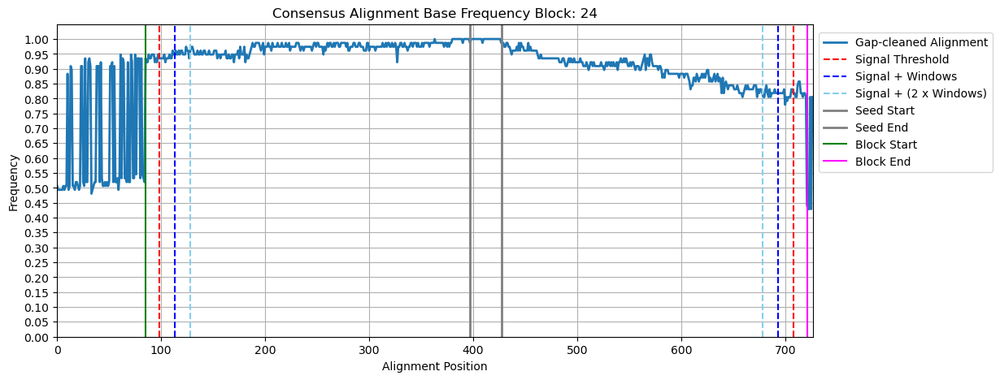

Working on target seed: k:3253_c:74
Working on target seed: k:3299_c:74
Working on target seed: k:3485_c:72
Working on target seed: k:3098_c:75
Working on target seed: k:3267_c:74
Working on target seed: k:3054_c:76
Working on target seed: k:3049_c:76
Working on target seed: k:3063_c:76
Working on target seed: k:3050_c:76
Working on target seed: k:3273_c:74
Working on target seed: k:3574_c:72
Working on target seed: k:3452_c:73
Working on target seed: k:3503_c:72
Working on target seed: k:3391_c:73
Working on target seed: k:3060_c:76
Working on target seed: k:3542_c:72
Working on target seed: k:3236_c:74
Working on target seed: k:3316_c:74
Working on target seed: k:3132_c:75
Working on target seed: k:3051_c:76
Working on target seed: k:3458_c:73
Working on target seed: k:3309_c:74
Working on target seed: k:3325_c:74
Working on target seed: k:3312_c:74
Working on target seed: k:3334_c:74
Working on target seed: k:3461_c:73
Working on target seed: k:3276_c:74
Working on target seed: k:32

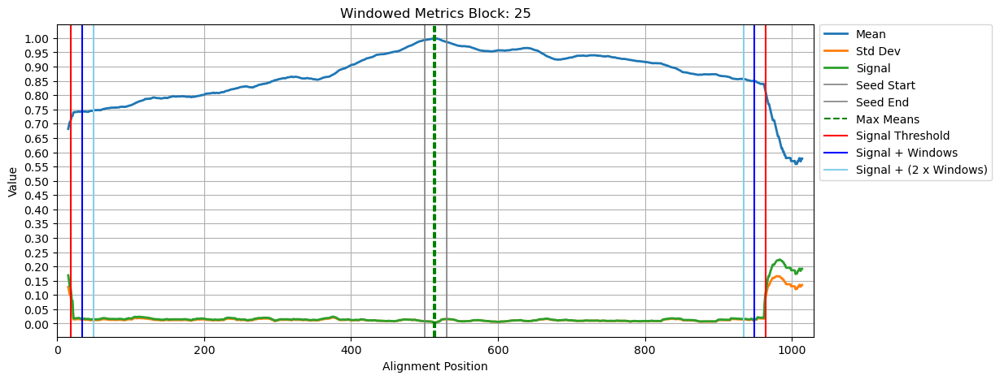

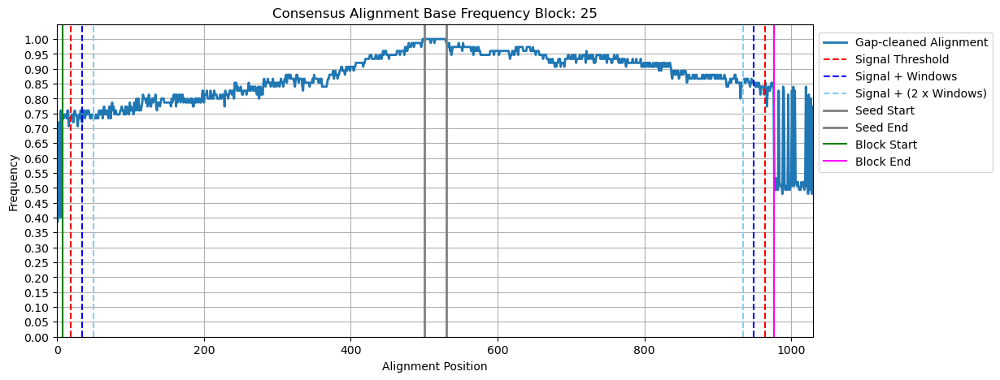

Working on target seed: k:3548_c:72
Working on target seed: k:3532_c:72
Working on target seed: k:3481_c:72
Working on target seed: k:3529_c:72
Working on target seed: k:3365_c:73
Working on target seed: k:3972_c:70
Working on target seed: k:3964_c:70
Working on target seed: k:3914_c:70
Working on target seed: k:3404_c:73
Working on target seed: k:3410_c:73
Working on target seed: k:3411_c:73
Working on target seed: k:3397_c:73
Working on target seed: k:4017_c:70
Working on target seed: k:3977_c:70
Working on target seed: k:3930_c:70
Working on target seed: k:3396_c:73
Working on target seed: k:3941_c:70
Working on target seed: k:3398_c:73
Working on target seed: k:3421_c:73
Working on target seed: k:3885_c:70
Working on target seed: k:3887_c:70
Working on target seed: k:3602_c:72
Working on target seed: k:3605_c:72
Working on target seed: k:4072_c:69
Working on target seed: k:3377_c:73
Working on target seed: k:3200_c:75
Working on target seed: k:3193_c:75
Working on target seed: k:32

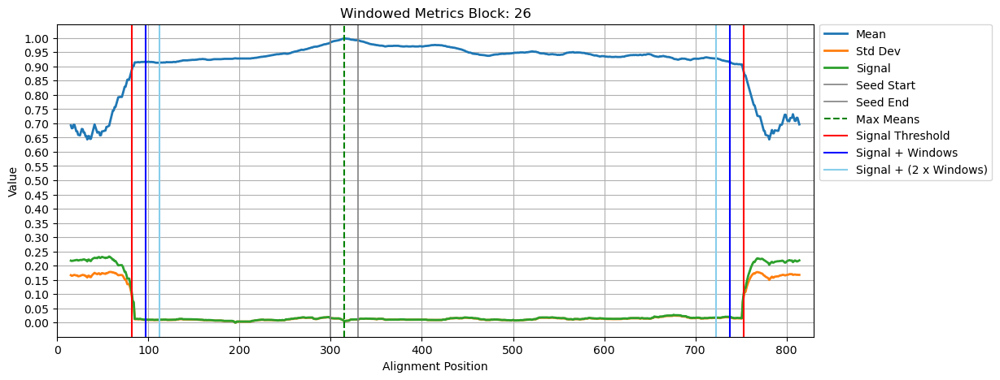

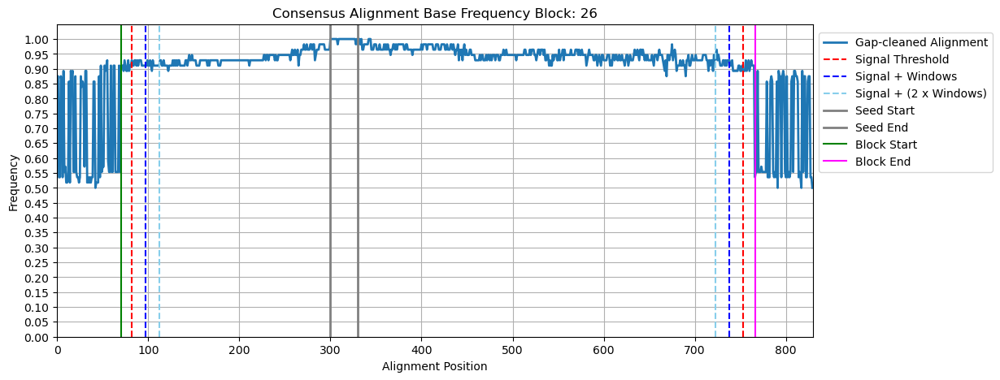

Working on target seed: k:4867_c:54
Working on target seed: k:4908_c:53
Working on target seed: k:4824_c:54
Working on target seed: k:4907_c:53
Working on target seed: k:4841_c:54
Working on target seed: k:4827_c:54
Working on target seed: k:4848_c:54
Working on target seed: k:4837_c:54
Working on target seed: k:4823_c:54
Working on target seed: k:4995_c:51
Working on target seed: k:4831_c:54
Working on target seed: k:4830_c:54
Working on target seed: k:4829_c:54
Working on target seed: k:4842_c:54
Working on target seed: k:4844_c:54
Working on target seed: k:4843_c:54
Working on target seed: k:4942_c:52
Working on target seed: k:4926_c:52
Working on target seed: k:4899_c:53
Working on target seed: k:4855_c:54
Working on target seed: k:4865_c:54
Working on target seed: k:4864_c:54
Working on target seed: k:4858_c:54
Working on target seed: k:4857_c:54
Working on target seed: k:4832_c:54
Working on target seed: k:4828_c:54
Working on target seed: k:4833_c:54
Working on target seed: k:48

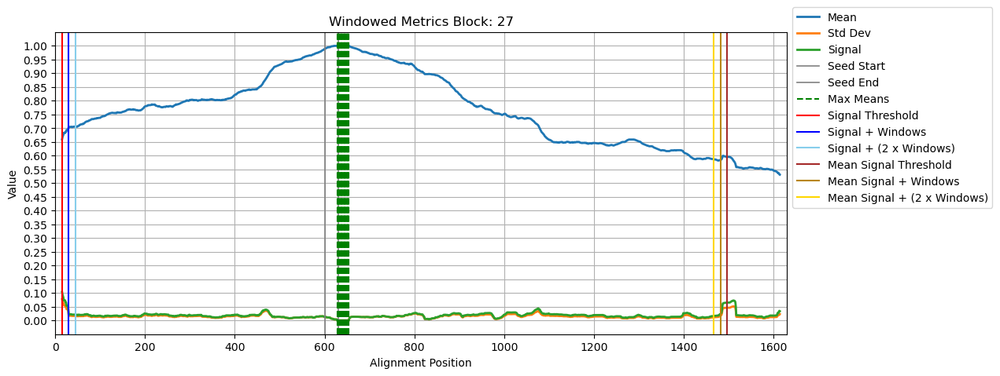

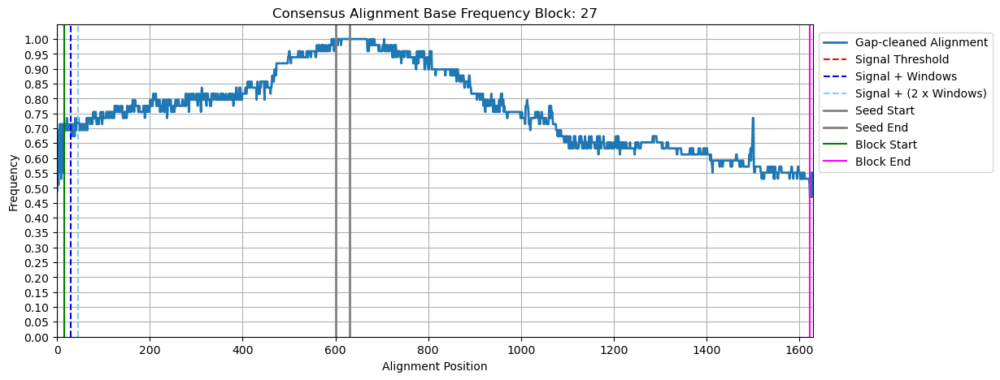

Working on target seed: k:5025_c:49
Working on target seed: k:5026_c:49
Working on target seed: k:5028_c:49
Working on target seed: k:5031_c:49
Working on target seed: k:5041_c:49
Working on target seed: k:5040_c:49
Working on target seed: k:5039_c:49
Working on target seed: k:5034_c:49
Working on target seed: k:5027_c:49
Working on target seed: k:5146_c:46
Working on target seed: k:5096_c:47
Working on target seed: k:5084_c:48
Working on target seed: k:5045_c:49
Working on target seed: k:5053_c:48
Working on target seed: k:5043_c:49
Working on target seed: k:5119_c:47
Working on target seed: k:5070_c:48
Working on target seed: k:5058_c:48
Working on target seed: k:5055_c:48
Working on target seed: k:5082_c:48
Working on target seed: k:5188_c:45
Working on target seed: k:5197_c:45
Working on target seed: k:5141_c:46
Working on target seed: k:5193_c:45
Working on target seed: k:5164_c:46
Working on target seed: k:5145_c:46
Working on target seed: k:5135_c:46
Working on target seed: k:51

In [9]:
results = extend_seeds_to_blocks(
    output_dir=output_dir,
    seeds_df=seeds_df,
    seeds_hits_df=seeds_hits_df,
    blast_df=blast_df,
    input_reads_fasta=input_reads_fasta,
    align_seed_neighbours=align_seed_neighbours,
    find_block_boundaries=find_block_boundaries,
    blastn_subject=blastn_subject,
    default_blast_columns=default_blast_columns,
    params_aln_w_step_size=params_aln_w_step_size,
    params_window_radius=params_window_radius,
    params_signal_threshold=params_signal_threshold,
    params_mean_signal_threshold=params_mean_signal_threshold,
    params_max_aln_extension=params_max_aln_extension,
    params_seed_map_coverage_threshold=params_seed_map_coverage_threshold,
    # optional overrides:
    threads=10, max_iter=100, gap_open=1.0, gap_extend=0.1, make_plots=True,
)
print("Blocks FASTA:", results["blocks_fasta"])
print("Mapped seeds:", len(results["mapped_seeds"]))
print("Blocks found:", len(results["blocks"]))


array([[<Axes: title={'center': 'sseqid'}>]], dtype=object)

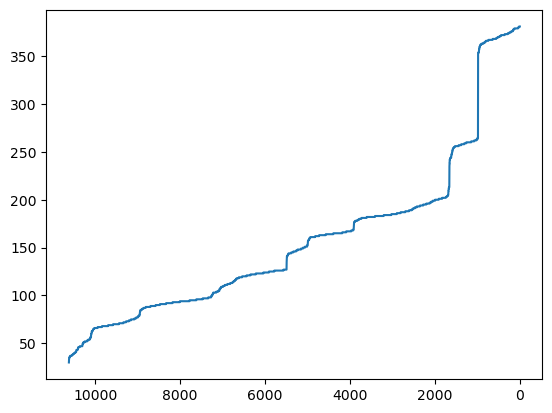

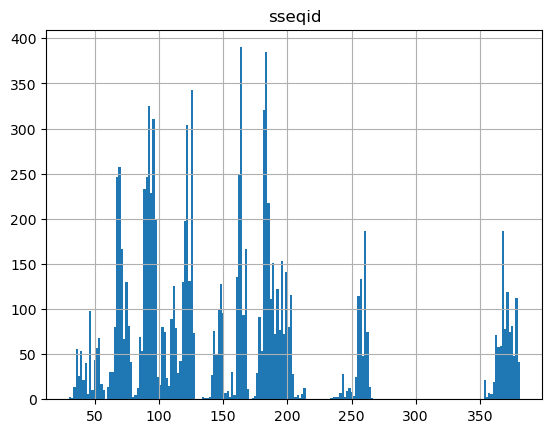

In [13]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from utils.block_utils import align_seed_neighbours, find_block_boundaries
from utils.blast_utils import blastn_subject
x_array = np.linspace(1, len(seeds_hits_df), num=len(seeds_hits_df))
plt.plot(seeds_hits_df['sseqid'])
plt.gca().invert_xaxis()
seeds_hits_df.hist(bins=200)

# Signal Algorithm

If the signal is left to the seed start pos, start from a position in df_clean that fulfils:
-min(seed_end_pos, sigleft + 4 * w_radious)
Then start for the bigger pos values and checks frequencies until drops bellow:
-0.85
or 
-mean(Freqs[sigleft + 3 * w_radious : sigright + 4 * w_radious]) - signal_threshold /2
or
-mean(Freqs[sigleft + 3 * w_radious : sigright + 4 * w_radious]) - 0.1

In [14]:
import seaborn as sns
import matplotlib as plt

def _plot_consensus( consensus_df: pd.DataFrame):
    # ---------------- Prepare data ----------------
    sns.set_theme(style="whitegrid")
    df_clean = consensus_df[consensus_df['base'] != '-'].copy() # if df_cons already exists
    df_cons = consensus_df.copy()                   

    df_clean['pos'] = np.arange(1, len(df_clean) + 1)   # 1-based position
    df_cons['pos'] = np.arange(1, len(df_cons) + 1)   # 1-based position

    fig, axs = plt.subplots(nrows=2, figsize=(12, 10), sharey=True)

    # 1️⃣  Plot without gaps
    sns.lineplot(
        data=df_clean,
        x='pos', y='freq',
        ax=axs[0]
    )
    axs[0].set_title('Consensus without gaps')
    axs[0].set_xlabel('Alignment position')
    axs[0].set_ylabel('Frequency of consensus base')

    # 2️⃣  Plot with all columns
    sns.lineplot(
        data=df_cons,
        x='pos', y='freq',
        ax=axs[1],
        color='tab:orange'
    )
    axs[1].set_title('Consensus including gaps')
    axs[1].set_xlabel('Alignment position')

    plt.ylim((0,1))
    plt.tight_layout()
    plt.show()
    return
